In [1]:
import sys
sys.path.append("..")

from glob import glob
import matplotlib.pyplot as plt
import ipywidgets as ipw
from IPython.display import Audio
import numpy as np
import pickle

from communicative_agent import CommunicativeAgent
from lib.dataset_wrapper import Dataset
from lib.notebooks import show_ema

from external import lpcynet

In [4]:
agents_path = glob("../out/communicative_agent/*/")
agents_path.sort()

agents_path = ['../out/communicative_agent/Submission_CoLing/2ac538e9286d27b697a1228522f55e7b-0']

In [5]:
agents_alias = []

for agent_path in agents_path:
    agent = CommunicativeAgent.reload(agent_path, load_nn=False)
    config = agent.config
    
    if agent.synthesizer.config['dataset']['art_type'] == "ema":
        continue
    
    agent_alias = " ".join((
        agent_path[-5:-1],
        f"{','.join(agent.sound_quantizer.config['dataset']['names'])}",
        f"synth_art={agent.synthesizer.config['dataset']['art_type']}",
        f"jerk={config['training']['jerk_loss_weight']}",
    ))
    
    agents_alias.append((agent_alias, agent_path))

In [6]:
def show_agent(agent_path):
    agent = CommunicativeAgent.reload(agent_path)
    
    sound_type = agent.synthesizer.config["dataset"]["sound_type"]
    art_type = agent.synthesizer.config["dataset"]["art_type"]
    synth_dataset = agent.synthesizer.dataset
    
    def show_dataset(dataset_name):
        dataset = Dataset(dataset_name)
        items_cepstrum = dataset.get_items_data(sound_type, cut_silences=True)
        items_source = dataset.get_items_data("source", cut_silences=True)
        sampling_rate = dataset.features_config["wav_sampling_rate"]
        
        # items_ema = dataset.get_items_data("ema", cut_silences=True)
        
        items_name = dataset.get_items_list()
        
        def resynth_item(item_name):
            item_cepstrum = items_cepstrum[item_name]
            item_source = items_source[item_name]
            item_wave = dataset.get_item_wave(item_name)
            nb_frames = len(item_cepstrum)
            
            repetition = agent.repeat(item_cepstrum)
            repeated_cepstrum = repetition["sound_repeated"]
            estimated_cepstrum = repetition["sound_estimated"]
            estimated_art = repetition["art_estimated"]
            
            repeated_sound = np.concatenate((repeated_cepstrum, item_source), axis=1)
            estimated_sound = np.concatenate((estimated_cepstrum, item_source), axis=1)

            repeated_wave = lpcynet.synthesize_frames(repeated_sound)
            estimated_wave = lpcynet.synthesize_frames(estimated_sound)
            
            print("Original sound:")
            display(Audio(item_wave, rate=sampling_rate))
            print("Repetition (Inverse model → Synthesizer → LPCNet):")
            display(Audio(repeated_wave, rate=sampling_rate))
            print("Estimation (Inverse model → Direct model → LPCNet):")
            display(Audio(estimated_wave, rate=sampling_rate))
            
            plt.figure(figsize=(nb_frames/20, 6), dpi=120)
            
            ax = plt.subplot(311)
            ax.set_title("original %s" % (sound_type))
            ax.imshow(item_cepstrum.T, origin="lower")
            
            ax = plt.subplot(312)
            ax.set_title("Repetition")
            ax.imshow(repeated_cepstrum.T, origin="lower")
            
            ax = plt.subplot(313)
            ax.set_title("Estimation")
            ax.imshow(estimated_cepstrum.T, origin="lower")
            
            plt.tight_layout()
            plt.show()
            
            if art_type == "art_params":
                estimated_art = synth_dataset.art_to_ema(estimated_art)
            # item_ema = items_ema[item_name]
            show_ema(estimated_art, reference=None, dataset=synth_dataset)
        
        display(ipw.interactive(resynth_item, item_name=items_name))
    display(ipw.interactive(show_dataset, dataset_name=agent.sound_quantizer.config["dataset"]["names"]))

display(ipw.interactive(show_agent, agent_path=agents_alias))

interactive(children=(Dropdown(description='agent_path', options=(('e7b- pb2007 synth_art=art_params jerk=0', …

In [5]:
bn = 'lambda_0'
agent_path = '../out/communicative_agent/to_keep_50_n_layers_1_right_test/22e9cdcab1563dd5a97cce718987db69-0'
agent = CommunicativeAgent.reload(agent_path)
dataset = Dataset('pb2007')
items_name = dataset.get_items_list()
sound_type = agent.synthesizer.config["dataset"]["sound_type"]
art_type = agent.synthesizer.config["dataset"]["art_type"]
synth_dataset = agent.synthesizer.dataset
items_cepstrum = dataset.get_items_data(sound_type, cut_silences=True)
items_source = dataset.get_items_data("source", cut_silences=True)
for item_name in items_name:
    item_name = item_name[1]
    print(item_name)
    item_cepstrum = items_cepstrum[item_name]
    item_source = items_source[item_name]
    item_wave = dataset.get_item_wave(item_name)
    nb_frames = len(item_cepstrum)


    # save item_wave and repeated sound
    item_wave =  Audio(item_wave, rate=16000)
    with open(agent_path + ('/original_%s_%s.wav' % (item_name, bn)), 'wb') as f:
            f.write(item_wave.data)
   

FileNotFoundError: [Errno 2] No such file or directory: '../out/communicative_agent/to_keep_50_n_layers_1_right_test/22e9cdcab1563dd5a97cce718987db69-0/config.yaml'

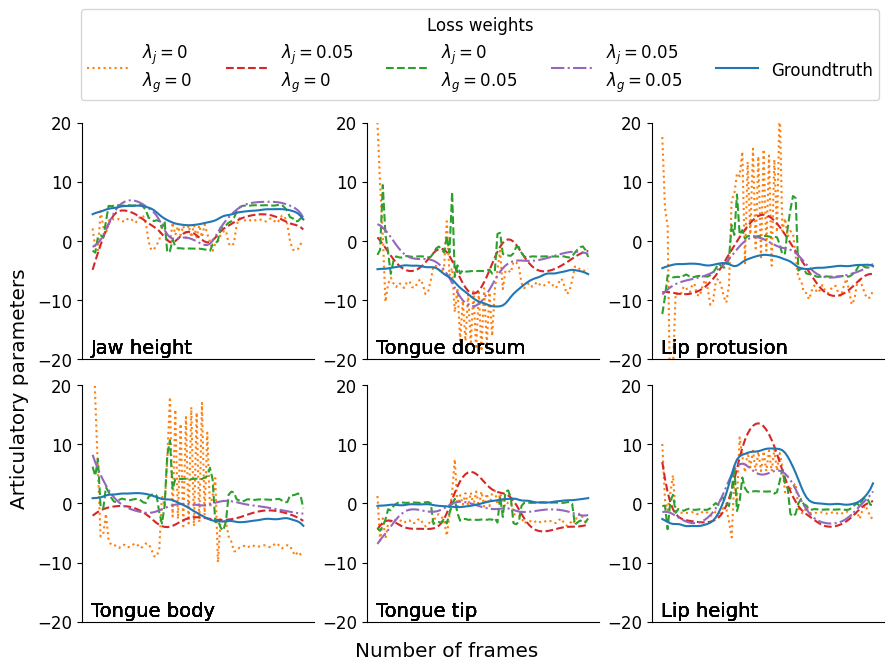

In [15]:
import torch
import matplotlib.pyplot as plt
from communicative_agent import CommunicativeAgent
from lib.dataset_wrapper import Dataset
import matplotlib

matplotlib.rcParams['font.family'] = 'sans-serif'
matplotlib.rcParams['font.serif'] = 'Arial'
matplotlib.rcParams.update({'font.size': 12, 'legend.handleheight':1, 'hatch.linewidth': 2.0,
                           'lines.markersize':5, 'lines.linewidth':1.5})

def display_param(param, ax, label_curve, linestyle='-', color=None):
    labels = ["Jaw height", "Tongue body", "Tongue dorsum", "Tongue tip", "Lip protusion", "Lip height"]
    labels_short = ['JH', 'TB', 'TD', 'TT', 'LP', 'LH']
    
    prop_cycle = plt.rcParams['axes.prop_cycle']
    colors = prop_cycle.by_key()['color']
    for i, label in enumerate(labels):
        row, col = i%2, i//2
        if color is None:
            color = colors[i]
        ax[row, col].plot(param[:,i], label=label_curve, color=color, linestyle=linestyle)
        ax[row, col].spines['top'].set_visible(False)
        ax[row, col].spines['right'].set_visible(False)
        ax[row, col].set_xticks([])
        ax[row,col].set_ylim(-20,20)
        ax[row,col].text(-0.5,-19, labels[i], fontsize=14)   

def get_art(agent, sound_seq):
    nn_input = torch.FloatTensor(agent.sound_scaler.transform(sound_seq)).to("cuda")[
            None, :, :
        ]
    with torch.no_grad():
        _, sound_unit_seq, _, _ = agent.nn.sound_quantizer.encode(nn_input)
        art_seq_estimated_unscaled = agent.nn.inverse_model(sound_unit_seq)
        sound_seq_estimated_unscaled = agent.nn.direct_model(
            art_seq_estimated_unscaled
        )
        # _, art_unit_seq, _, _ = self.nn.art_quantizer.encode(
        #     art_seq_estimated_unscaled,
        # )

    sound_seq_estimated_unscaled = sound_seq_estimated_unscaled[0].cpu().numpy()
    art_seq_estimated_unscaled = art_seq_estimated_unscaled[0].cpu().numpy()
    art_seq_estimated = agent.synthesizer.art_scaler.inverse_transform(
        art_seq_estimated_unscaled
    )
    return art_seq_estimated

bn = 'lambda_0'
#item_name = 'item_0439'
tt = ["item_0000", "item_0001", "item_0002", "item_0003", "item_0004", "item_0005", 
 "item_0006", "item_0007", "item_0010", "item_0331", "item_0332", "item_0333", 
 "item_0334", "item_0335", "item_0338", "item_0339", "item_0340", "item_0341", 
 "item_0342", "item_0392", "item_0393", "item_0394", "item_0395", "item_0396", 
 "item_0397", "item_0398", "item_0399", "item_0400", "item_0401", "item_0427", 
 "item_0428", "item_0429", "item_0433", "item_0434", "item_0435", "item_0436", 
 "item_0437", "item_0438", "item_0439"]
item_name = 'item_0331'
#agents_path = ['../out/communicative_agent/to_keep_50_n_layers_1_right_test/188cb52ac1fc23257dba472730c07ba7-0',
#               '../out/communicative_agent/to_keep_50_n_layers_1_right_test/b8c532ecf618116ad1f06d5a341da3ae-0',
#               '../out/communicative_agent/to_keep_50_n_layers_1_right_test/a7e52eb520894e371afa9e349124bd4d-0',
#               '../out/communicative_agent/to_keep_50_n_layers_1_right_test/22e9cdcab1563dd5a97cce718987db69-0']
#agents_path = ['../out/communicative_agent/3c003b198a9d421b82f5209a95dae9a9-0',
#               '../out/communicative_agent/98830ad6a42f09f9e2339bdcfe32468e-0',
#                '../out/communicative_agent/91131f755440f46a7e6ae3fa0cf7547b-0']
#agents_path = ['../out/communicative_agent/a5057bdce33364df61ee534c1ae58d99-0',
#              '../out/communicative_agent/f75c76a7f178d6a3276409c2ec36a0ca-0',
#              '../out/communicative_agent/bcaf9410e6a7d16603a5c4a360554d77-0']
agents_path = ['../out/communicative_agent/Submission_CoLing/12c2baf464b1696ea935fe9d4445f0f1-0',
              '../out/communicative_agent/Submission_CoLing/8273c50bfe4dadaf41422822465c5799-0',
              '../out/communicative_agent/Submission_CoLing/2ac538e9286d27b697a1228522f55e7b-0',
              '../out/communicative_agent/Submission_CoLing/62f8def558c460813f27cf80a64eab2b-0']
labels = ['$\lambda_j = 0$\n$\lambda_g = 0$', 
          '$\lambda_j = 0.05$\n$\lambda_g = 0$', 
          '$\lambda_j = 0$\n$\lambda_g = 0.05$', 
          '$\lambda_j = 0.05$\n$\lambda_g = 0.05$', 
          'Groundtruth']
linestyles = ['dotted', 'dashed', '--', '-.', '-']
colors = ['tab:orange', 'tab:red', 'tab:green', 'tab:purple', 'tab:blue']

cm = 1/2.54
fig, ax = plt.subplots(2, 3, figsize=(22.4*cm,14.04*cm), constrained_layout=True)

# Plot estimated trajectories
for i, agent_path in enumerate(agents_path):
    agent = CommunicativeAgent.reload(agent_path)
    dataset = Dataset('pb2007')
    sound_type = agent.synthesizer.config["dataset"]["sound_type"]
    art_type = agent.synthesizer.config["dataset"]["art_type"]
    synth_dataset = agent.synthesizer.dataset

    items_cepstrum = dataset.get_items_data(sound_type, cut_silences=True)
    item_cepstrum = items_cepstrum[item_name]
    nb_frames = len(item_cepstrum)

    art = get_art(agent, item_cepstrum)
    

    display_param(art, ax, label_curve=labels[i], linestyle=linestyles[i], color=colors[i])
    
# Plot real trajectories
real_art_params = dataset.get_items_data("art_params", cut_silences=True)
art_param = real_art_params[item_name]
display_param(art_param, ax, label_curve=labels[-1], linestyle=linestyles[-1], color=colors[-1])
h, l = ax[0,0].get_legend_handles_labels()
fig.legend(h, l, title='Loss weights', bbox_to_anchor=(1,1.2), ncol=5, handlelength=2.5)
fig.supxlabel("Number of frames")
fig.supylabel("Articulatory parameters")
plt.savefig('/home/engaclew/agent/out/communicative_agent/art_params_item_0331_aba.png', dpi=300, bbox_inches='tight')

item_0000


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


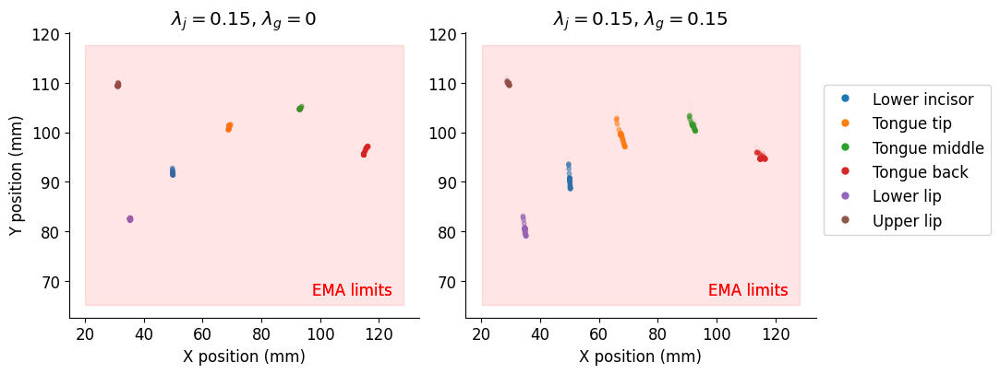

item_0001


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


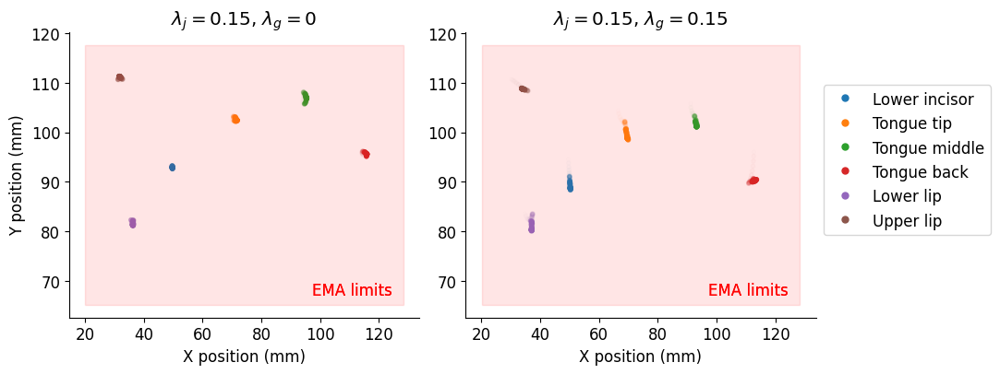

item_0002


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


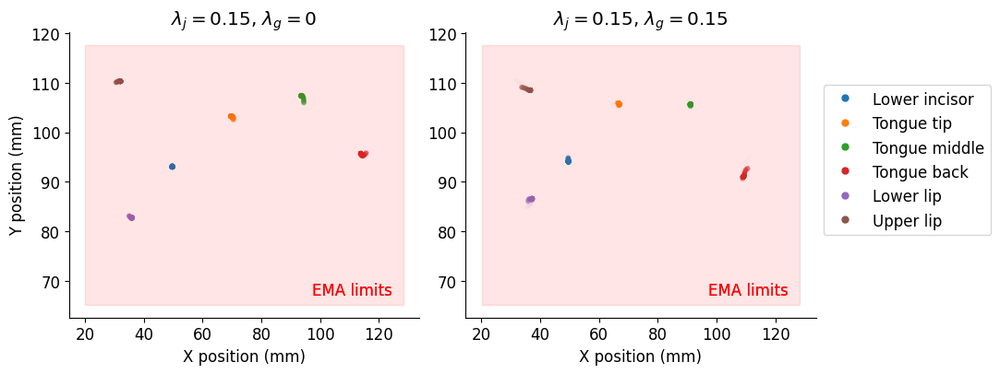

item_0003


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


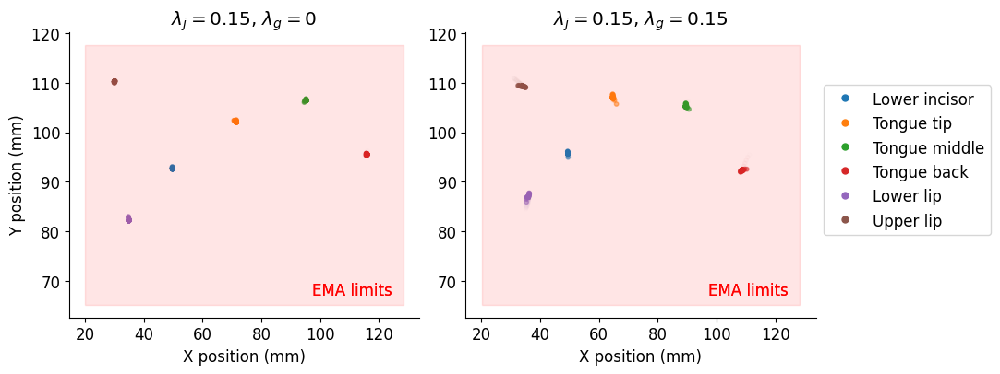

item_0004


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


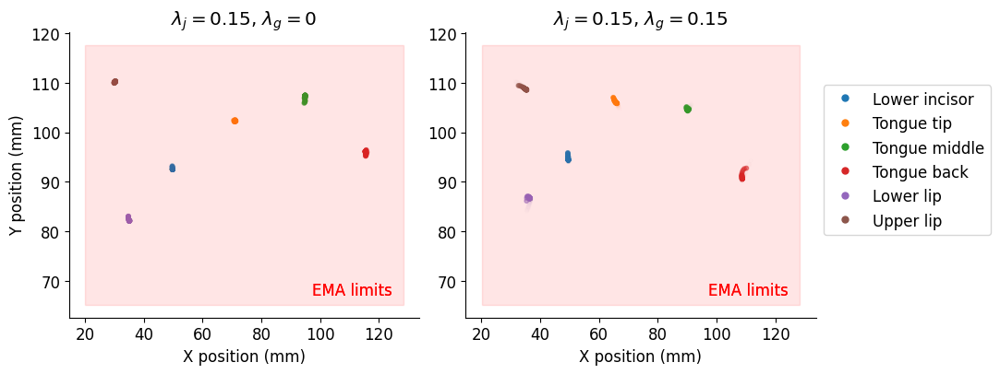

item_0005


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


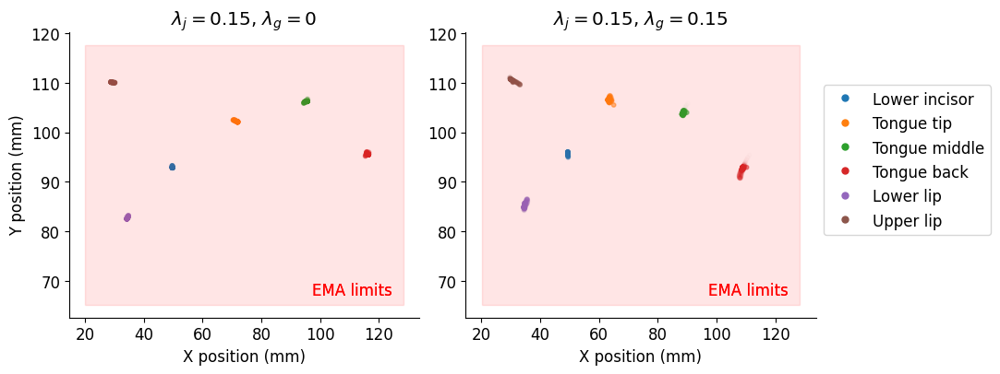

item_0006


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


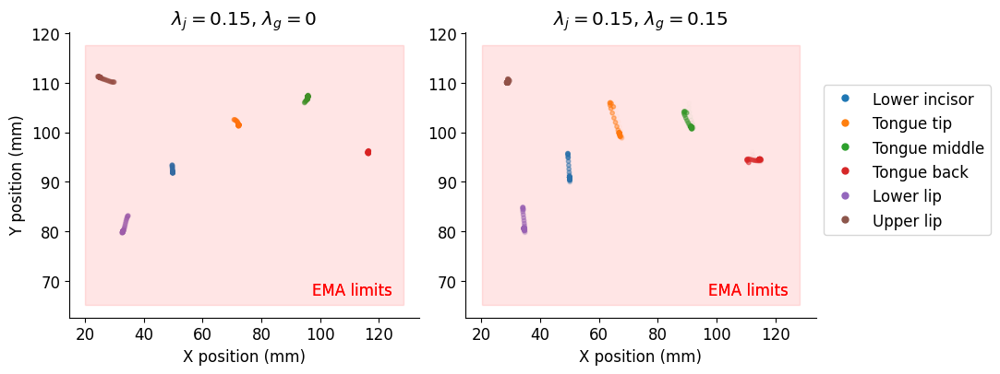

item_0007


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


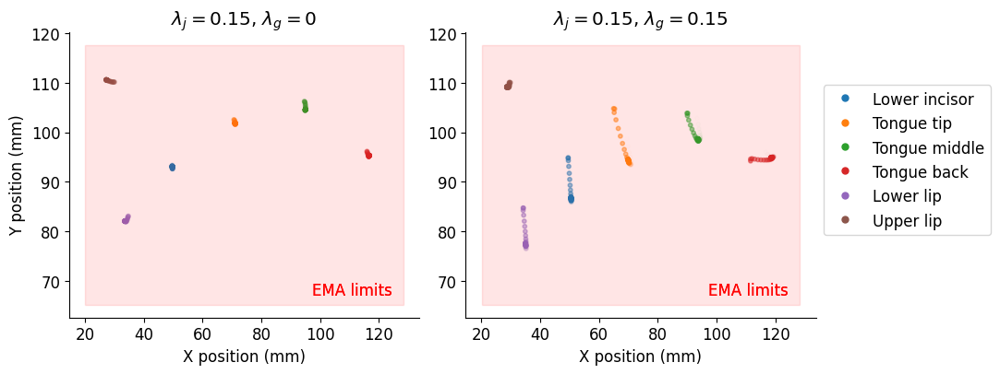

item_0008


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


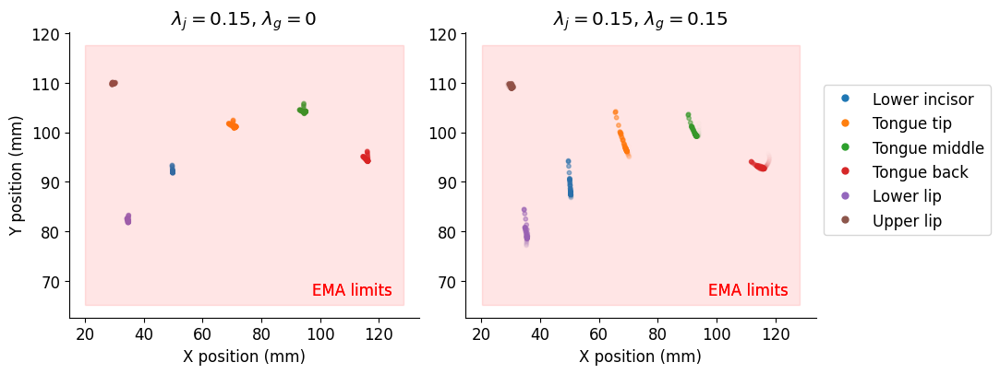

item_0009


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


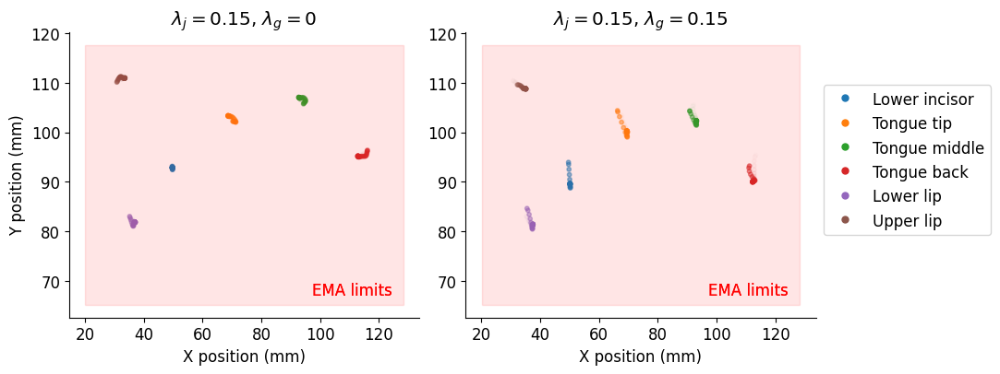

item_0010


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


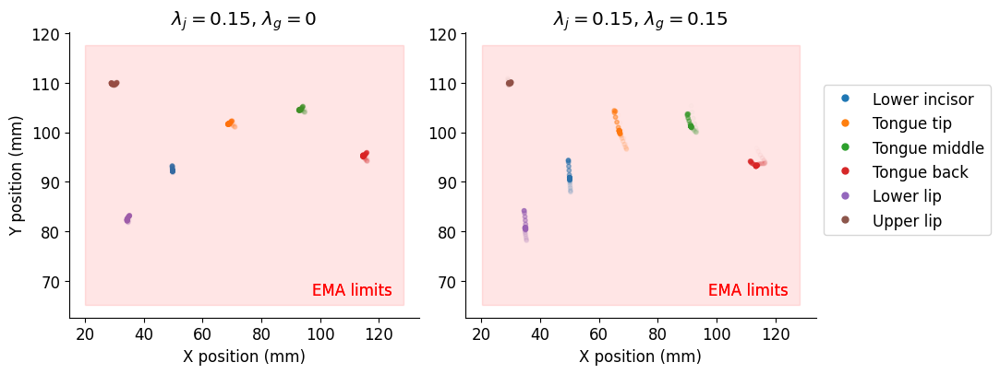

item_0011


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


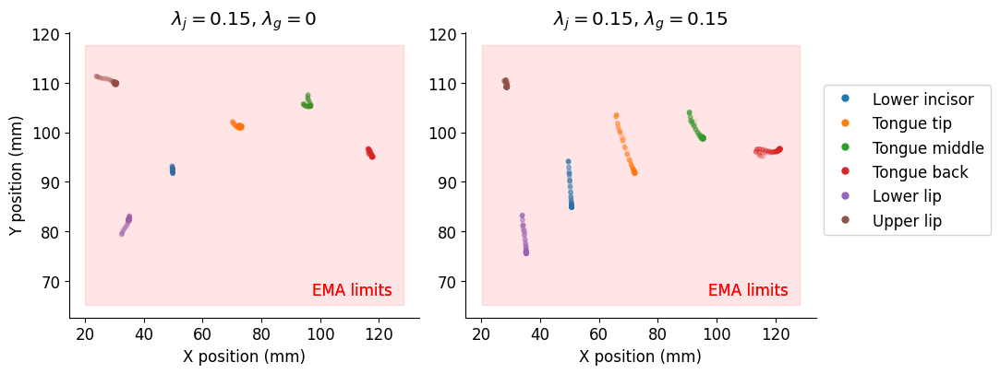

item_0012


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


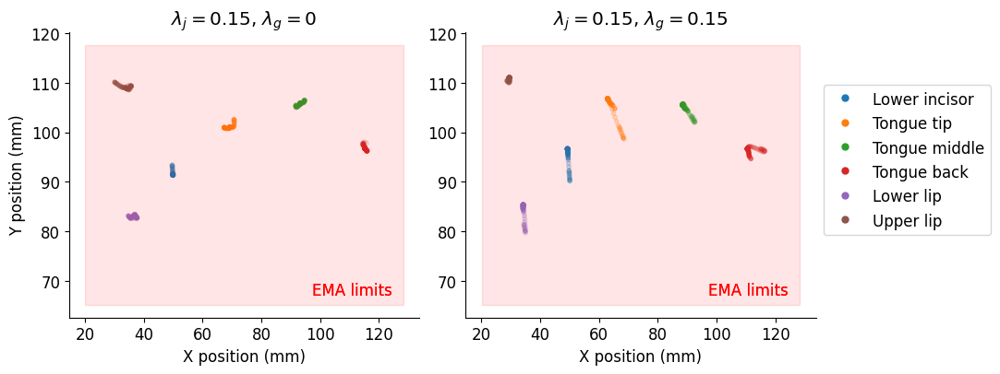

item_0013


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


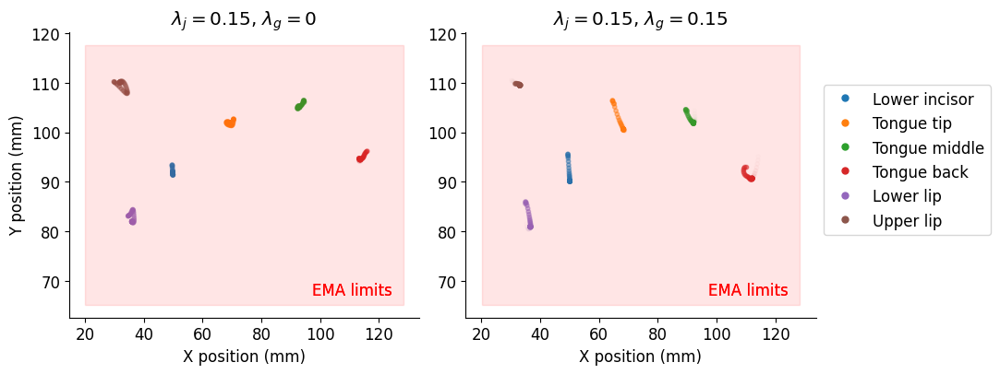

item_0014


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


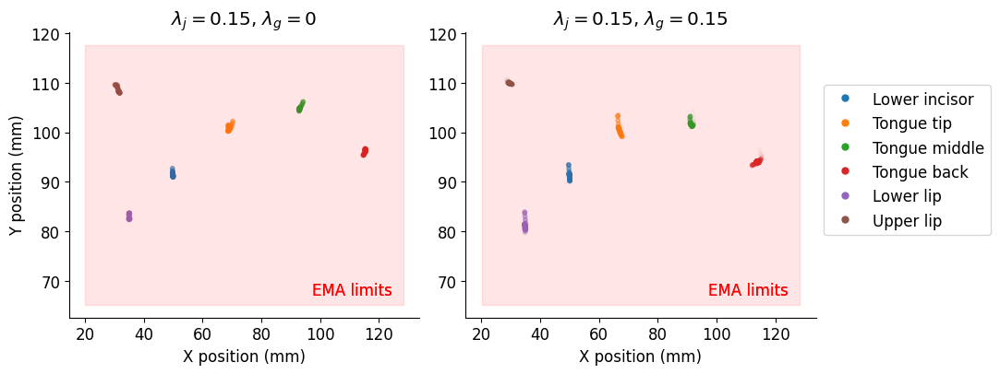

item_0015


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


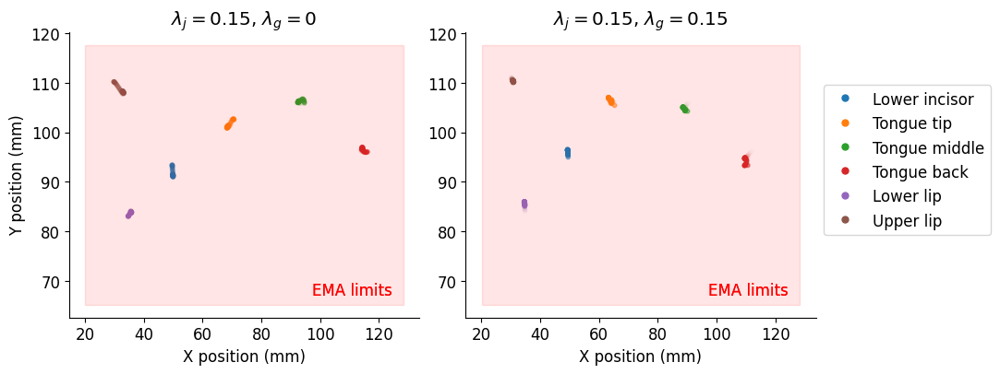

item_0016


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


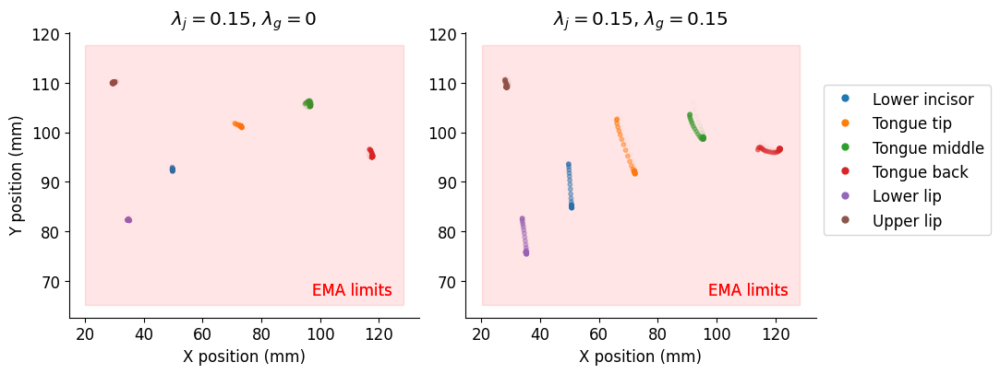

item_0017


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


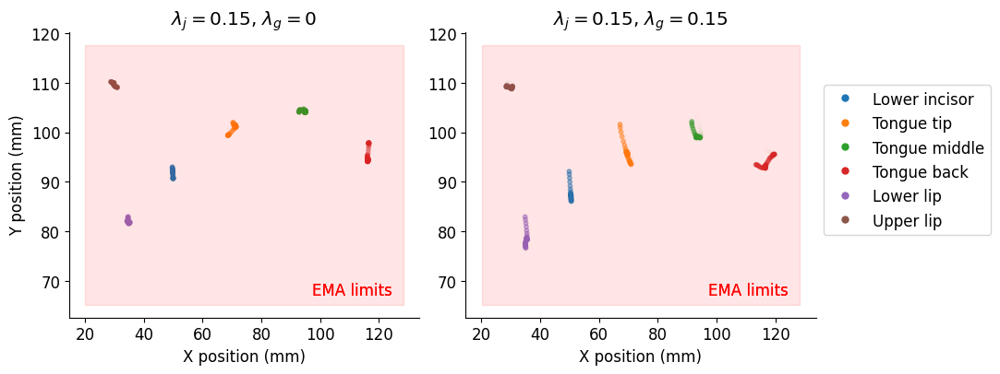

item_0018


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


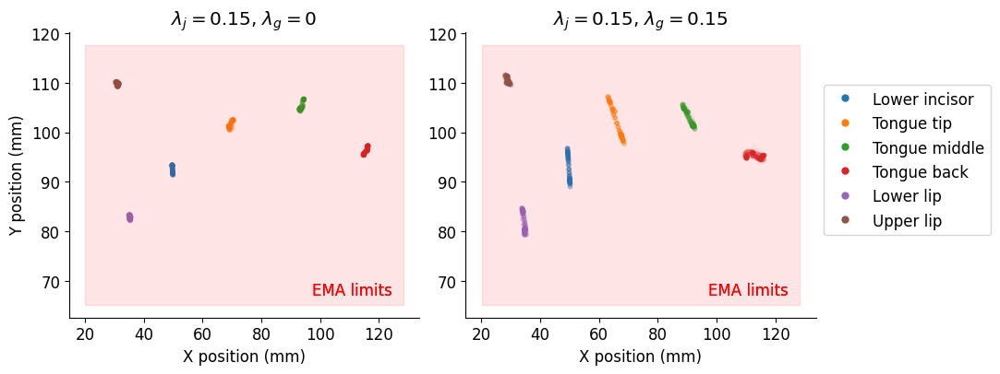

item_0019


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


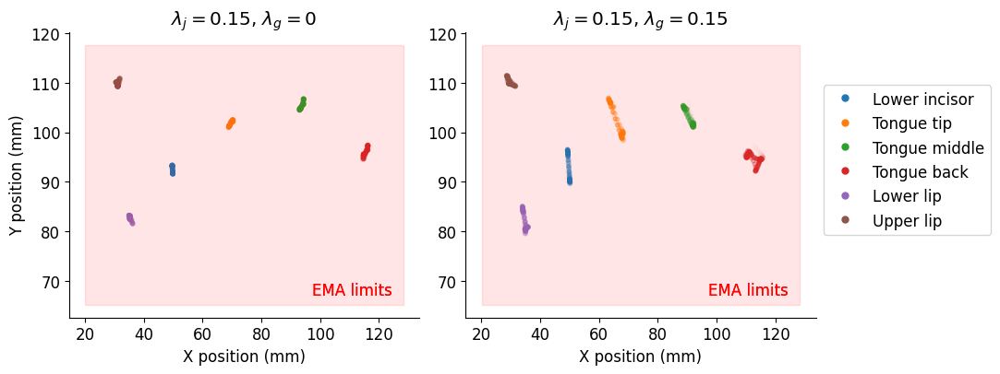

item_0020


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


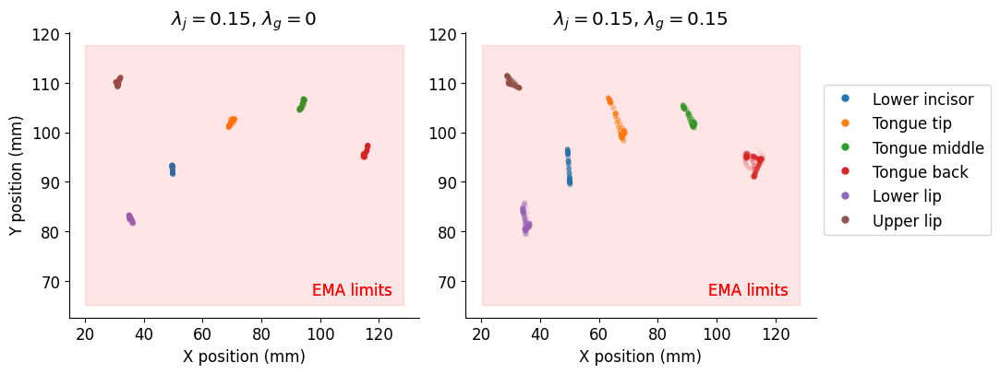

item_0021


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


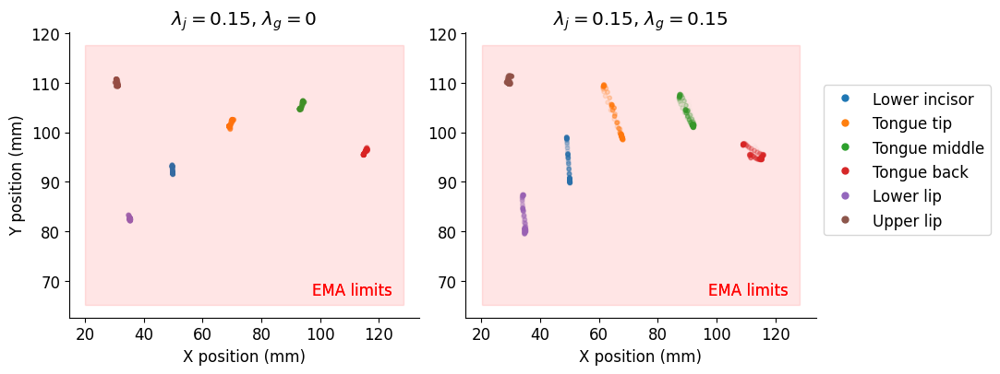

item_0022


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


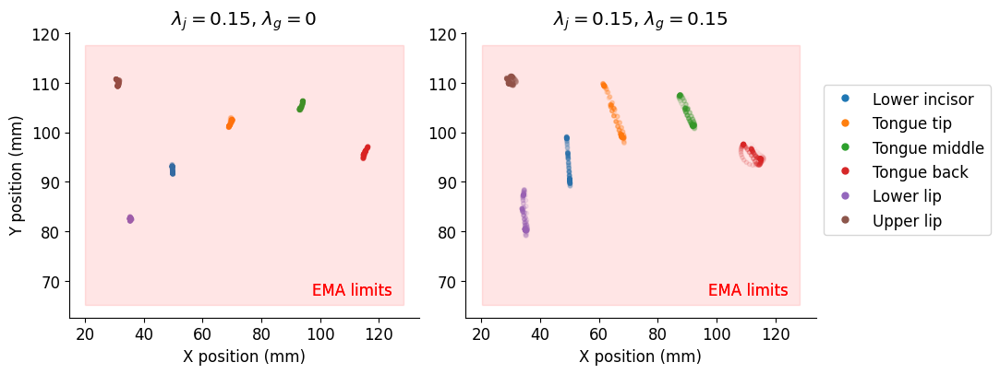

item_0023


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


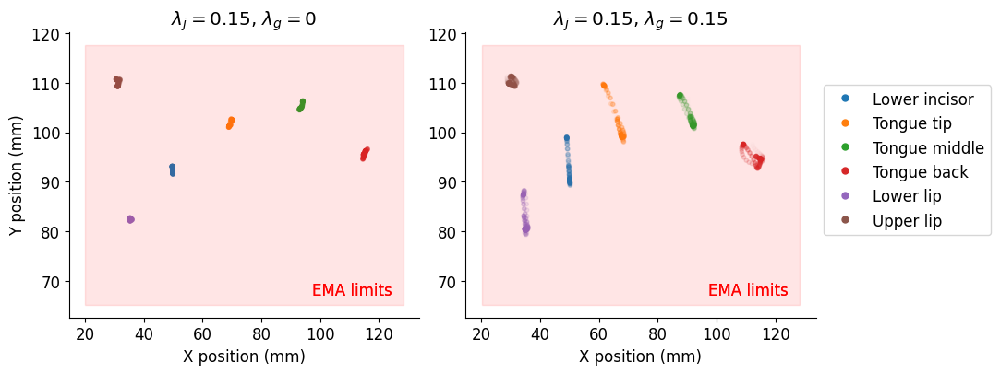

item_0024


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


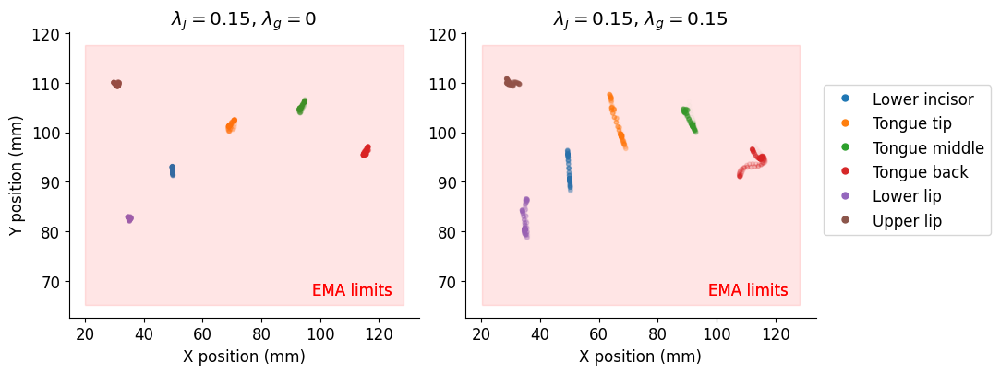

item_0025


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


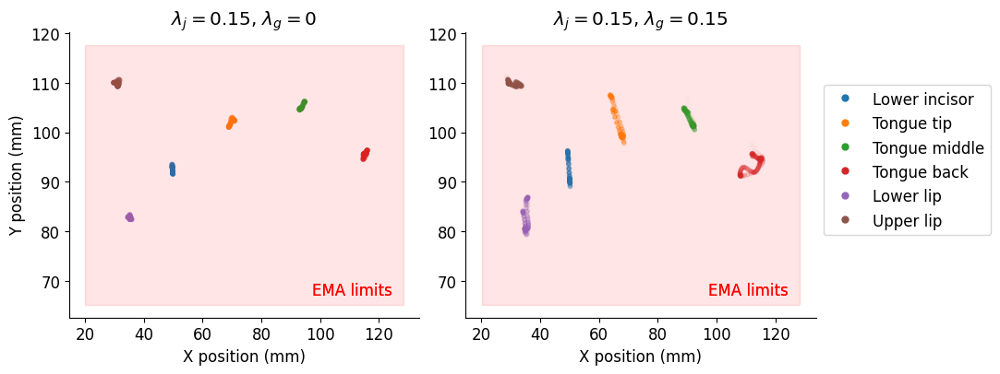

item_0026


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


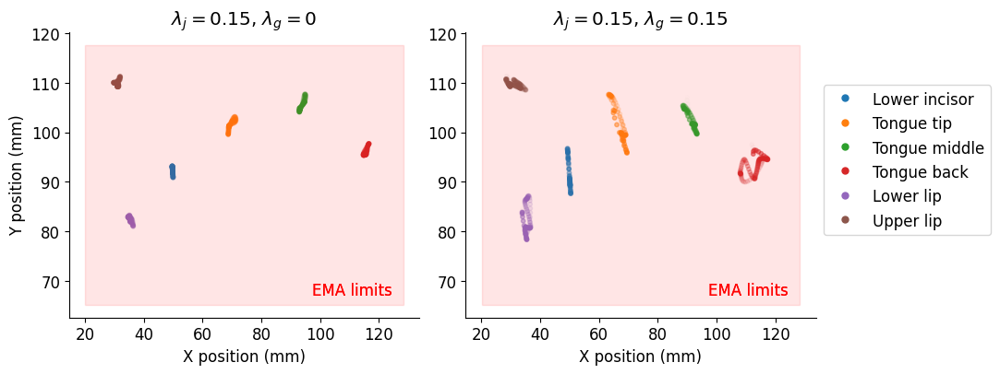

item_0027


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


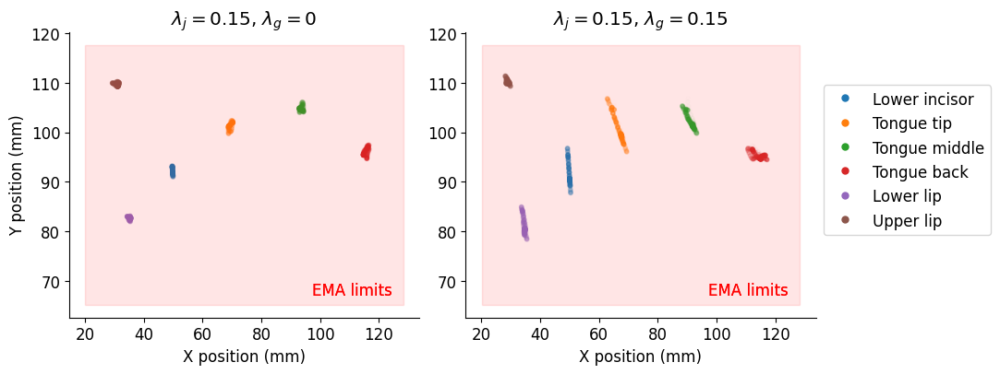

item_0028


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


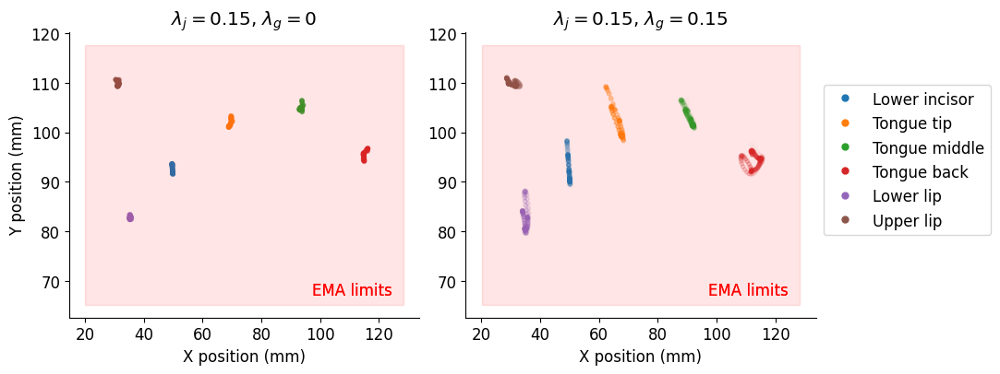

item_0029


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


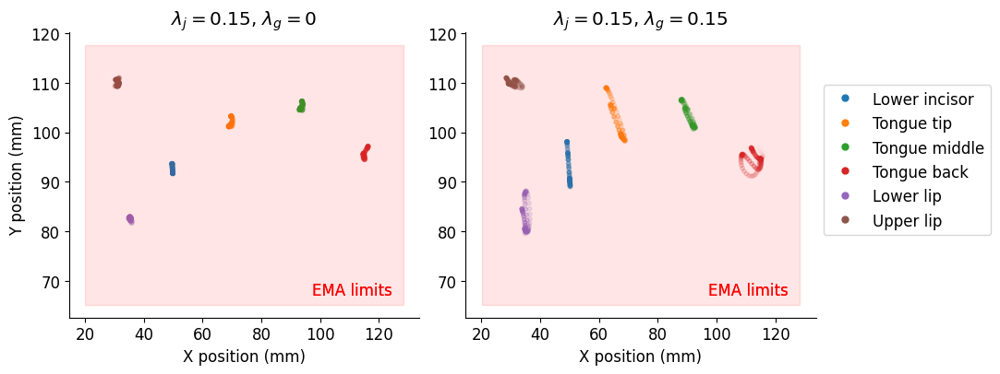

item_0030


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


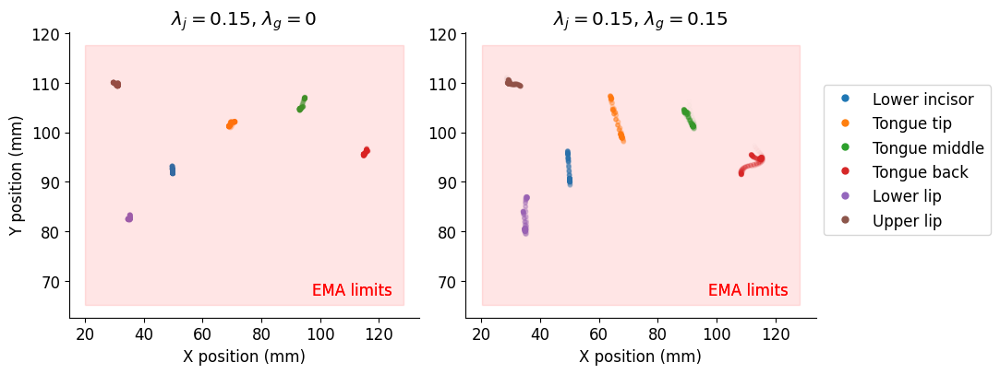

item_0031


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


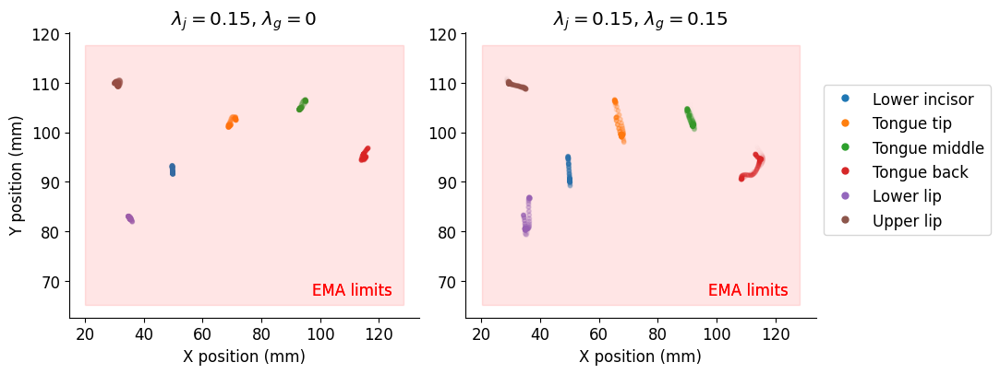

item_0032


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


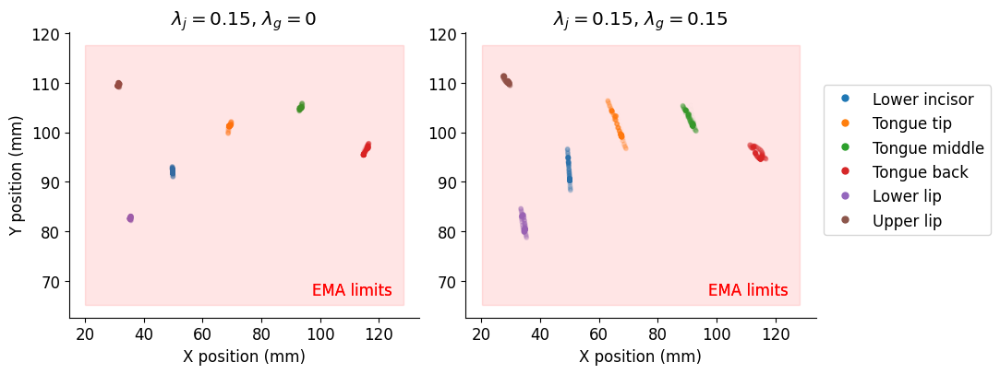

item_0033


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


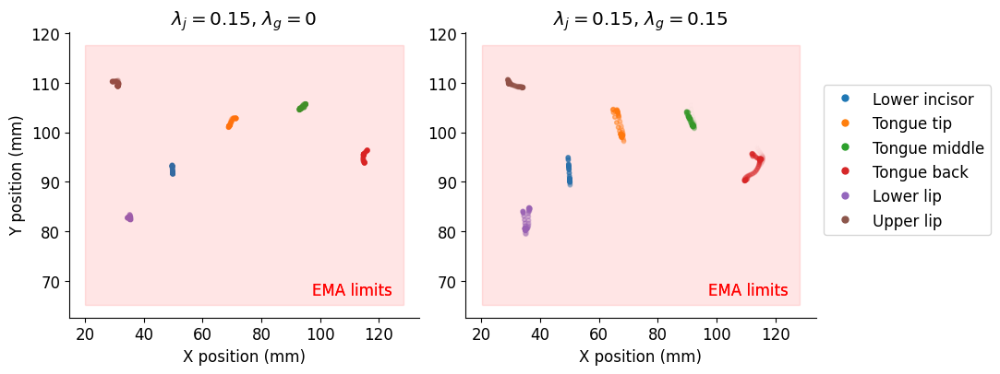

item_0034


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


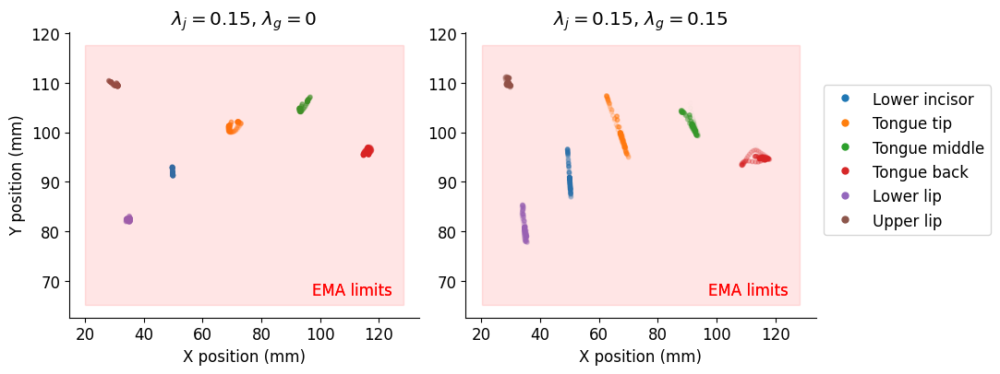

item_0035


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


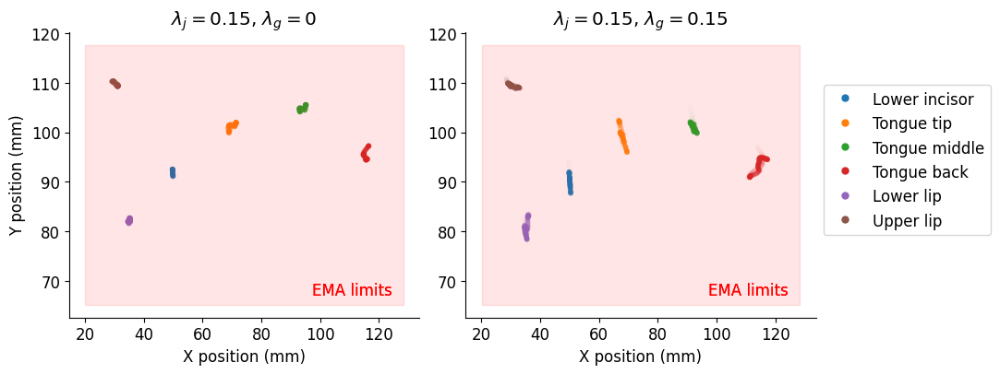

item_0036


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


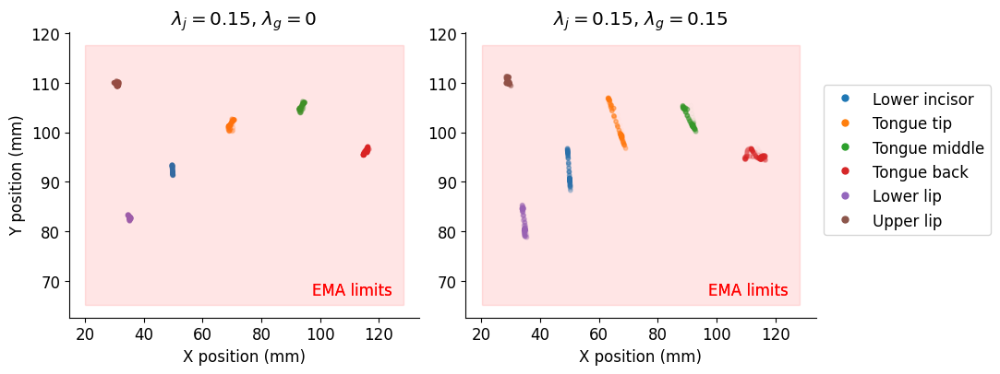

item_0037


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


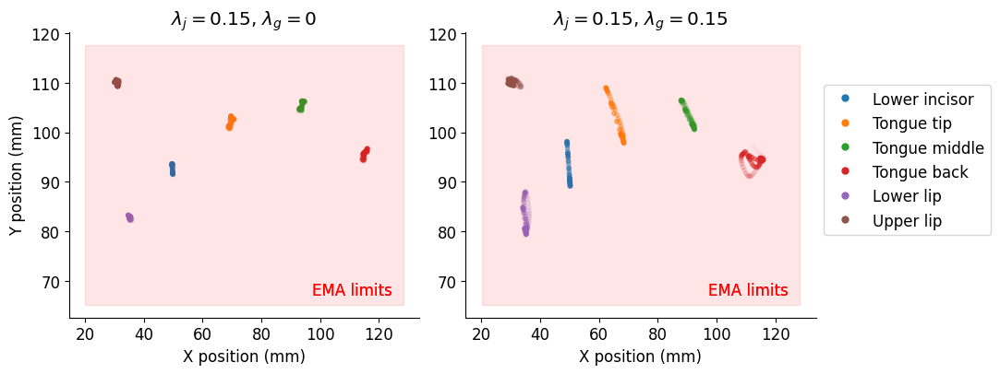

item_0038


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


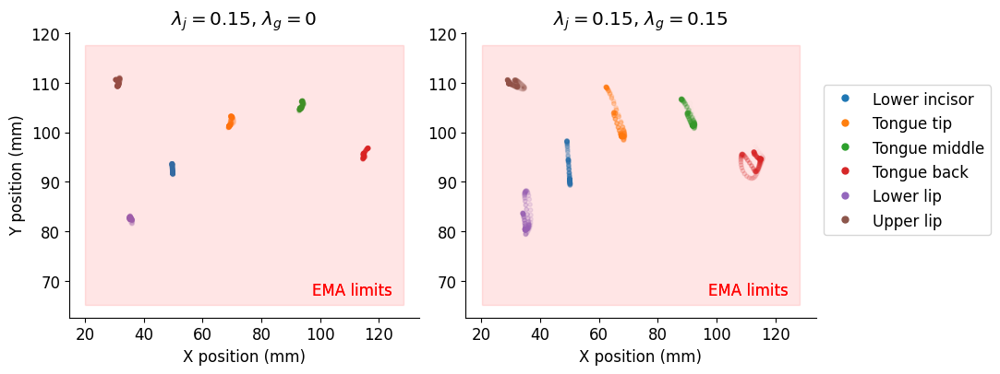

item_0039


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


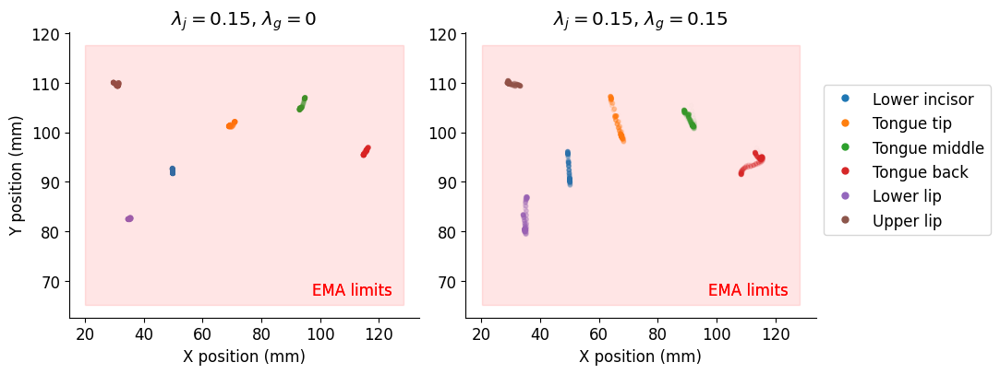

item_0040


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


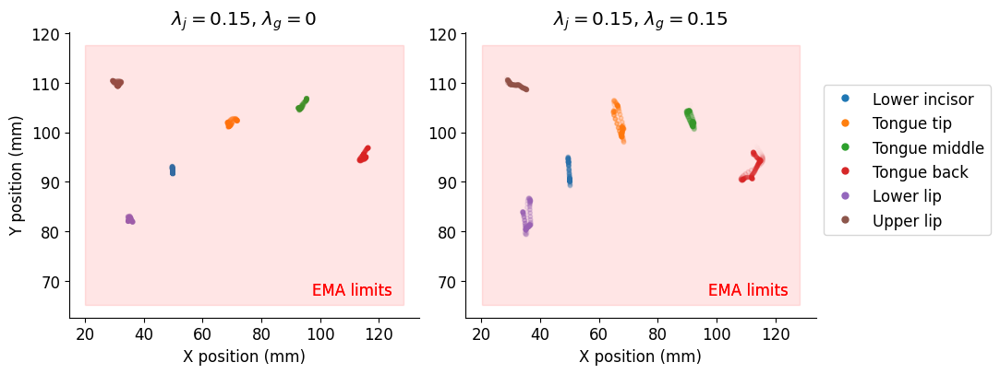

item_0041


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


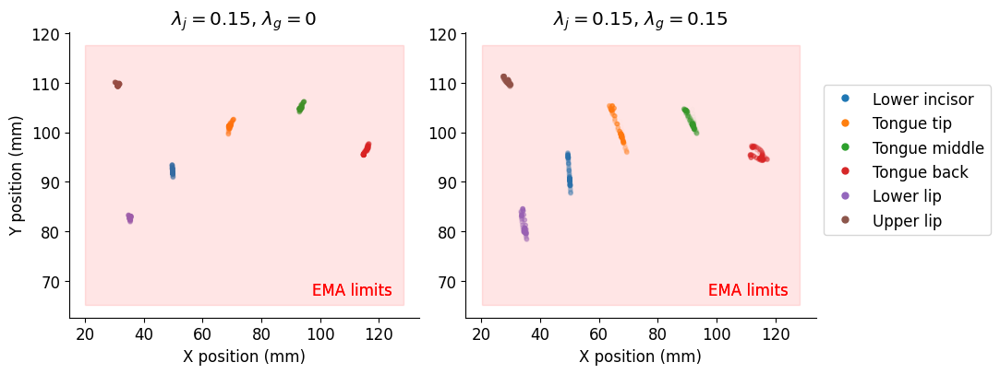

item_0042


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


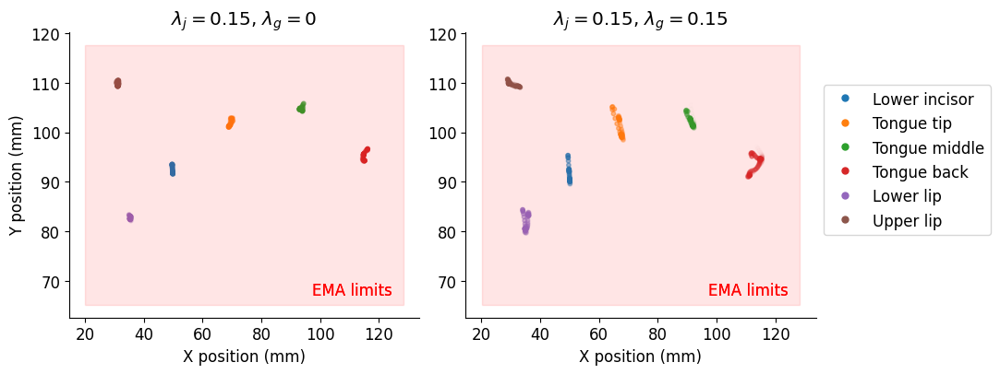

item_0043


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


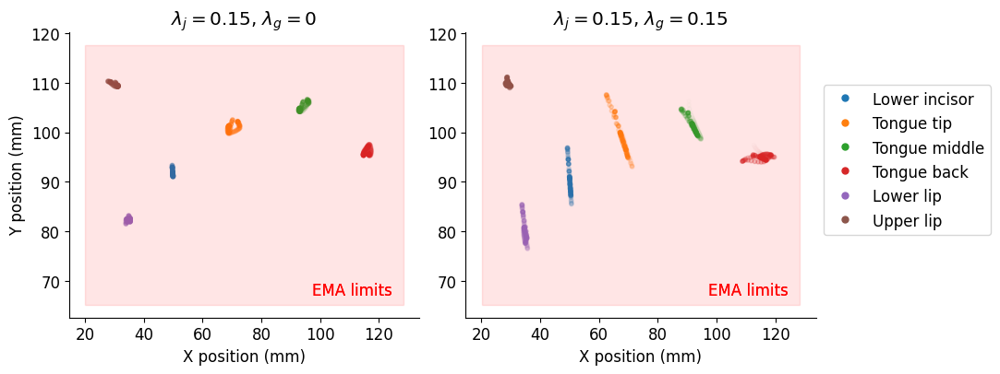

item_0044


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


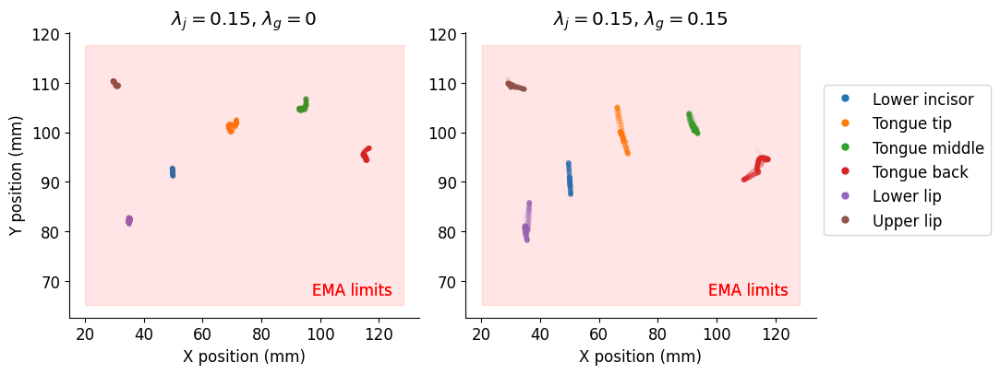

item_0045


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


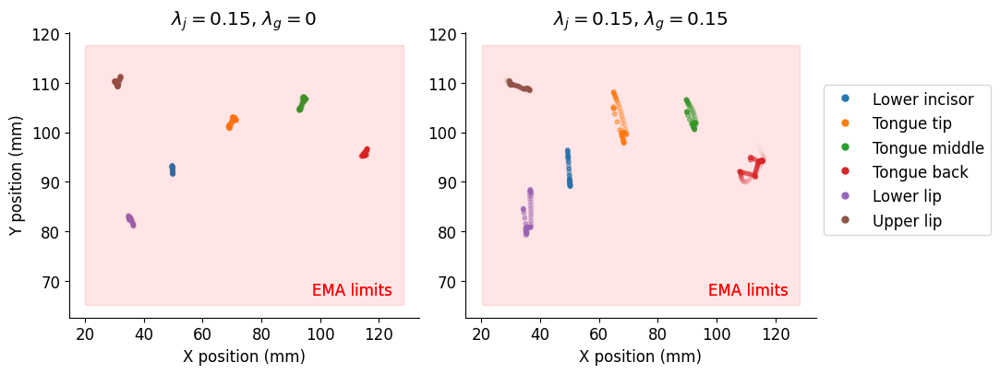

item_0046


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


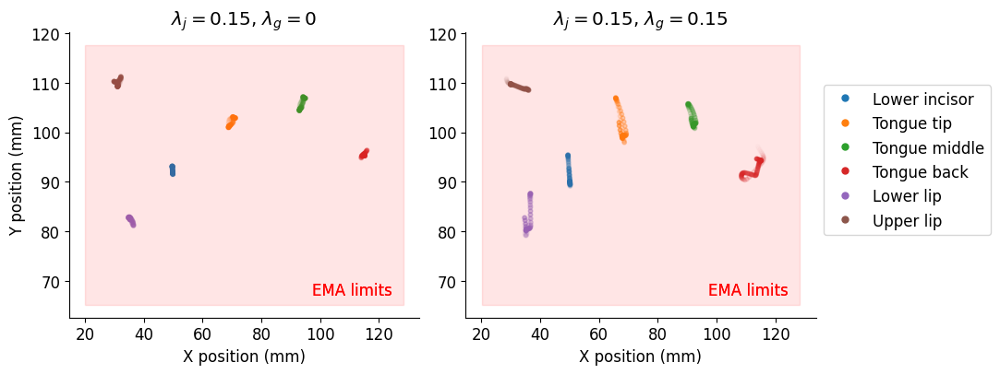

item_0047


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


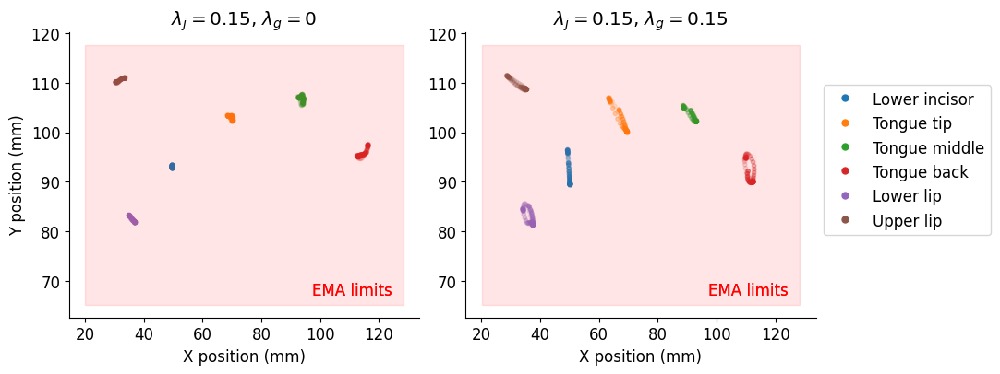

item_0048


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


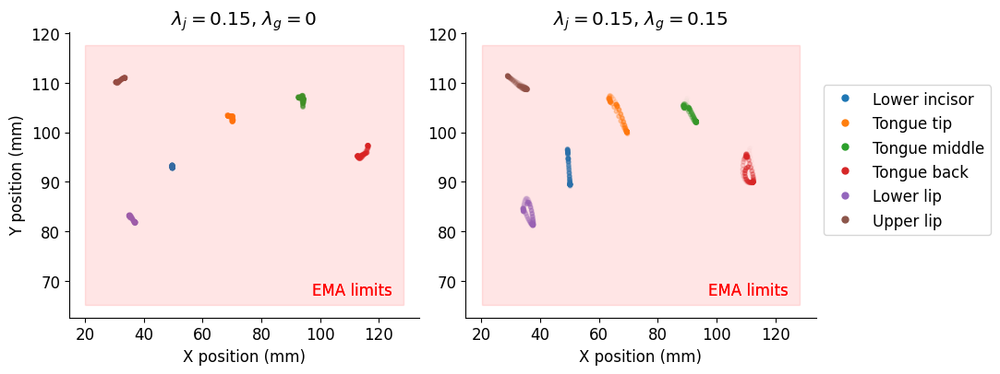

item_0049


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


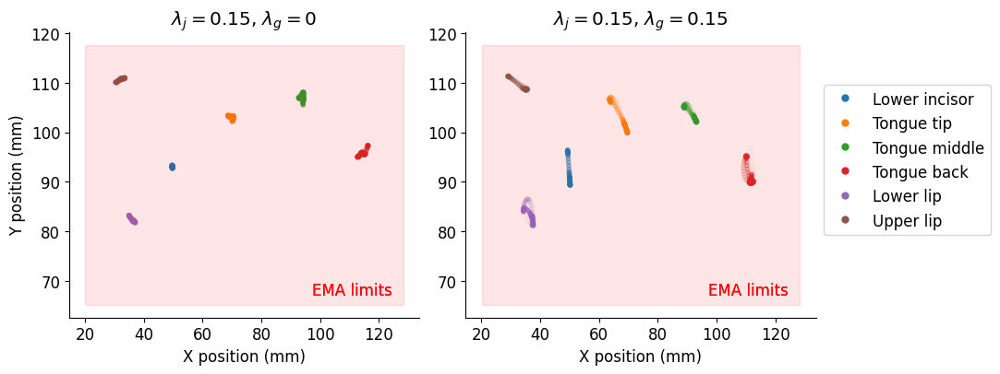

item_0050


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


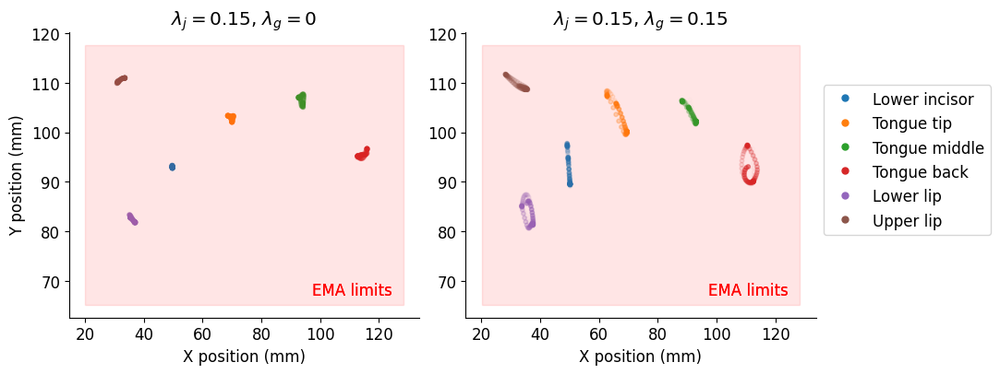

item_0051


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


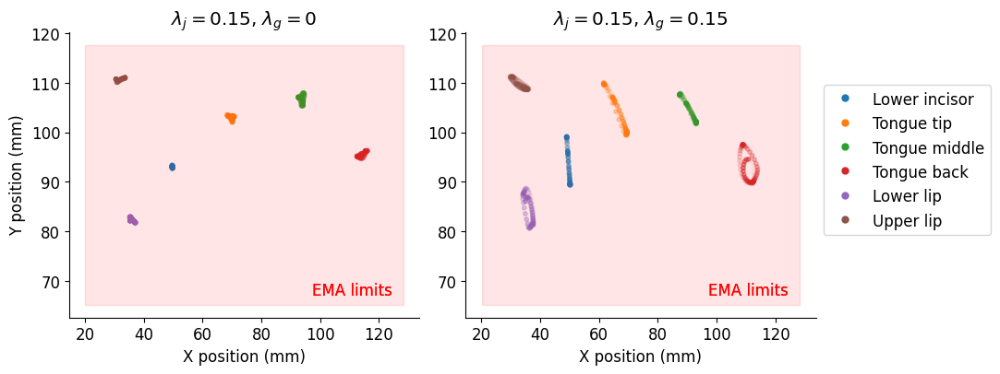

item_0052


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


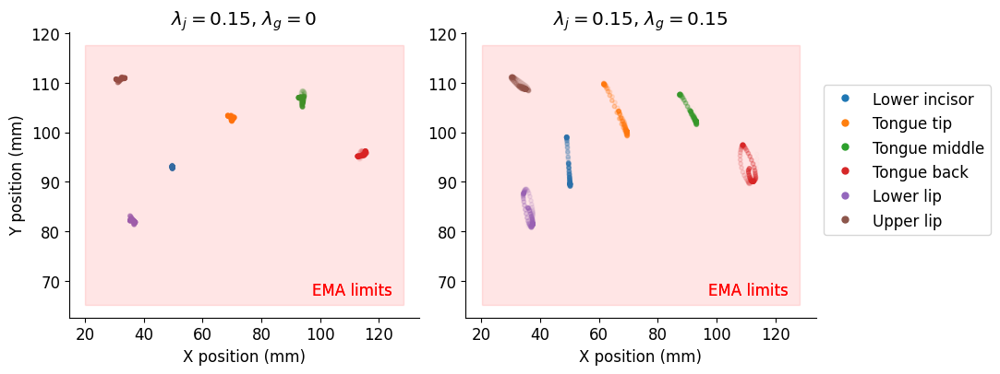

item_0053


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


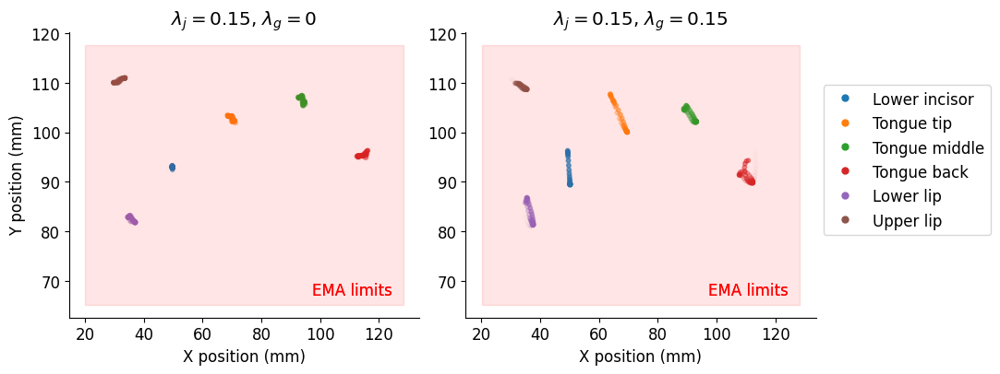

item_0054


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


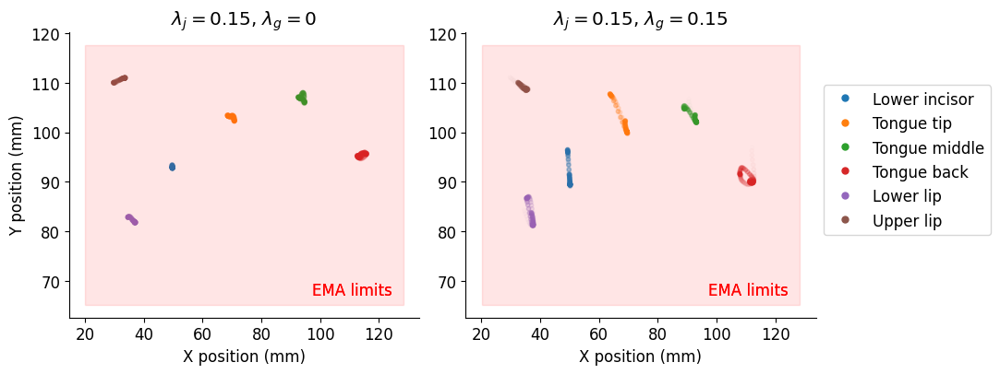

item_0055


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


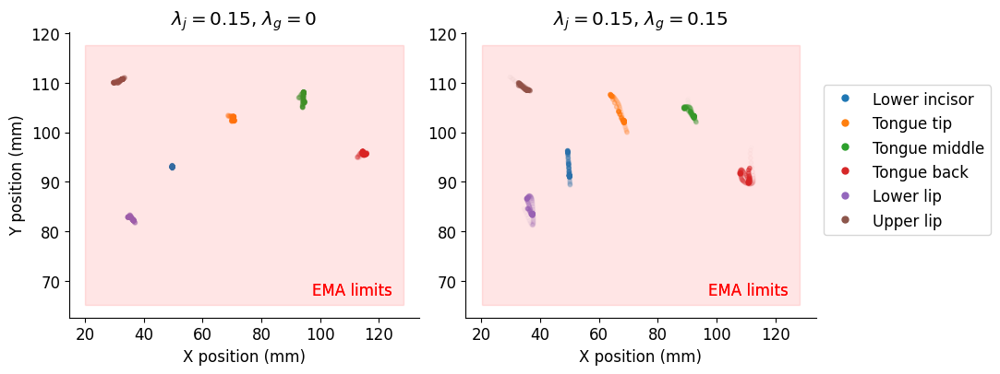

item_0056


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


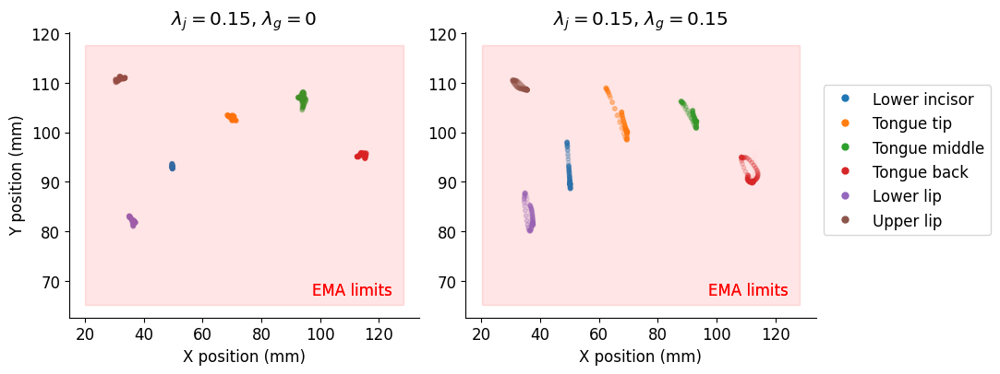

item_0057


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


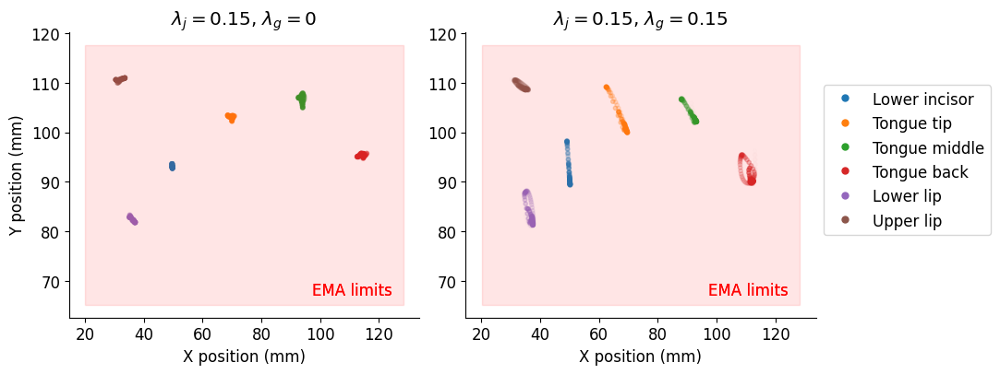

item_0058


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


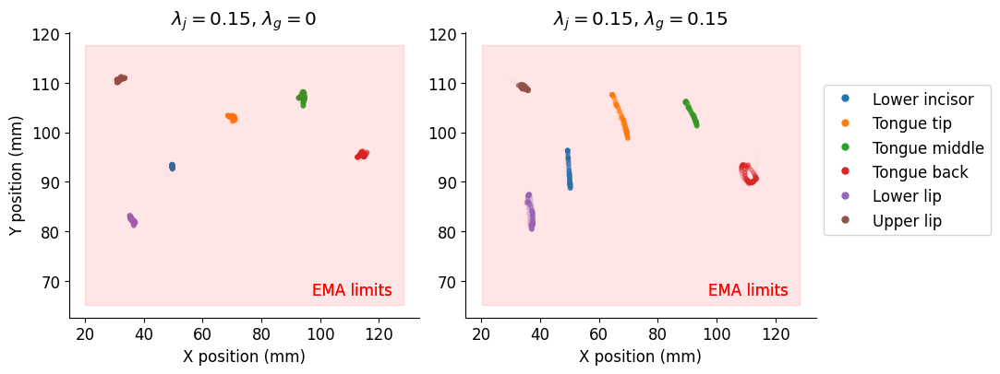

item_0059


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


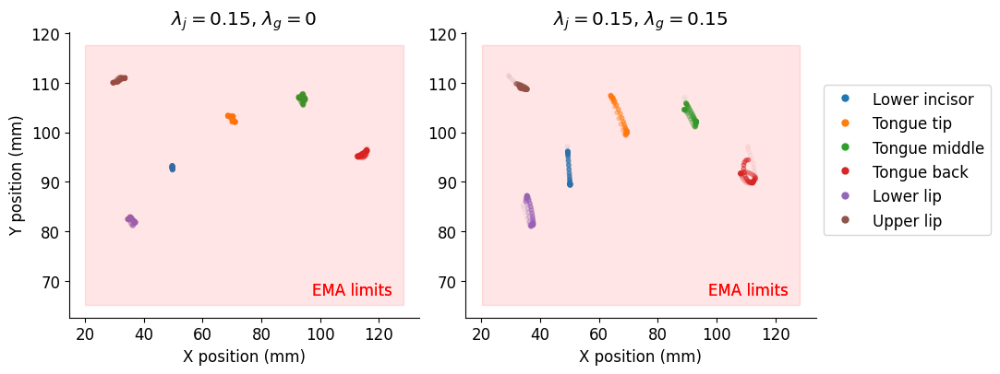

item_0060


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


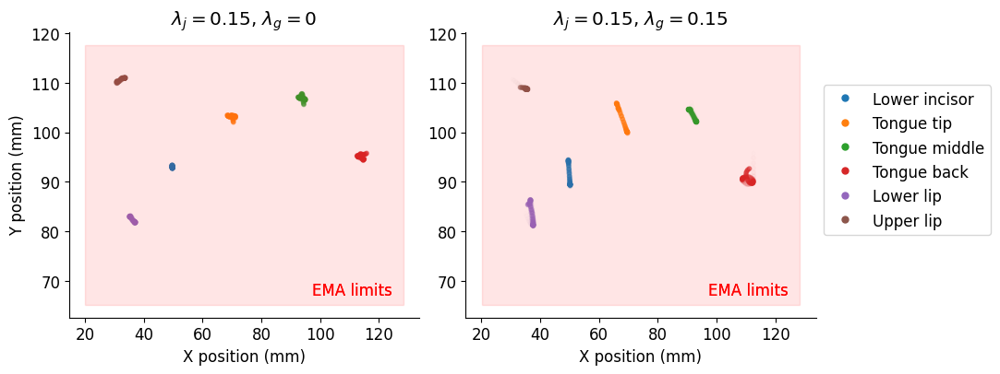

item_0061


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


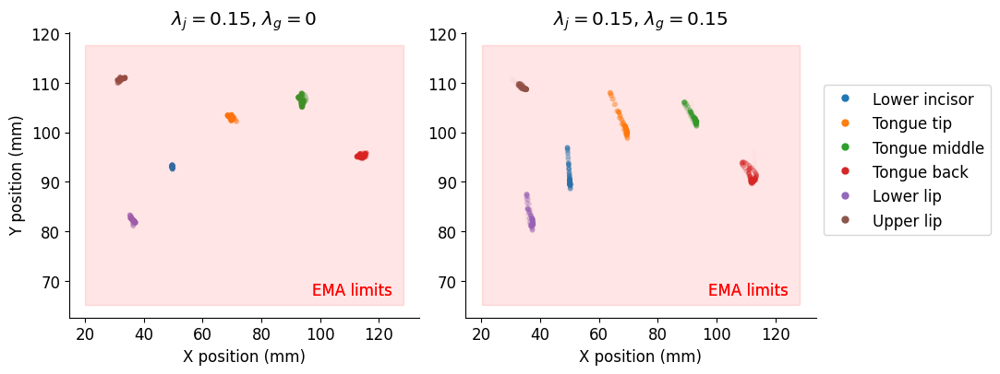

item_0062


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


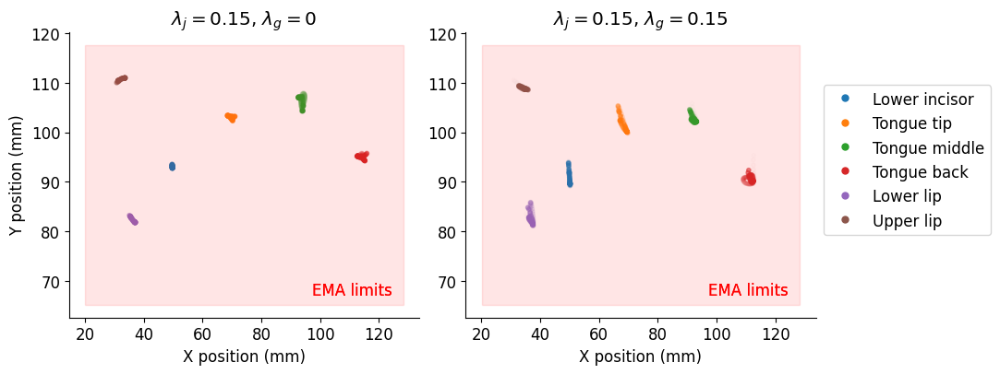

item_0063


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


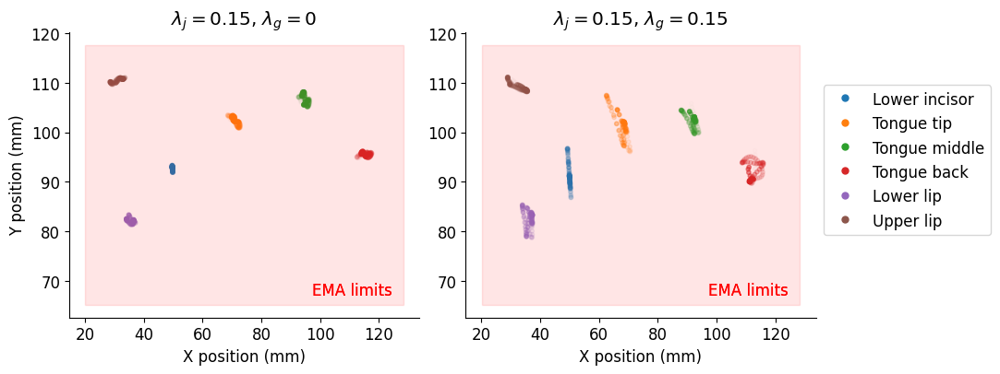

item_0064


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


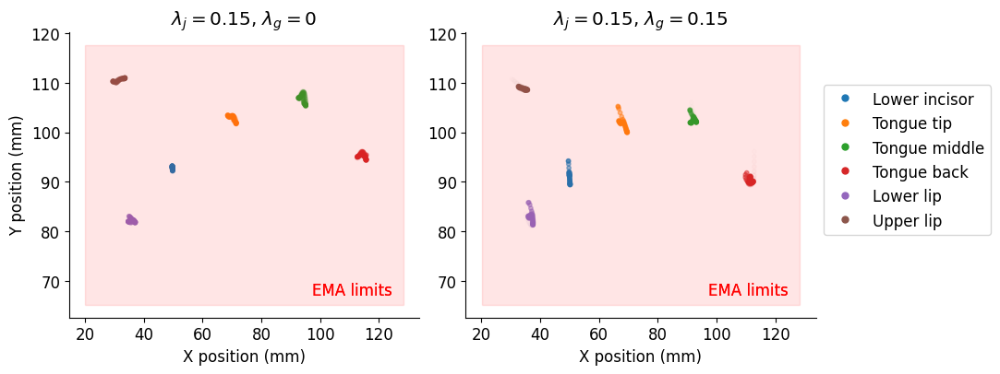

item_0065


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


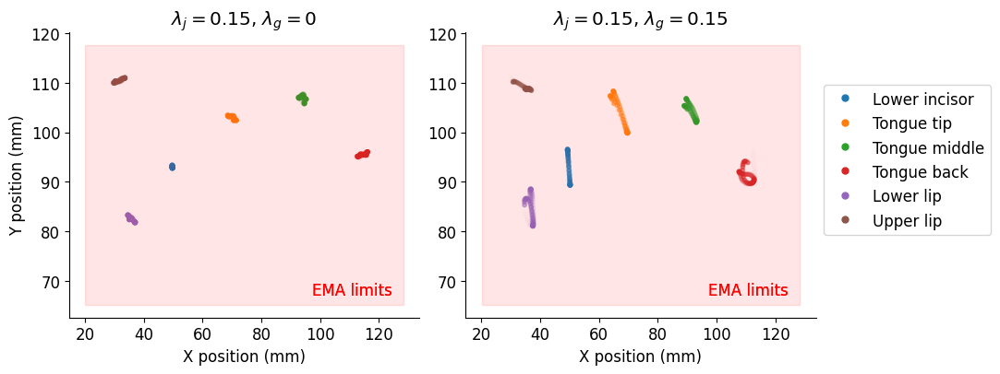

item_0066


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


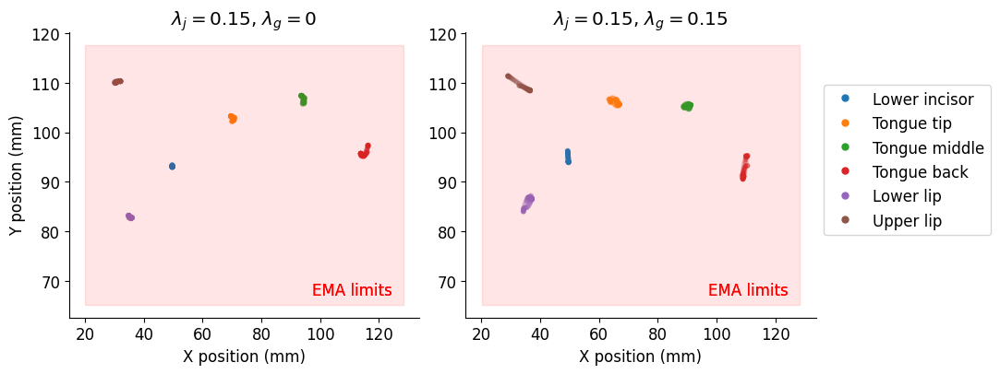

item_0067


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


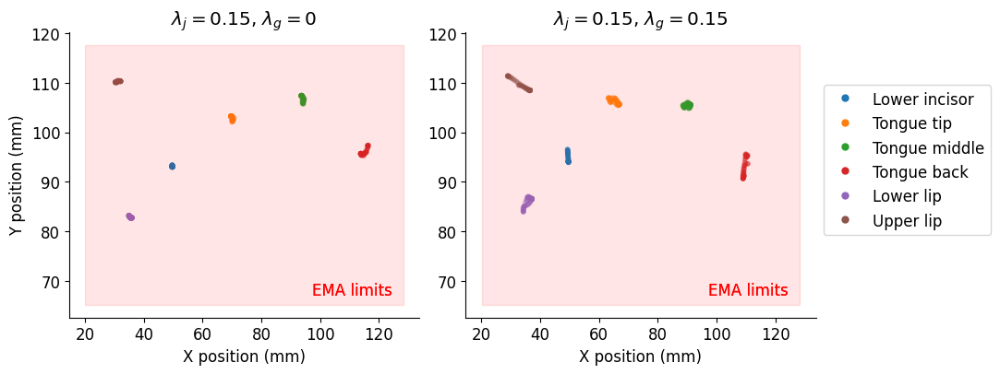

item_0068


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


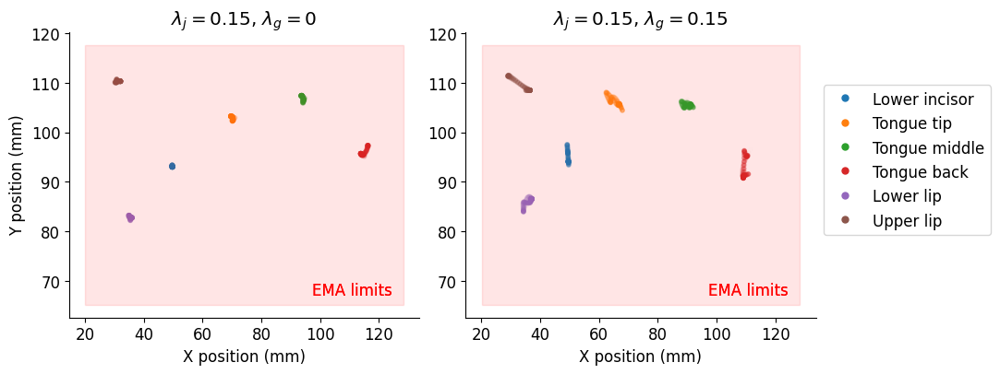

item_0069


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


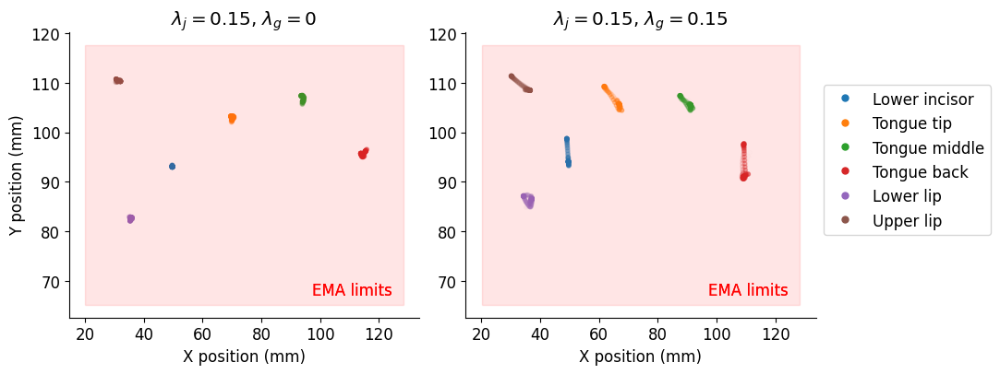

item_0070


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


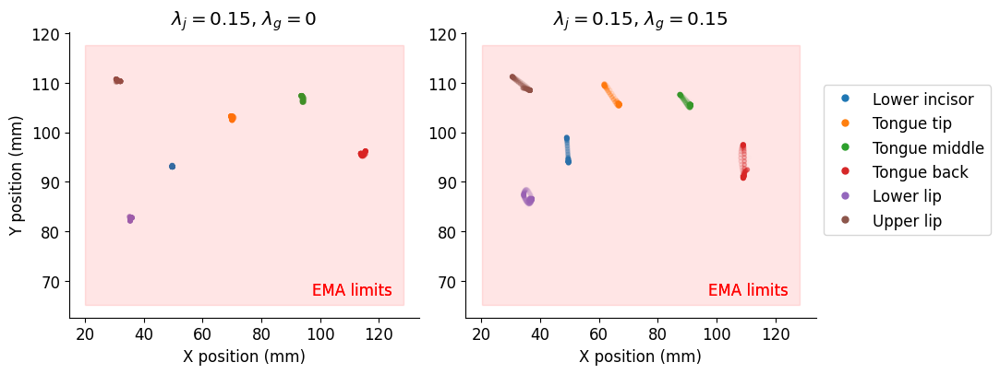

item_0071


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


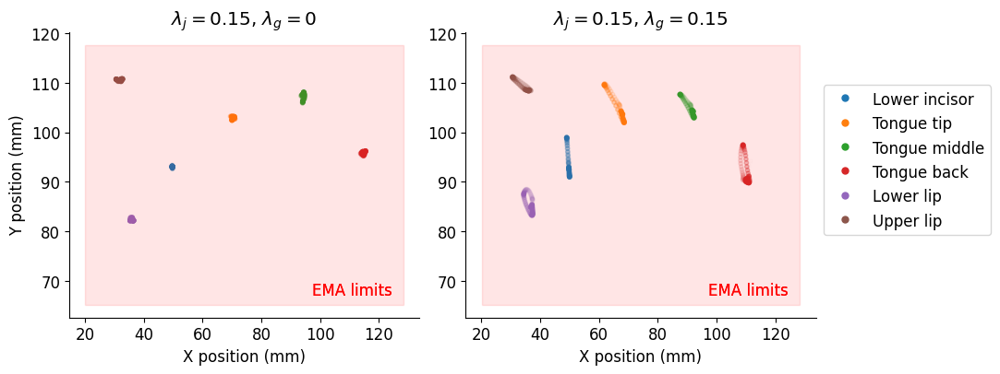

item_0072


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


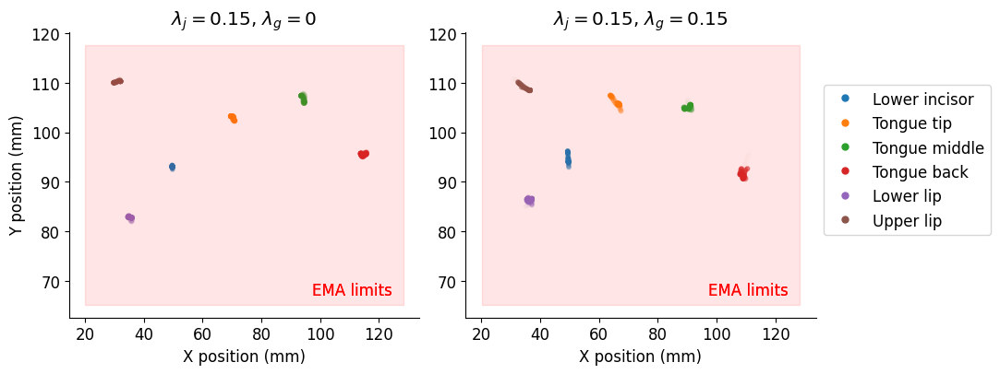

item_0073


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


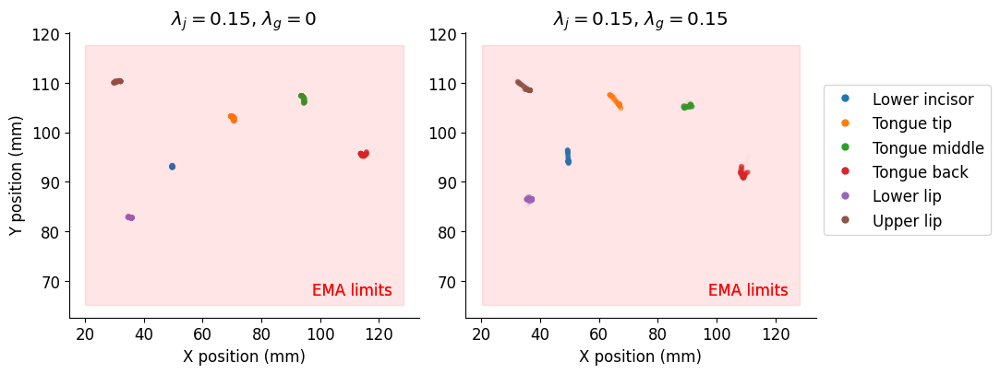

item_0074


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


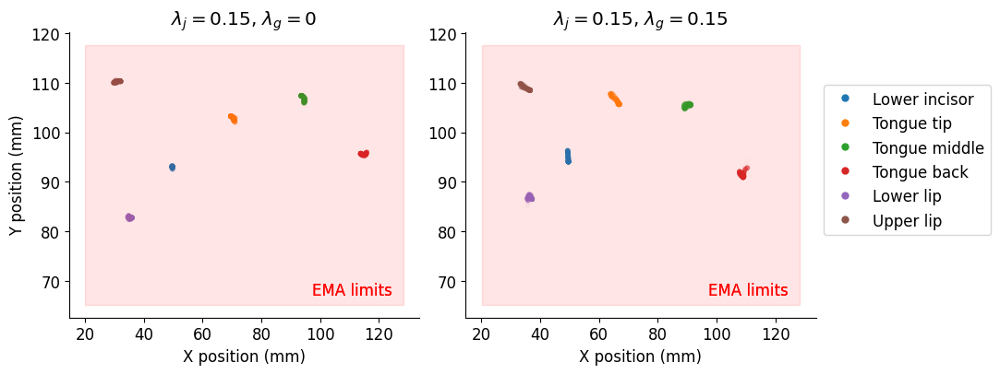

item_0075


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


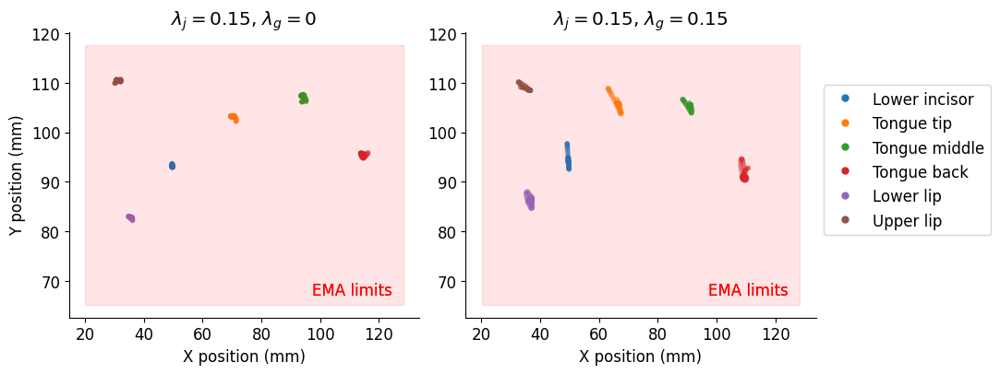

item_0076


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


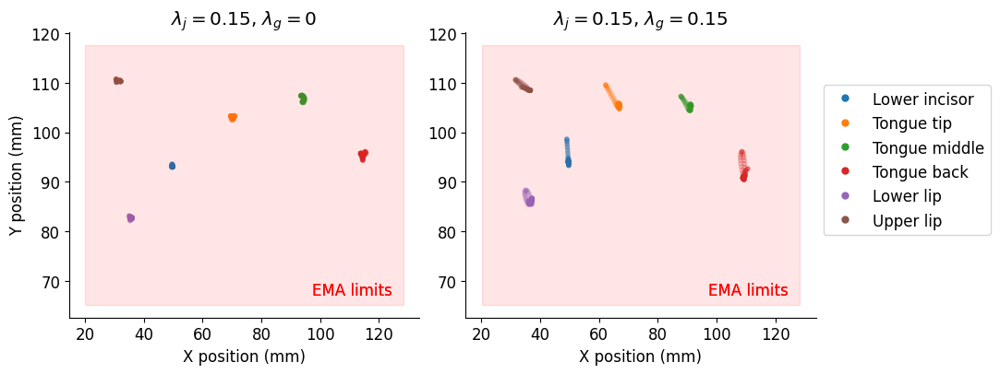

item_0077


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


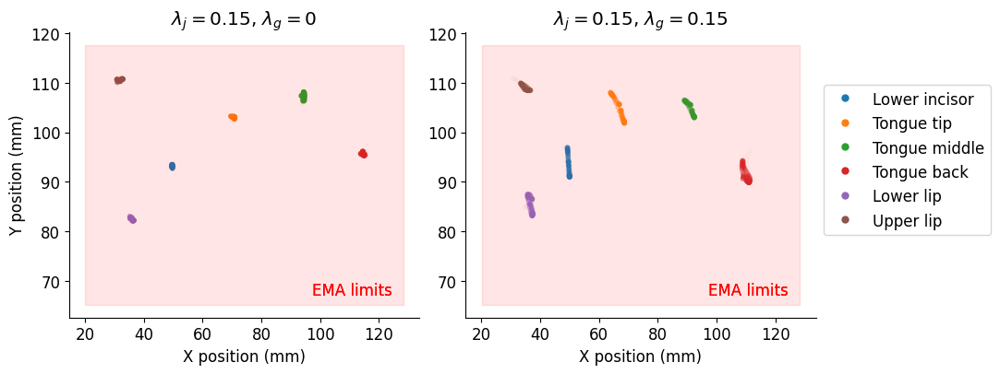

item_0078


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


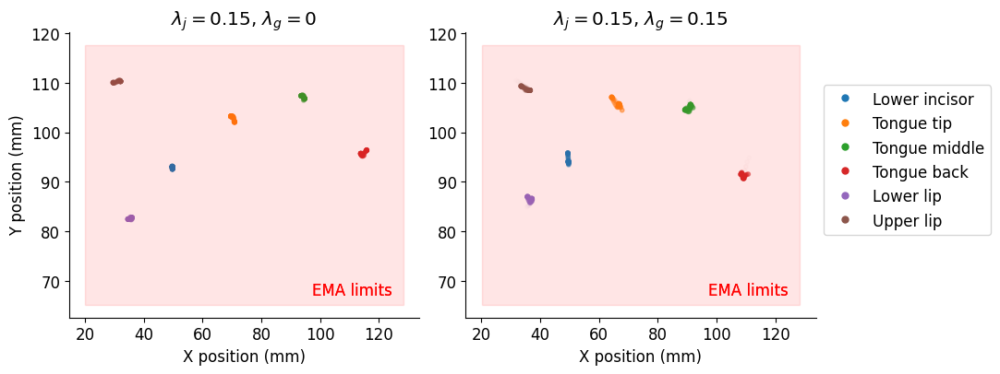

item_0079


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


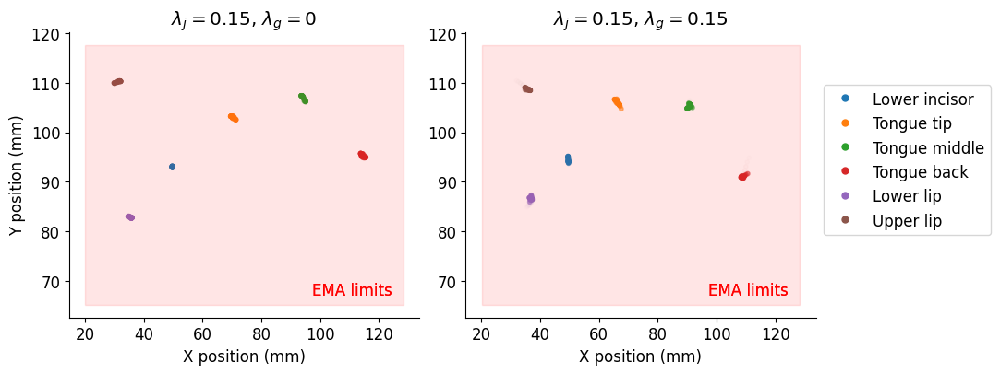

item_0080


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


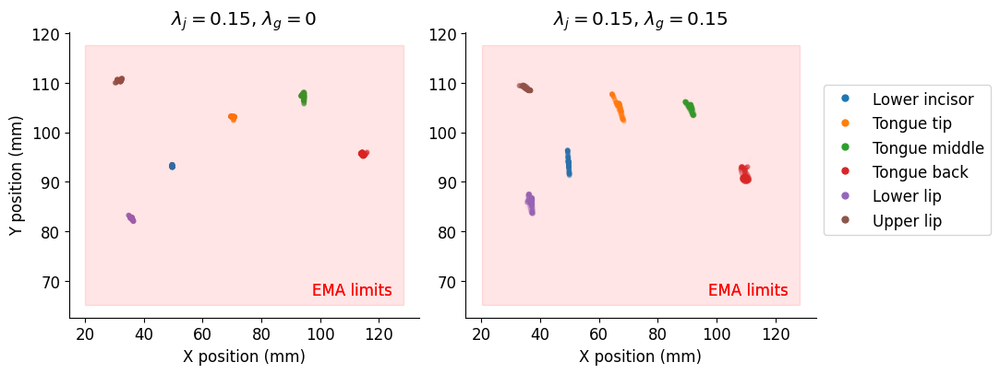

item_0081


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


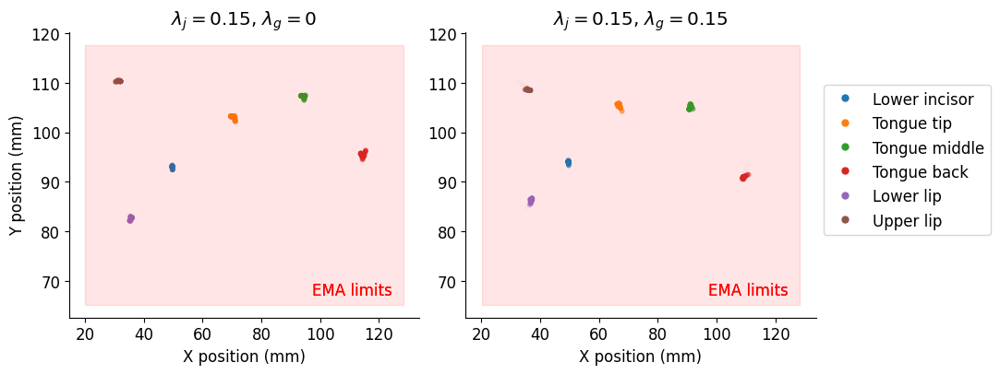

item_0082


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


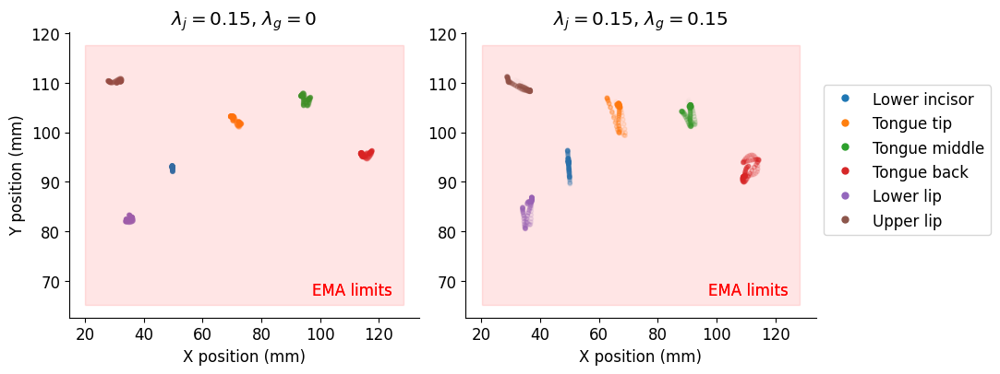

item_0083


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


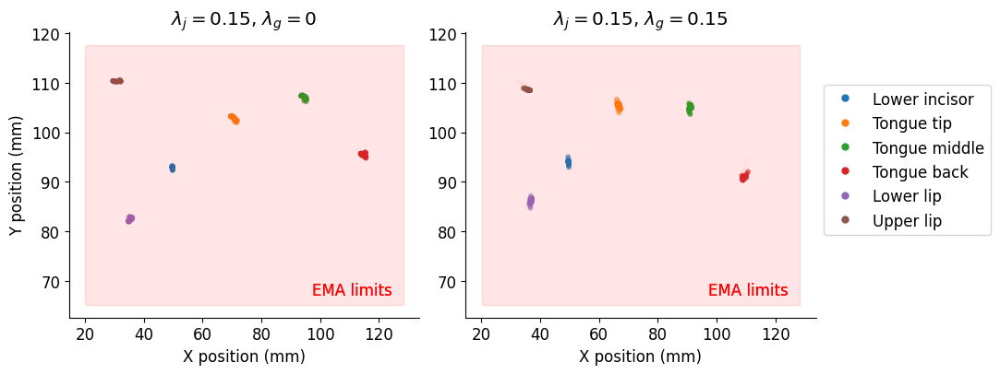

item_0084


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


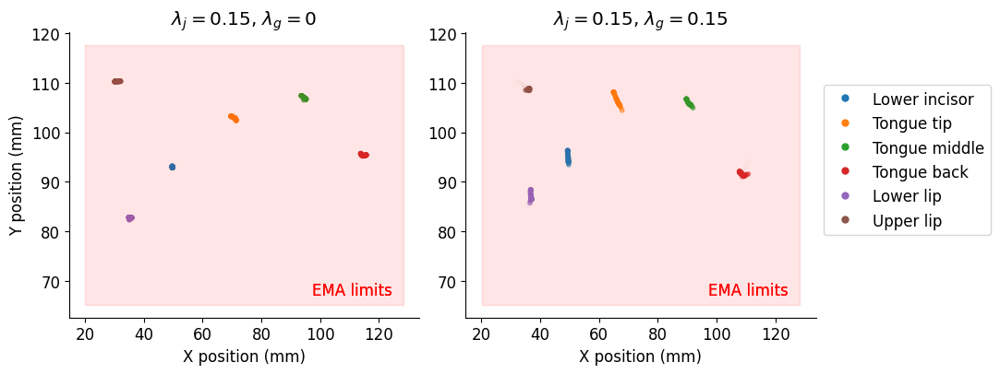

item_0085


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


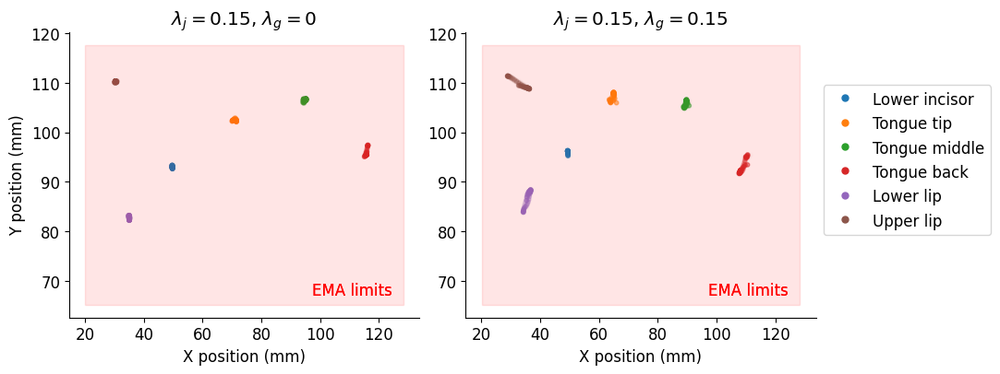

item_0086


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


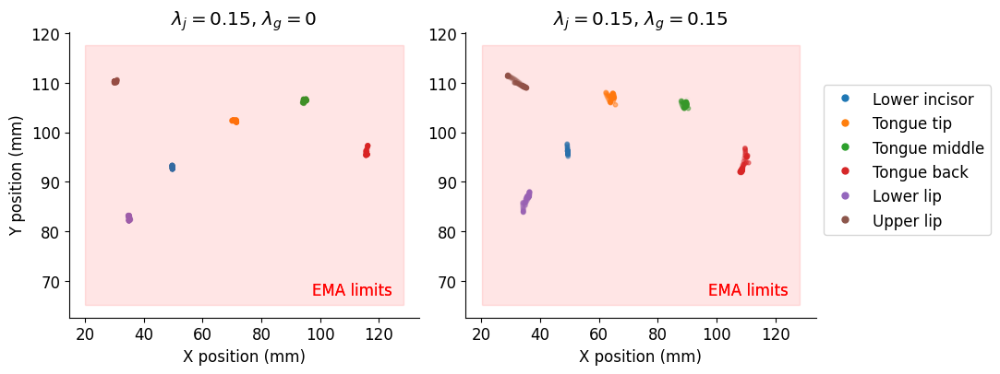

item_0087


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


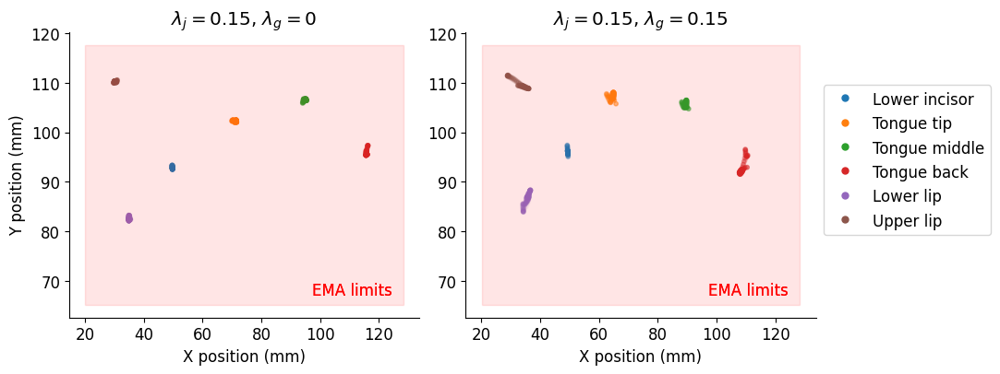

item_0088


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


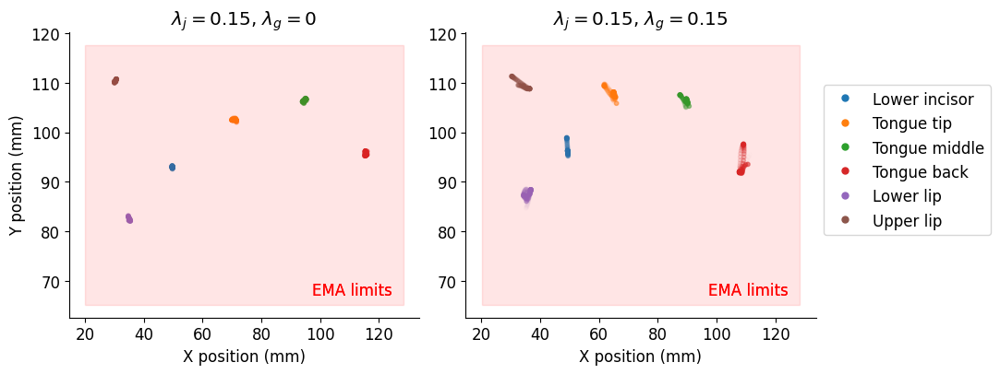

item_0089


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


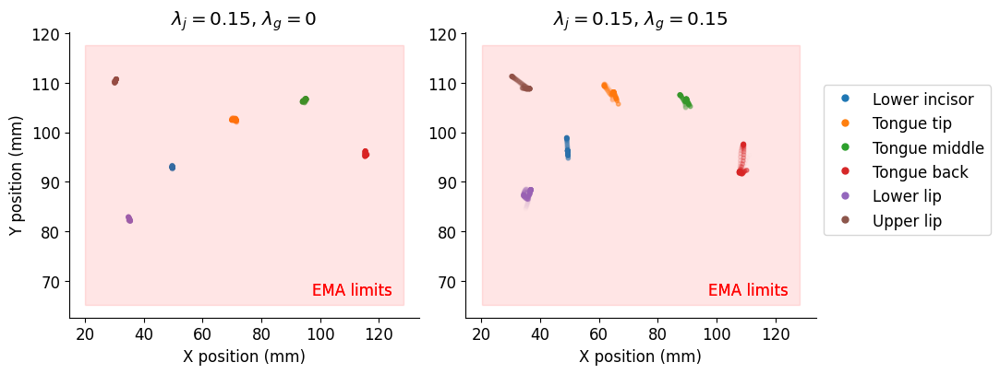

item_0090


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


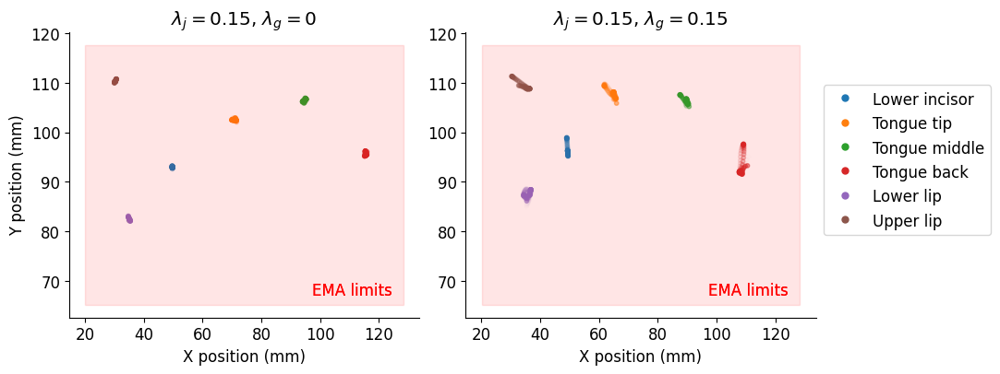

item_0091


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


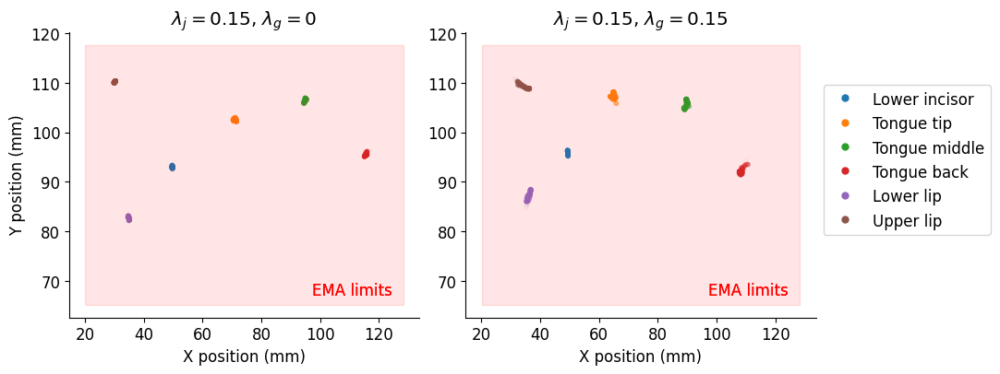

item_0092


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


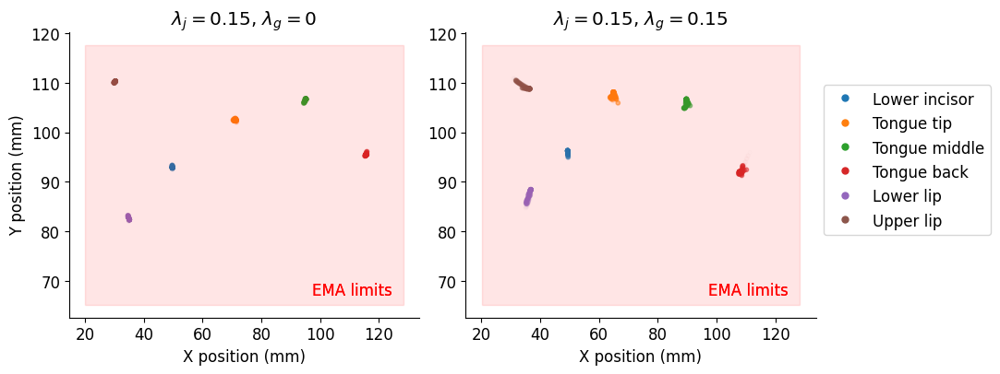

item_0093


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


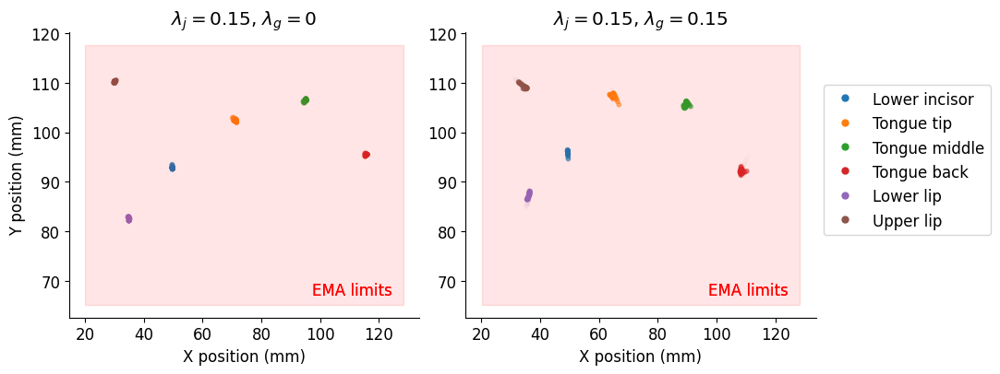

item_0094


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


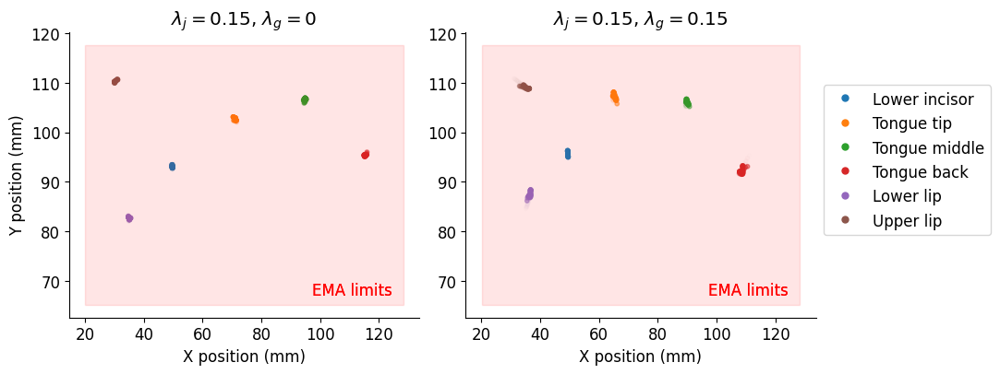

item_0095


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


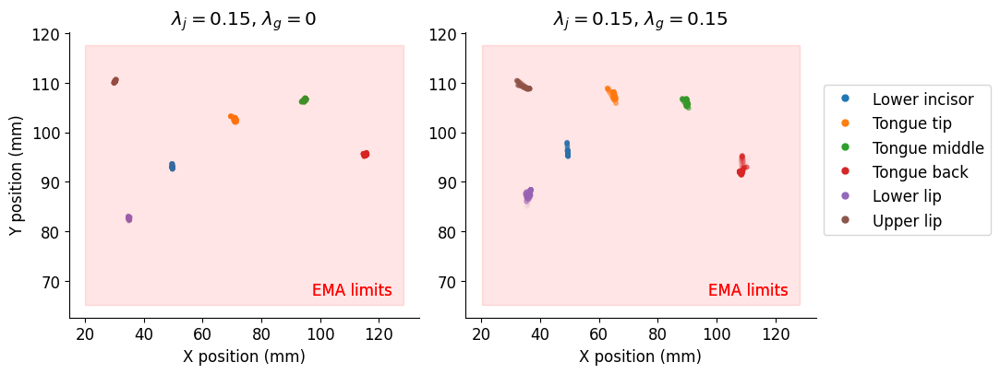

item_0096


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


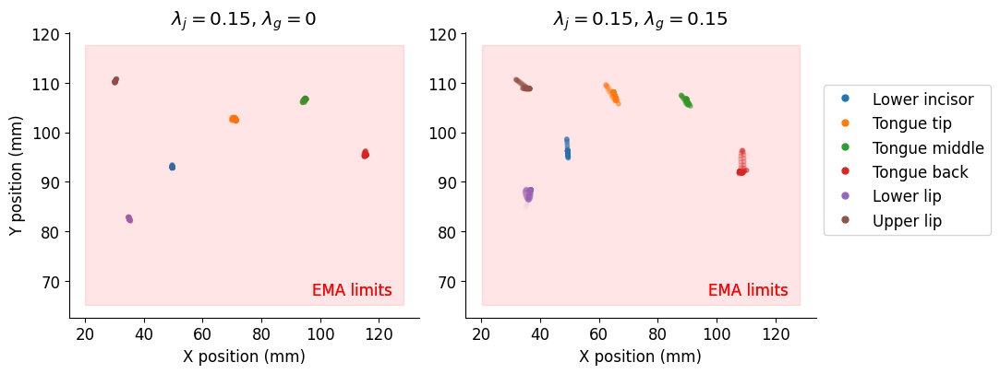

item_0097


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


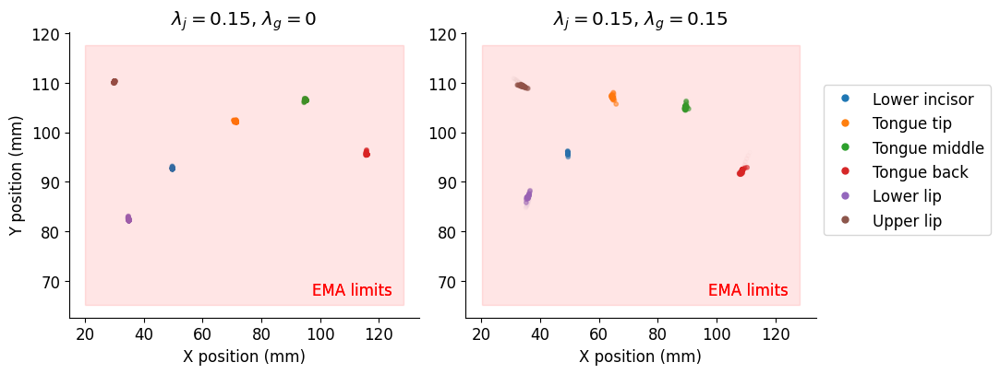

item_0098


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


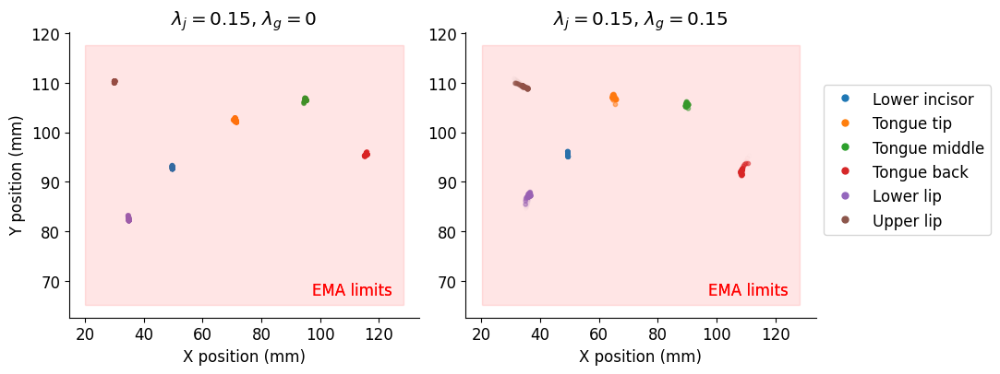

item_0099


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


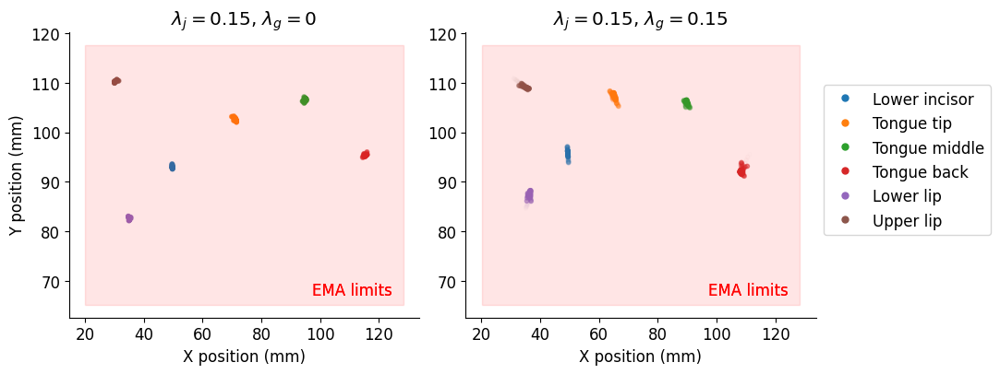

item_0100


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


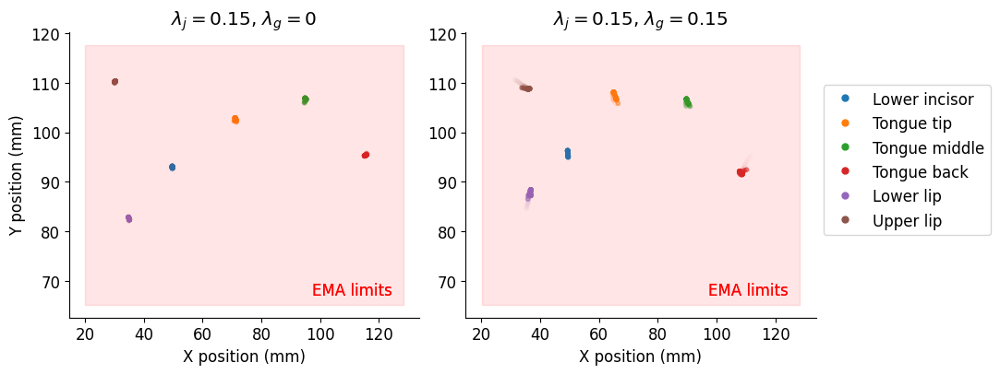

item_0101


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


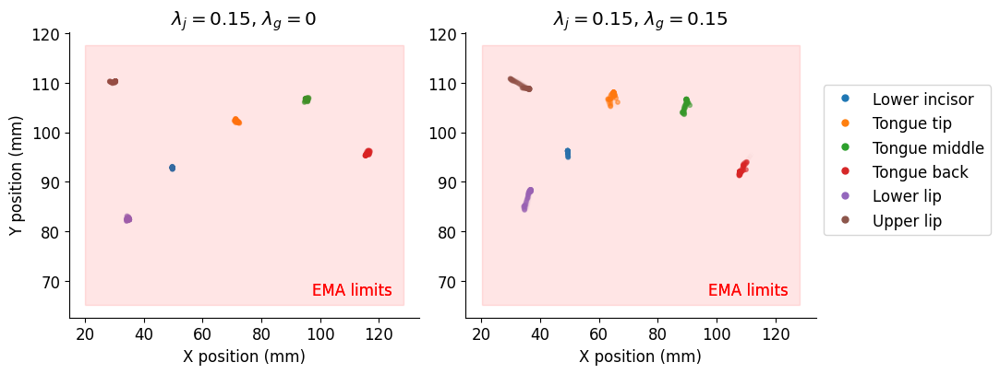

item_0102


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


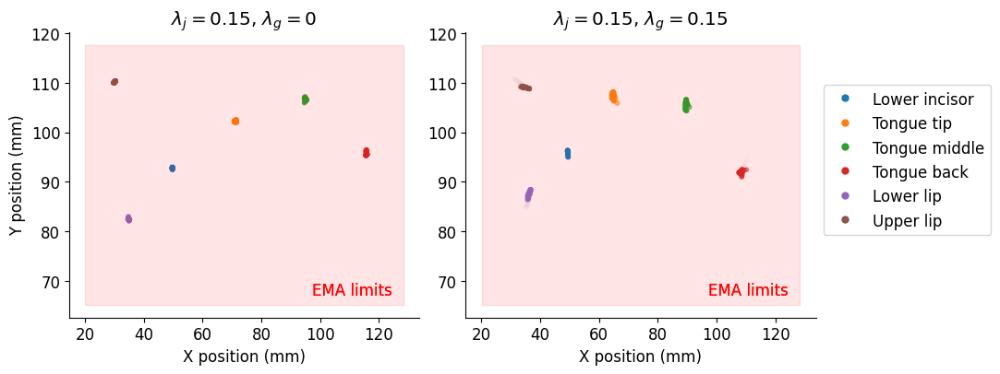

item_0103


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


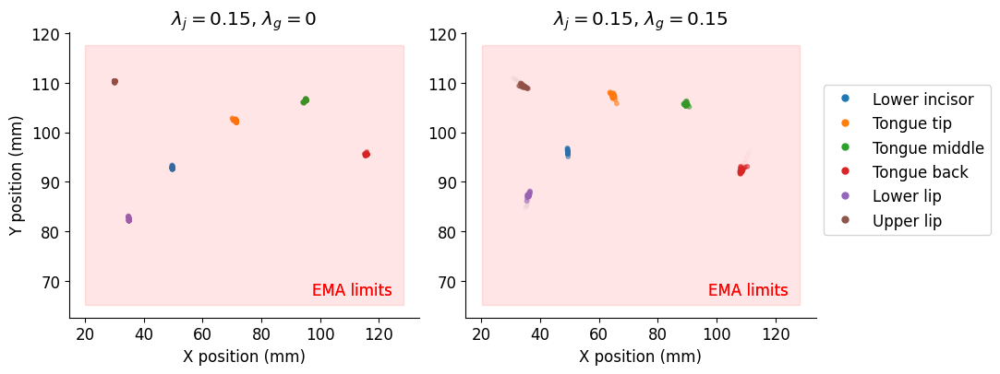

item_0104


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


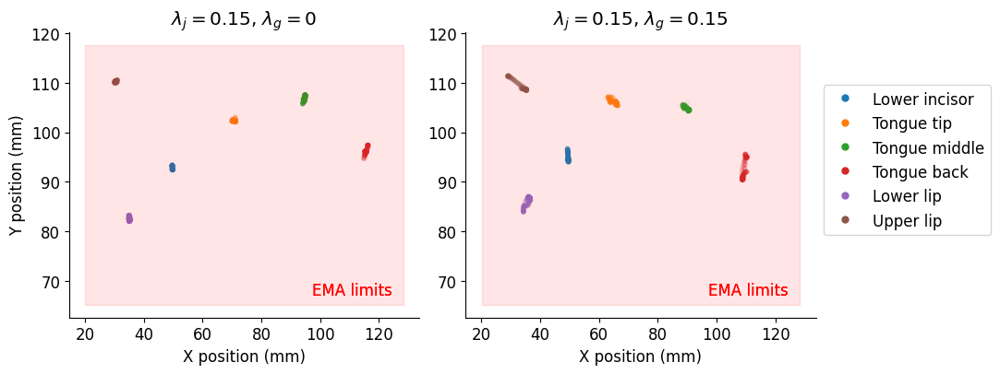

item_0105


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


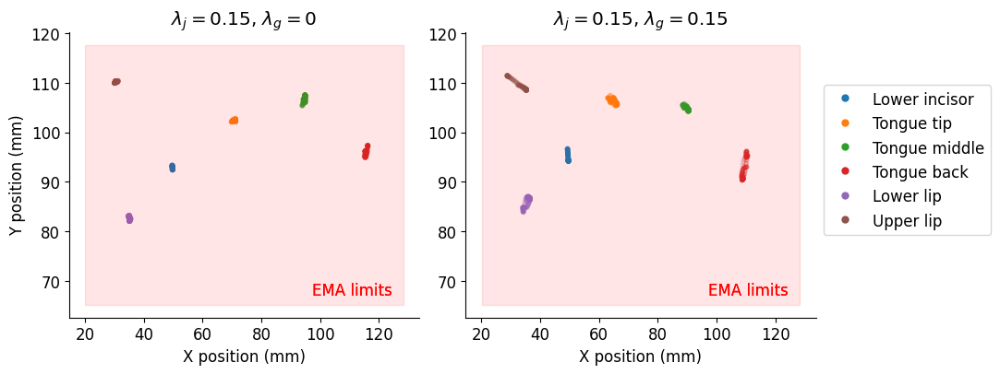

item_0106


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


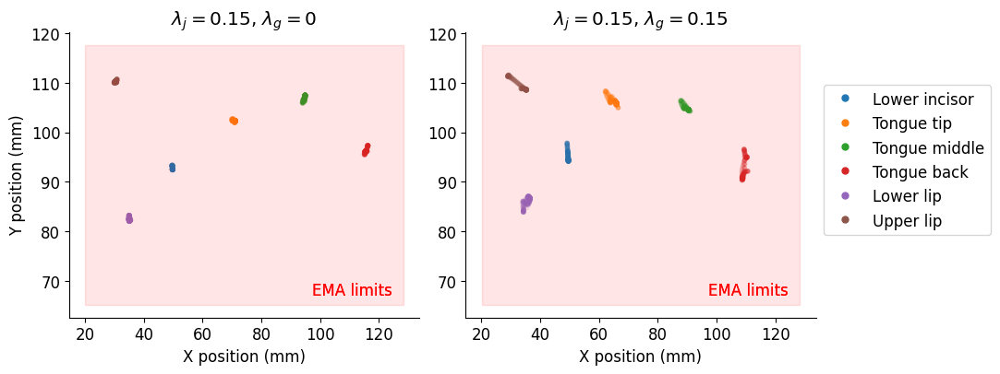

item_0107


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


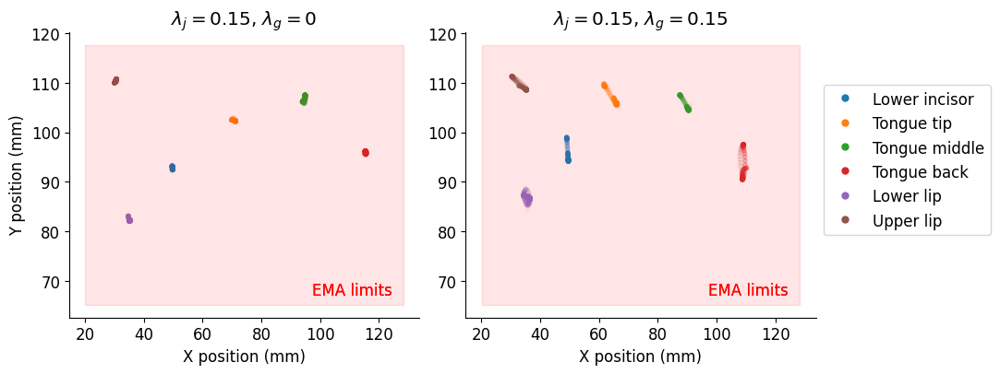

item_0108


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


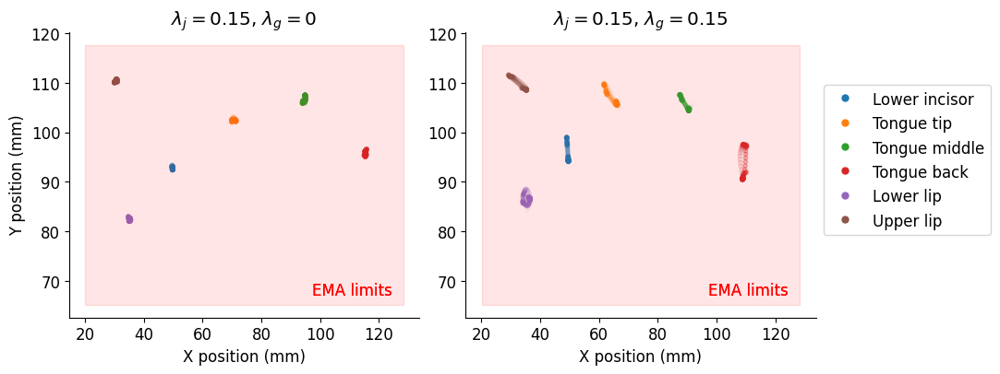

item_0109


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


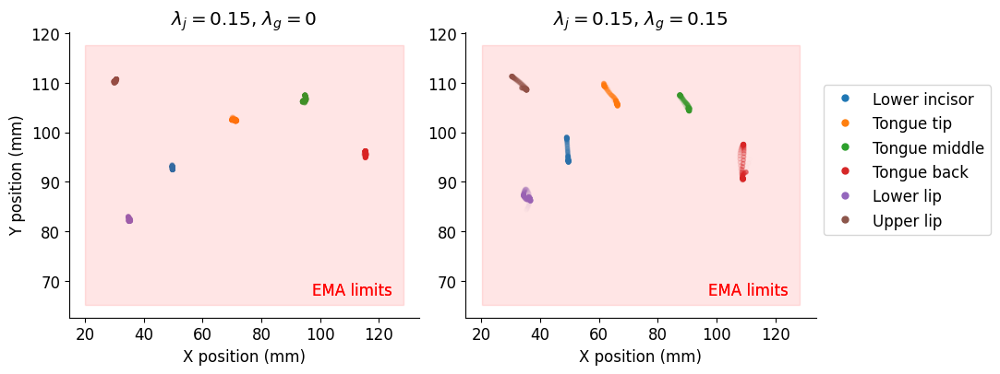

item_0110


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


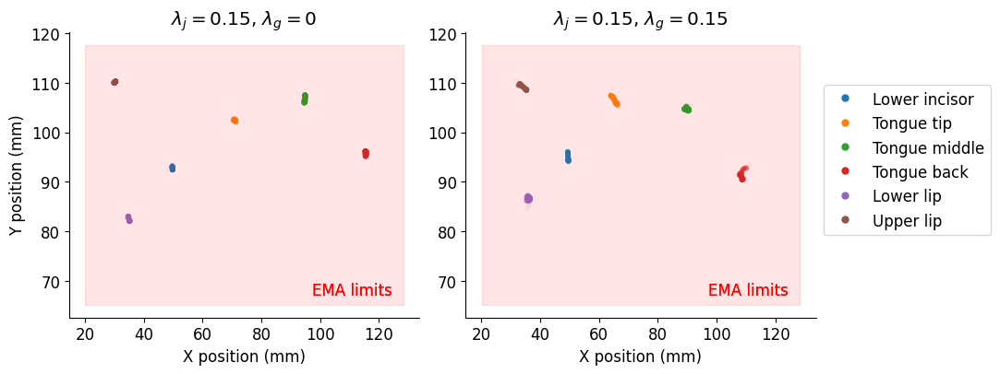

item_0111


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


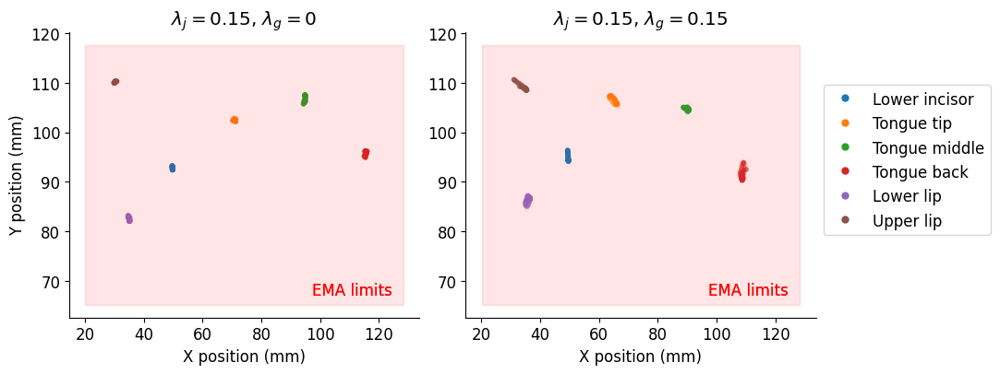

item_0112


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


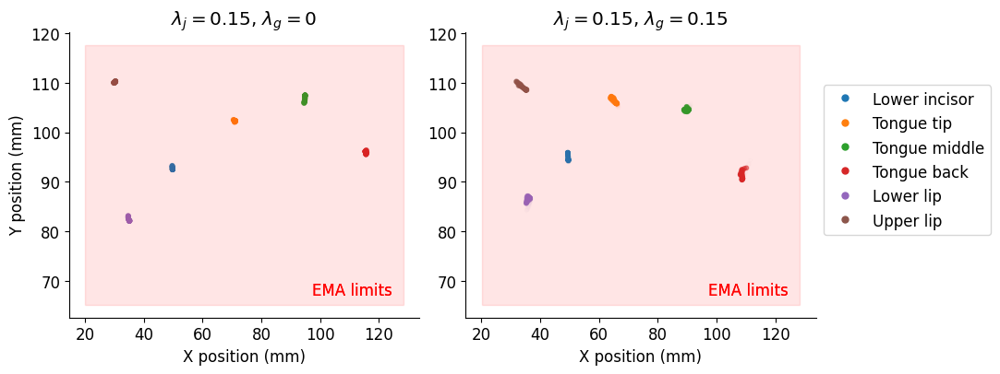

item_0113


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


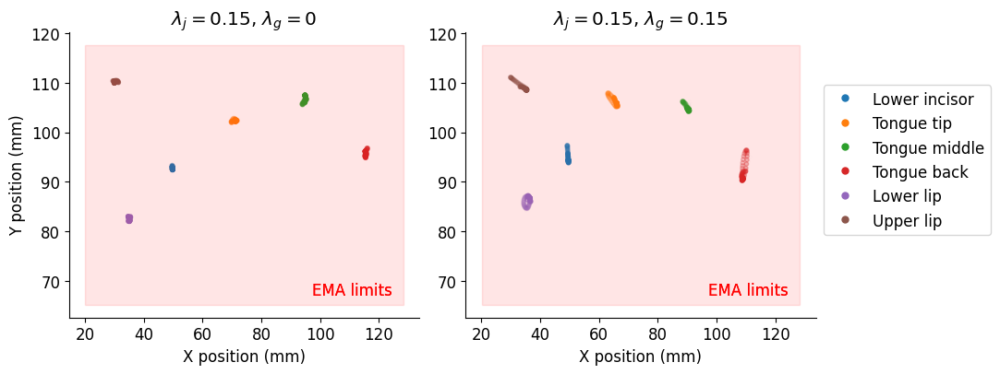

item_0114


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


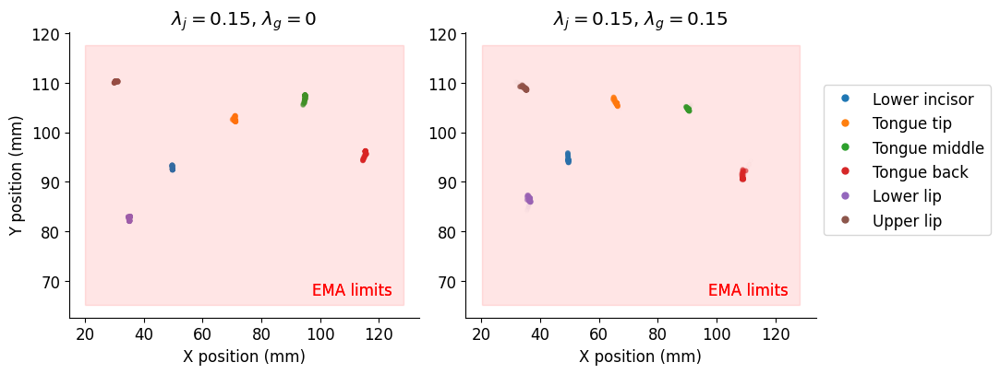

item_0115


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


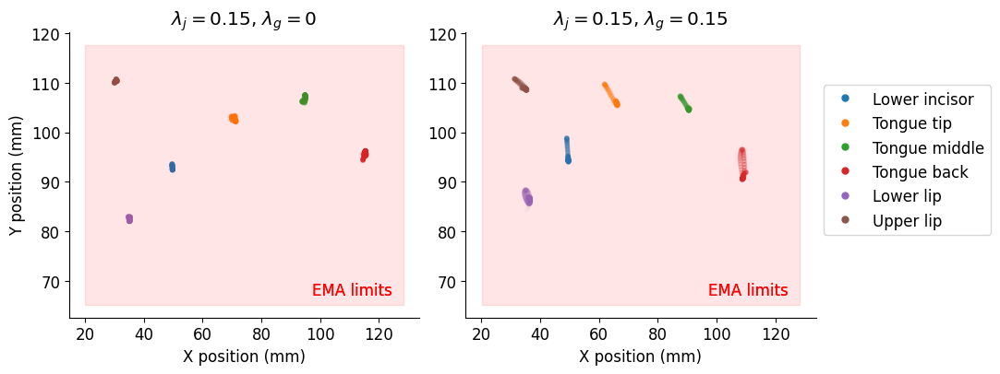

item_0116


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


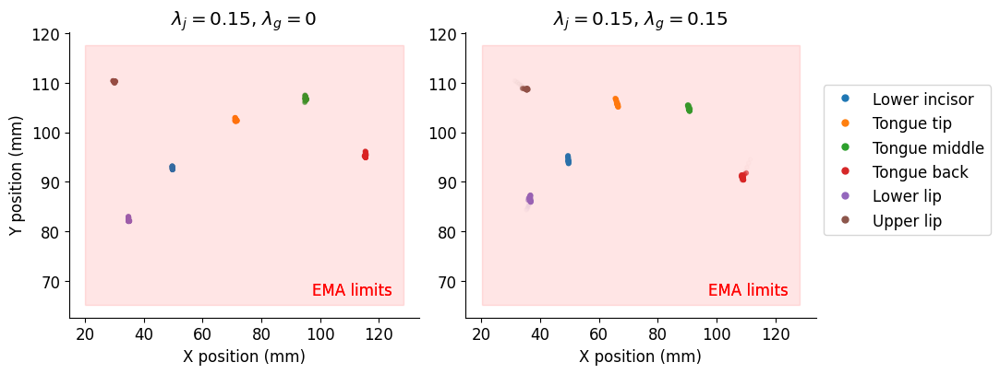

item_0117


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


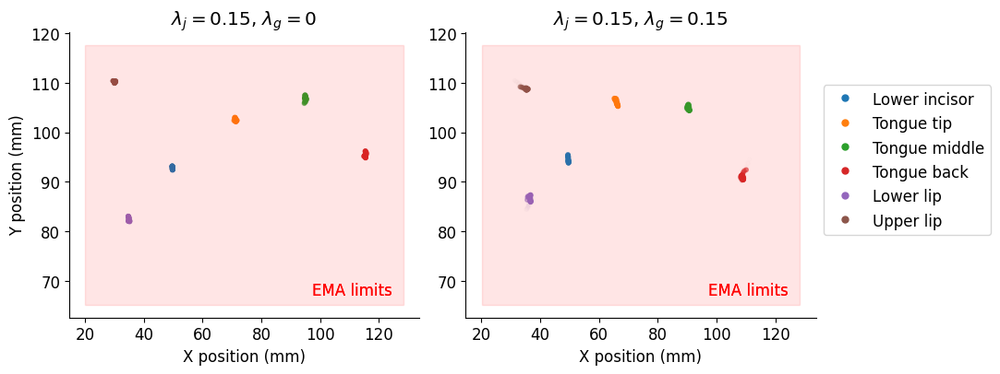

item_0118


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


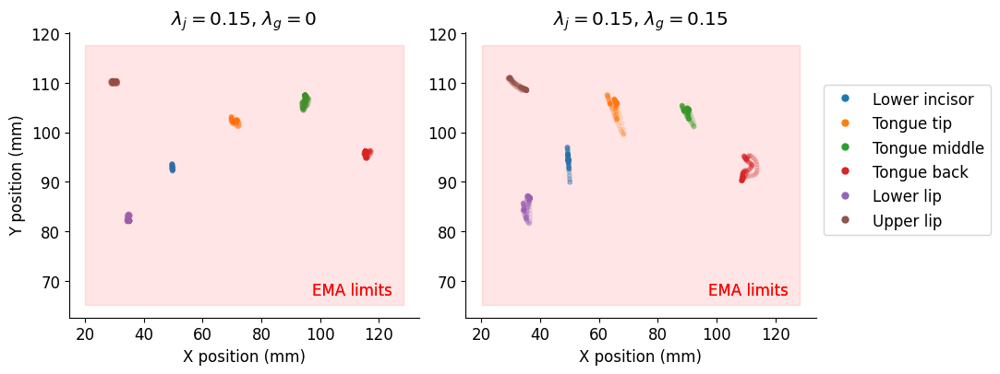

item_0119


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


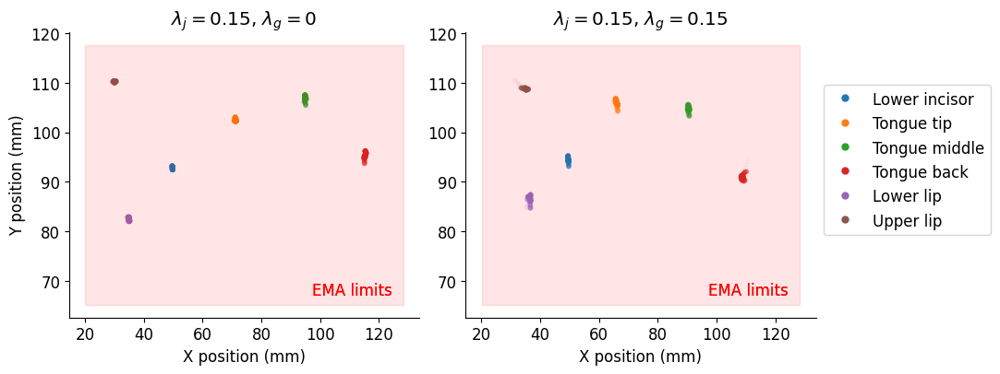

item_0120


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


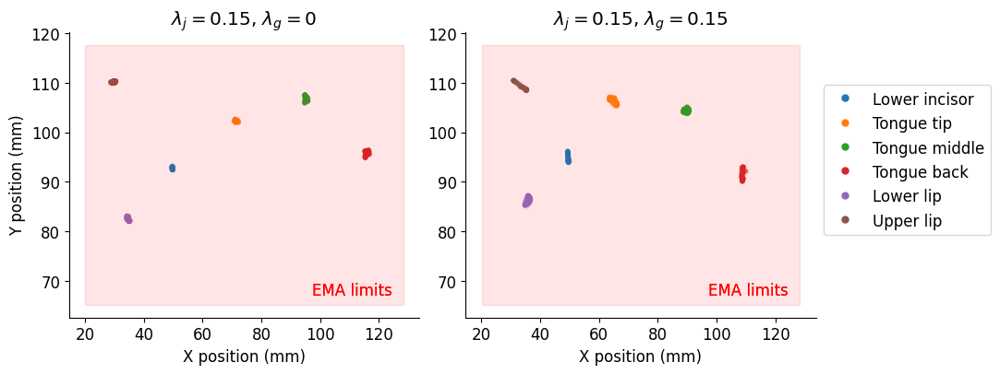

item_0121


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


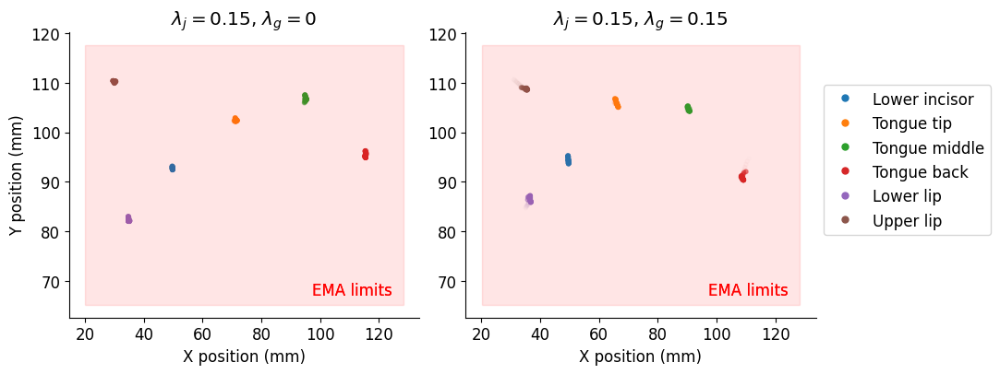

item_0122


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


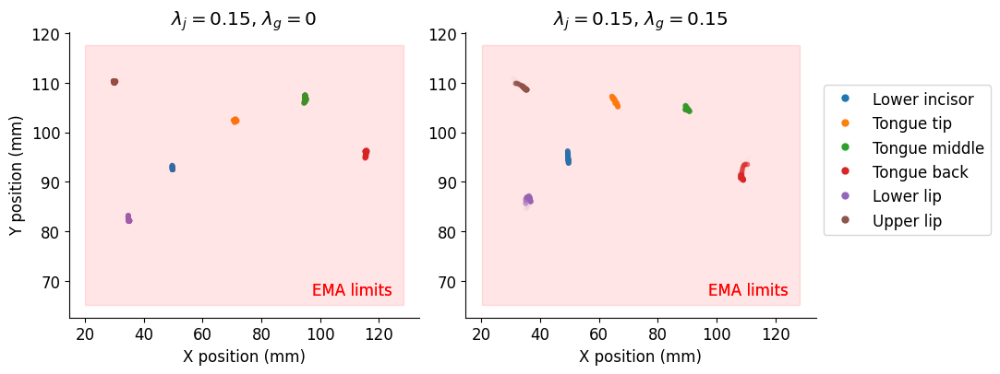

item_0123


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


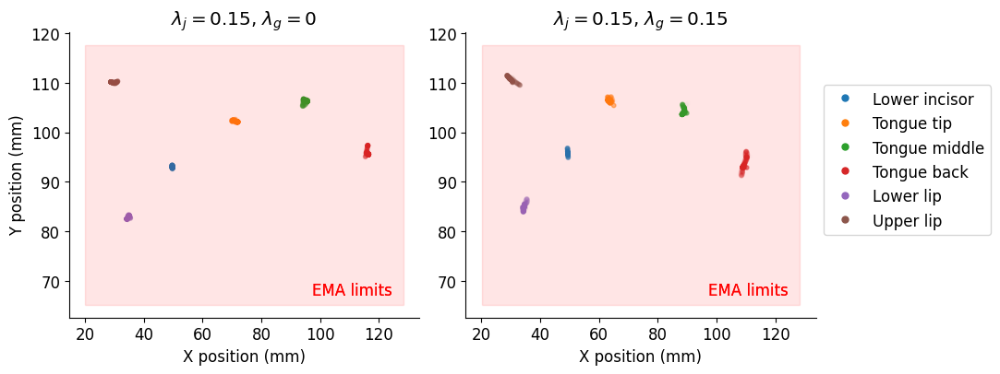

item_0124


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


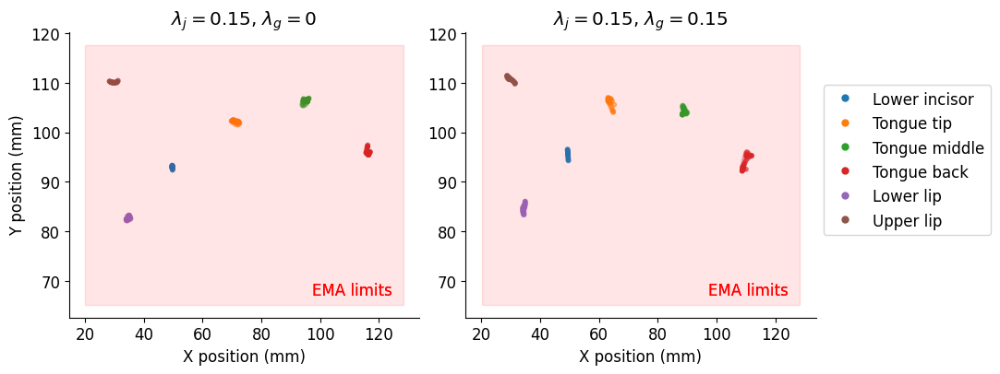

item_0125


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


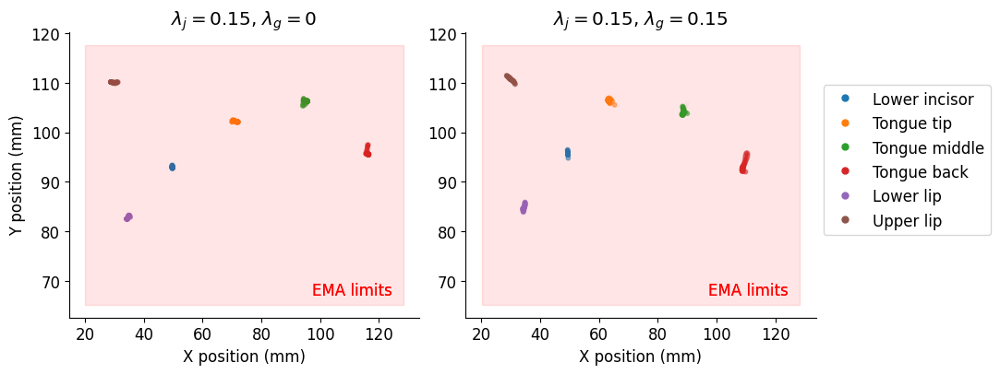

item_0126


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


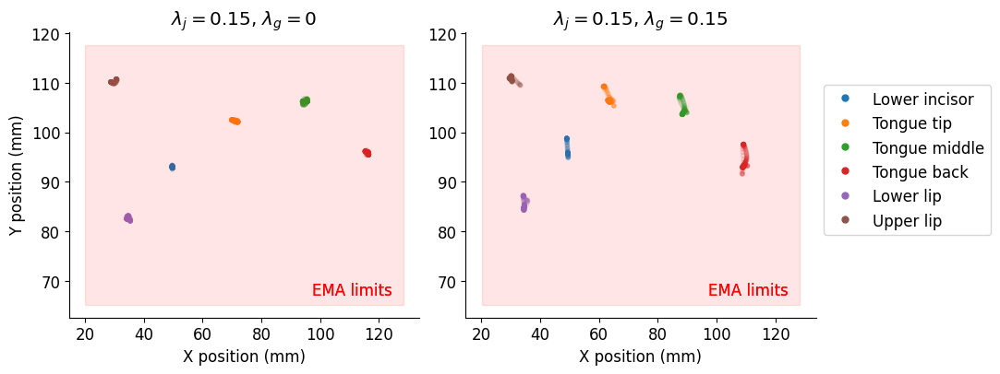

item_0127


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


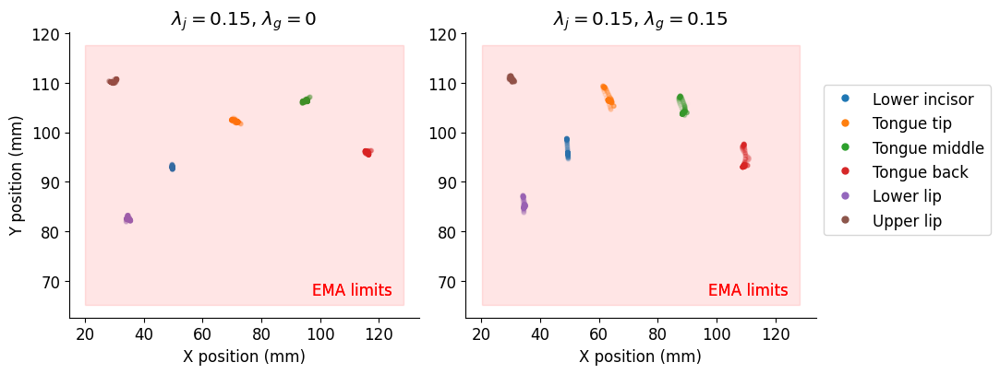

item_0128


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


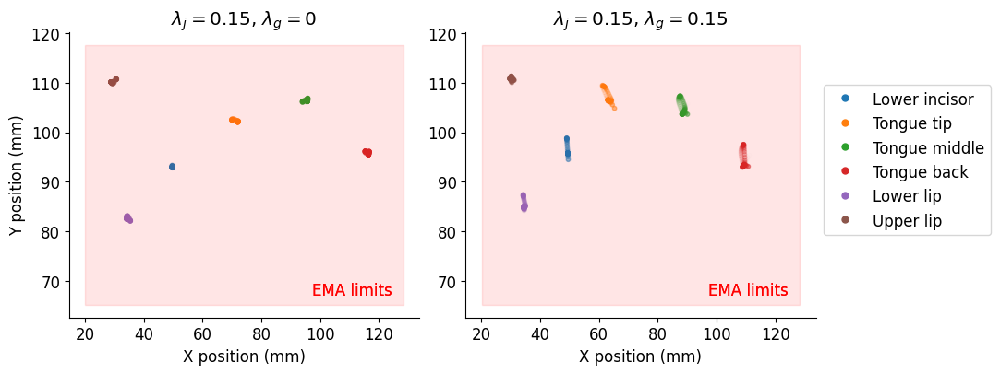

item_0129


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


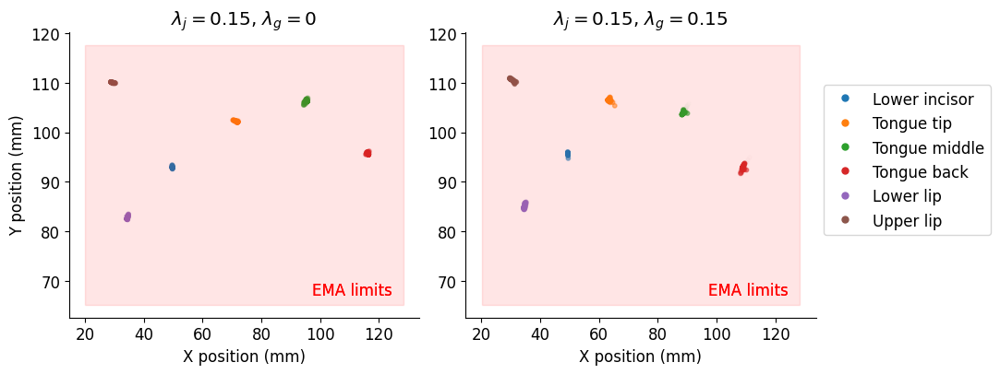

item_0130


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


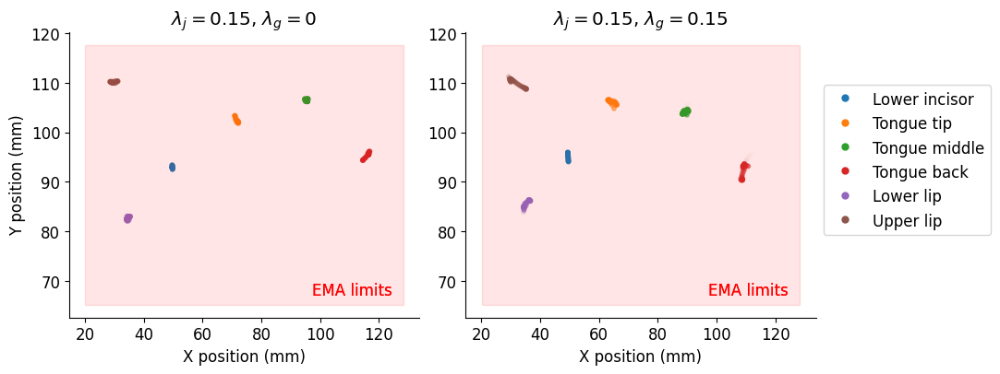

item_0131


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


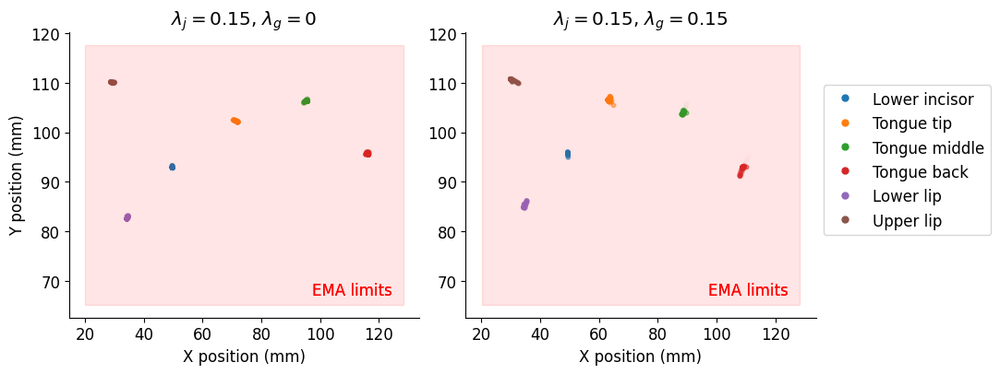

item_0132


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


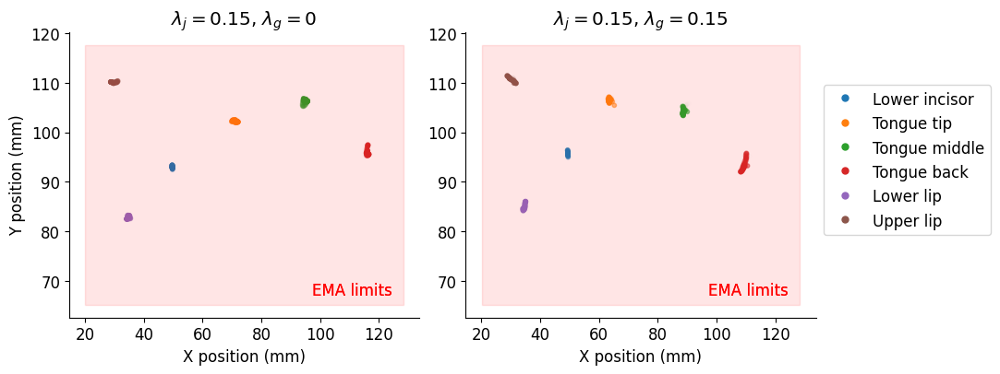

item_0133


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


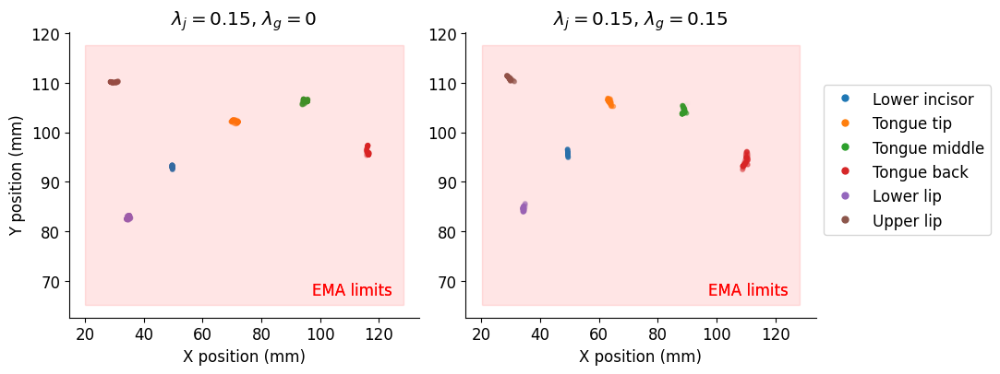

item_0134


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


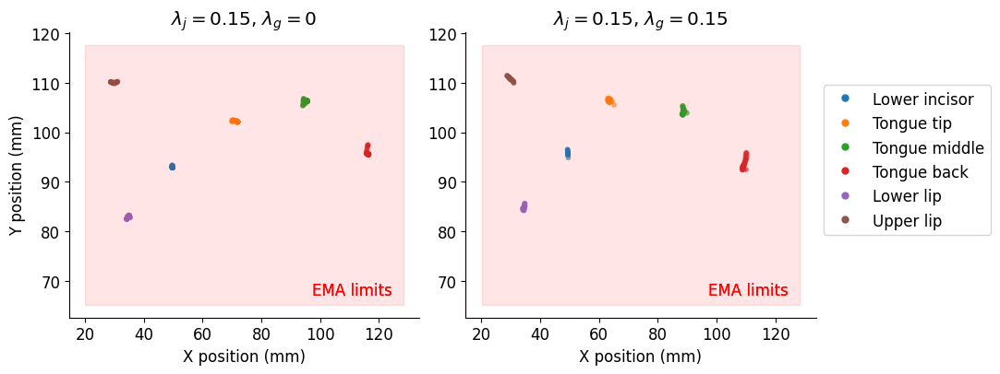

item_0135


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


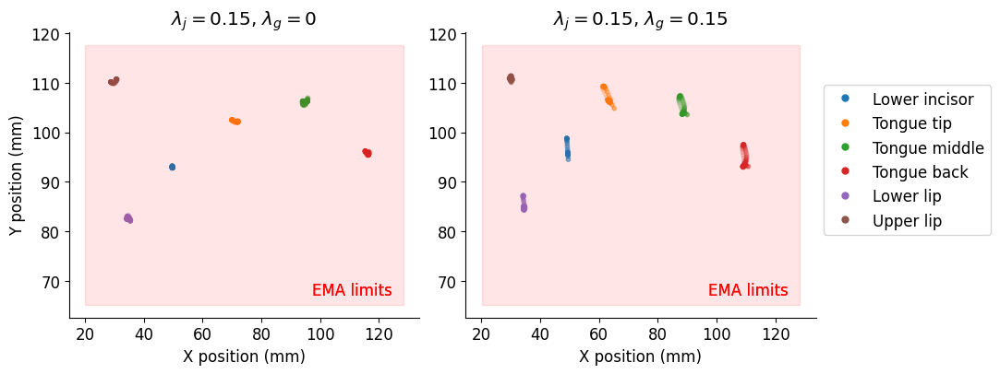

item_0136


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


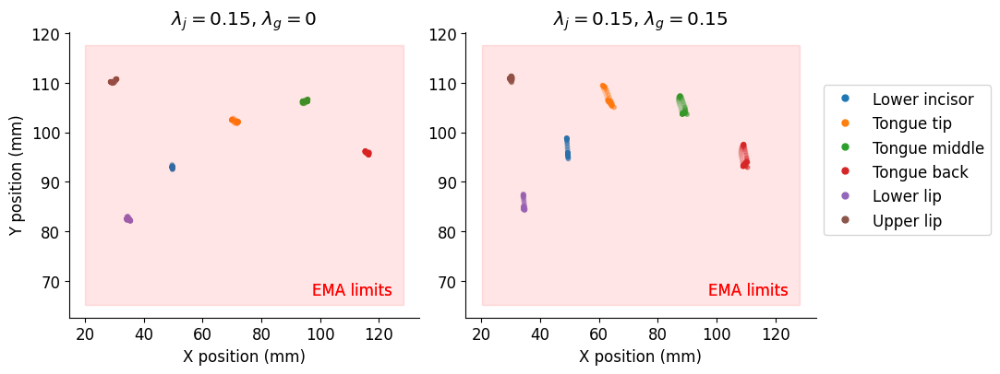

item_0137


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


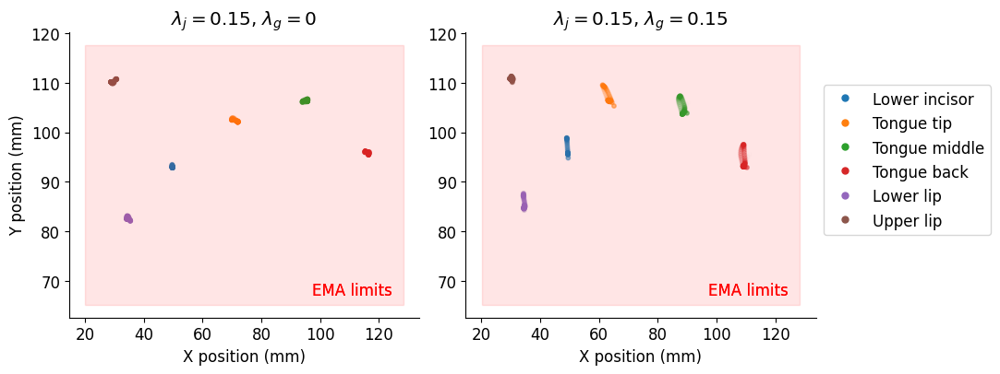

item_0138


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


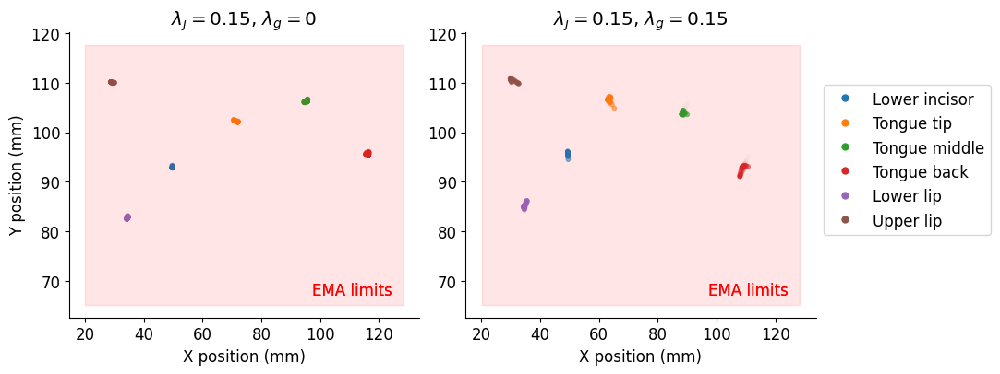

item_0139


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


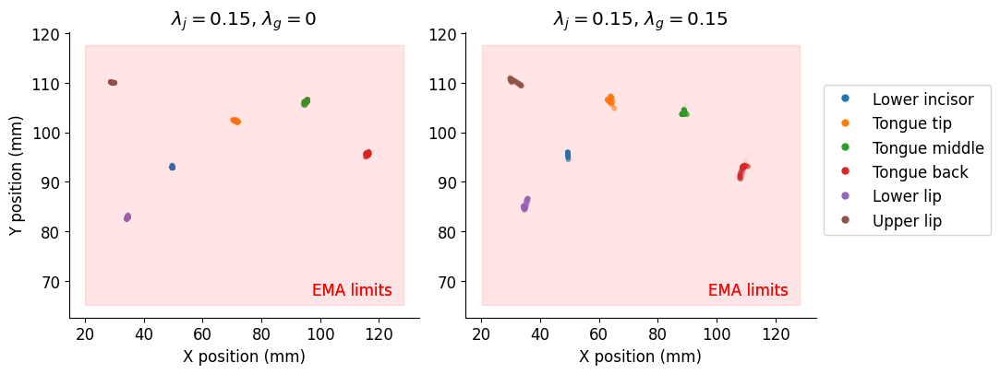

item_0140


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


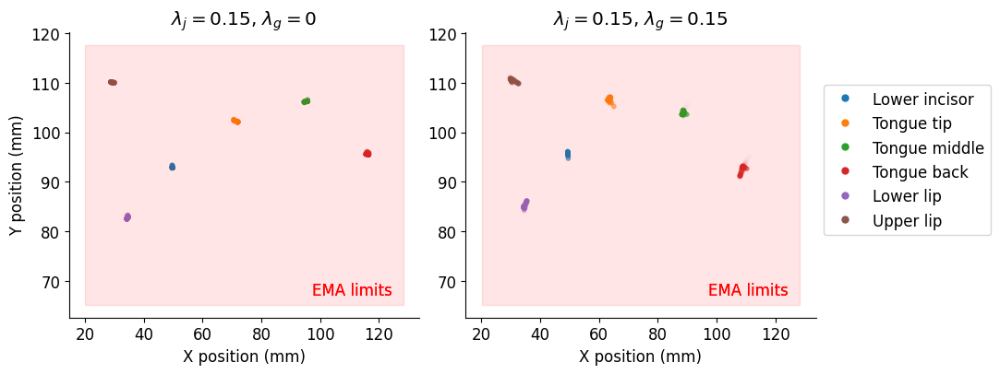

item_0141


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


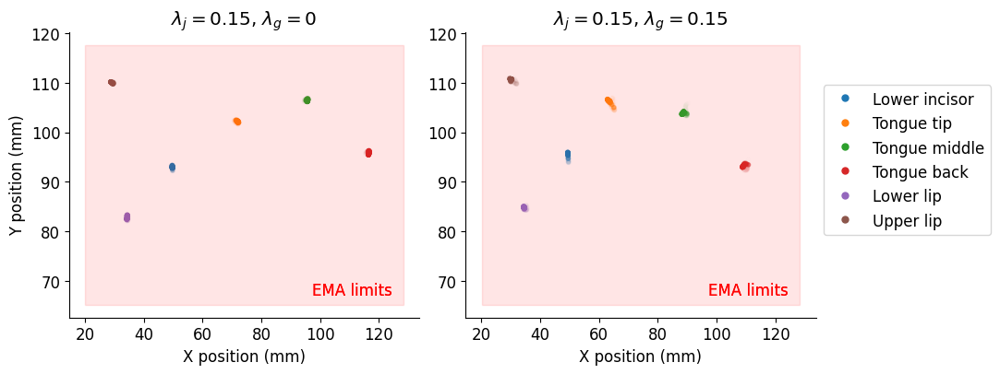

item_0142


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


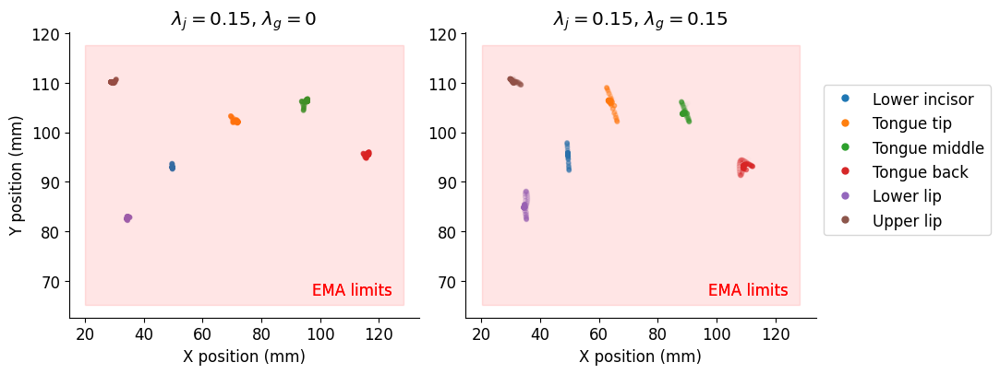

item_0143


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


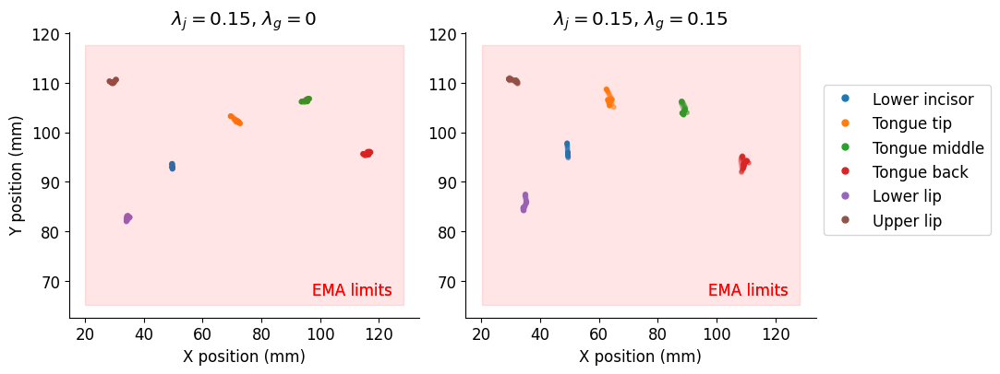

item_0144


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


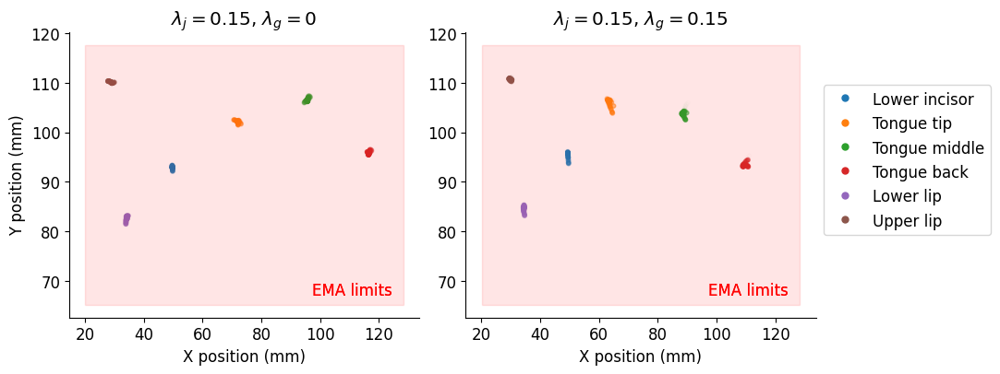

item_0145


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


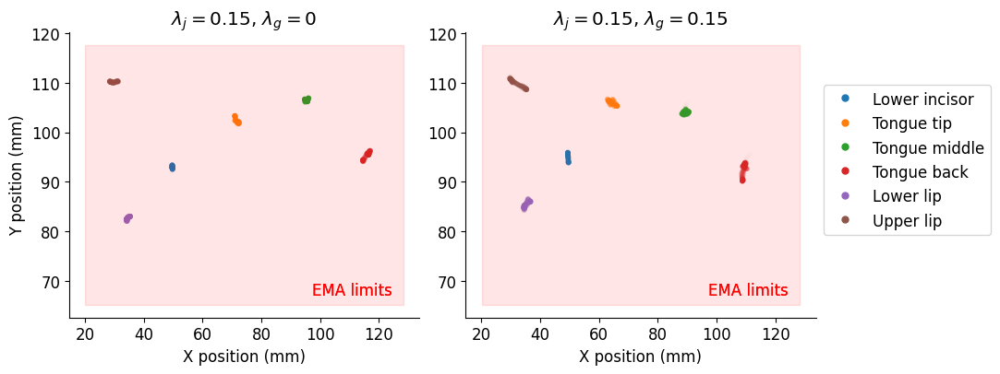

item_0146


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


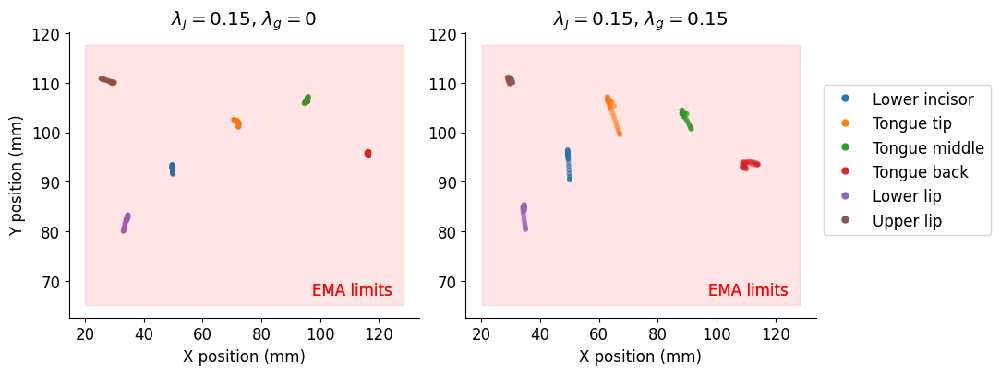

item_0147


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


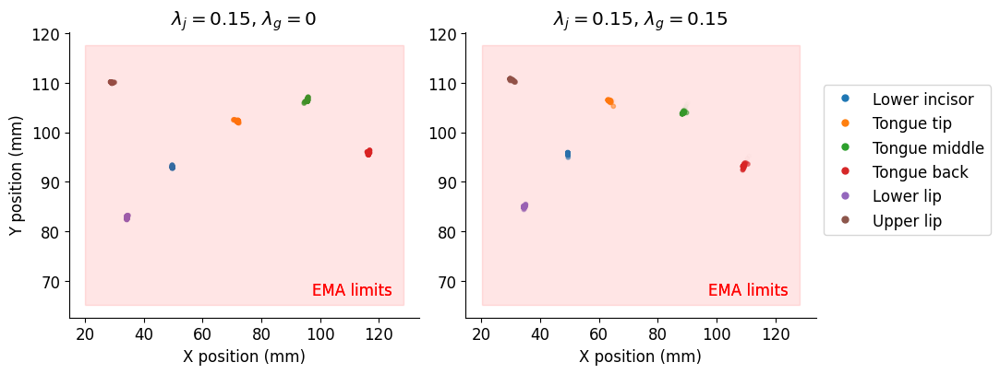

item_0148


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


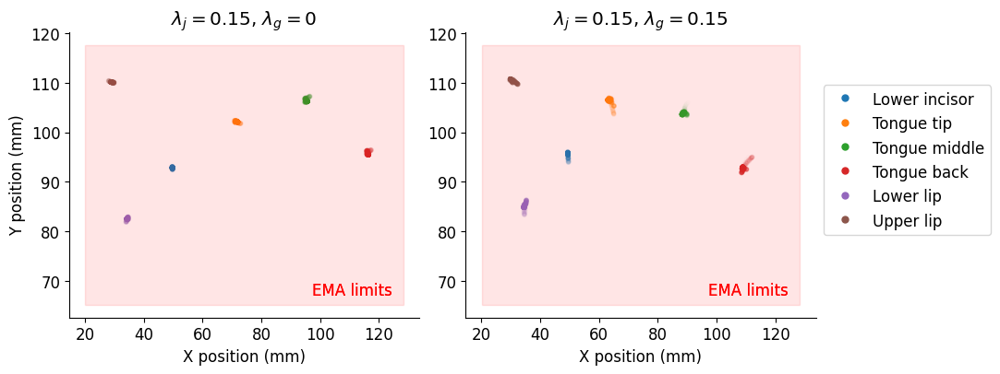

item_0149


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


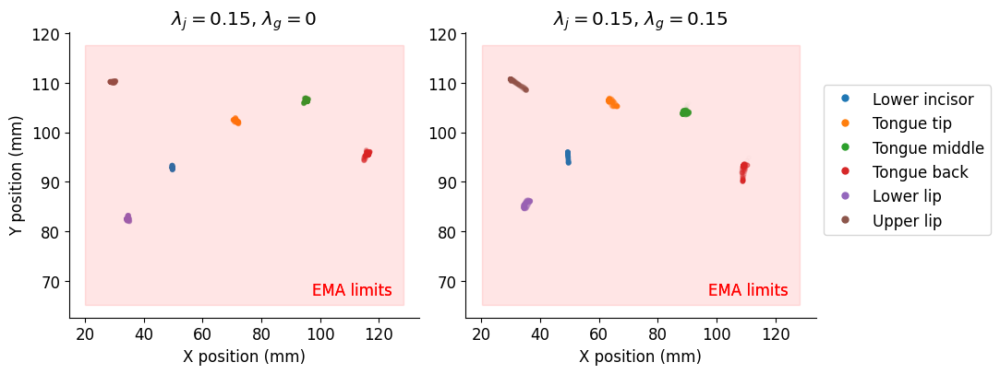

item_0150


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


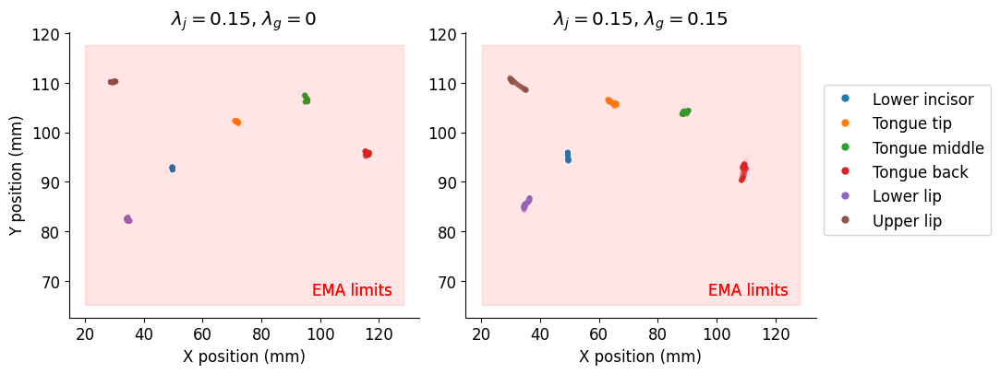

item_0151


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


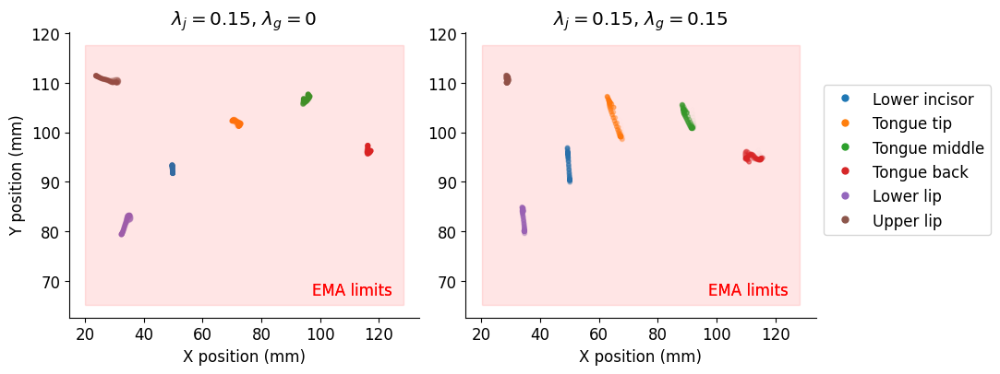

item_0152


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


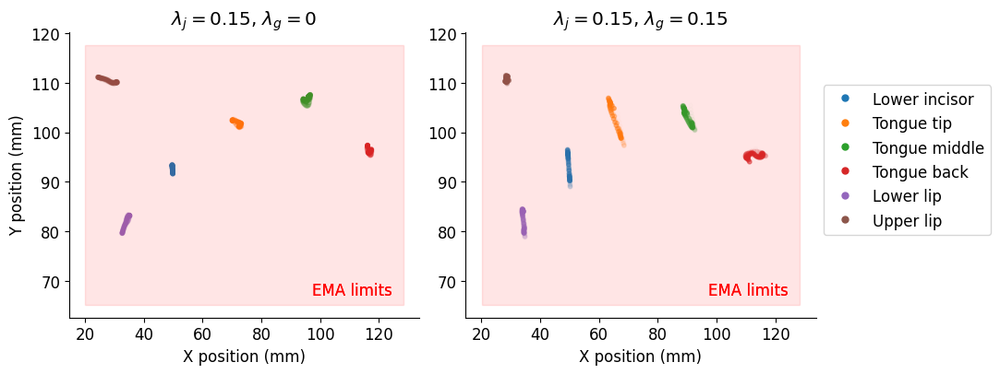

item_0153


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


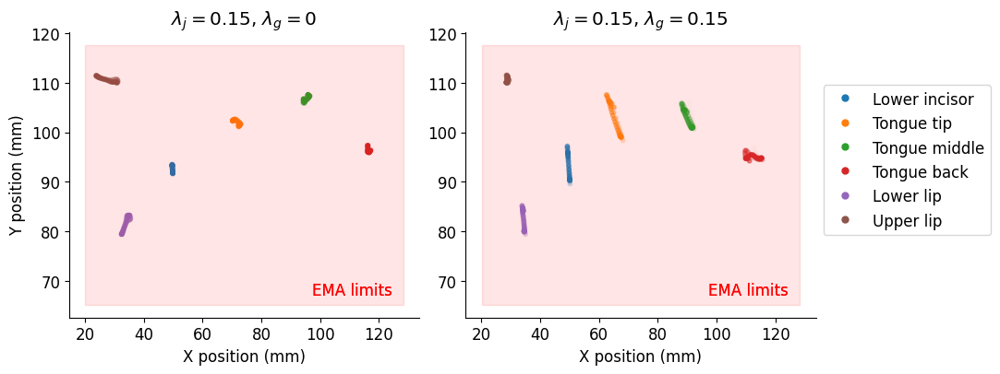

item_0154


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


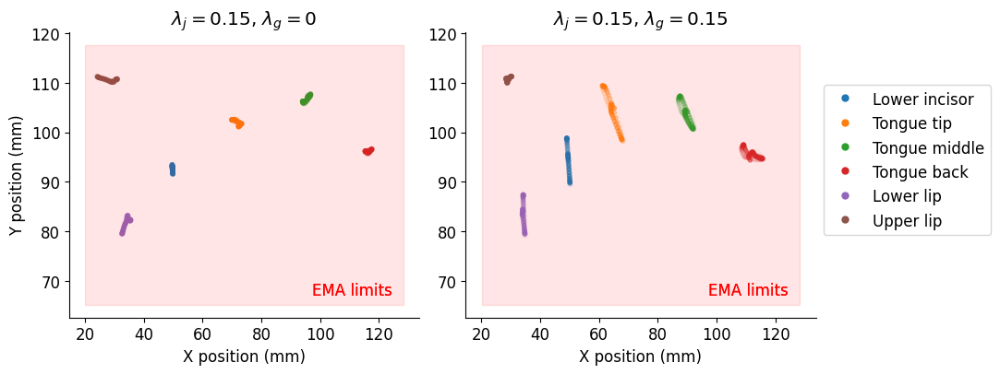

item_0155


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


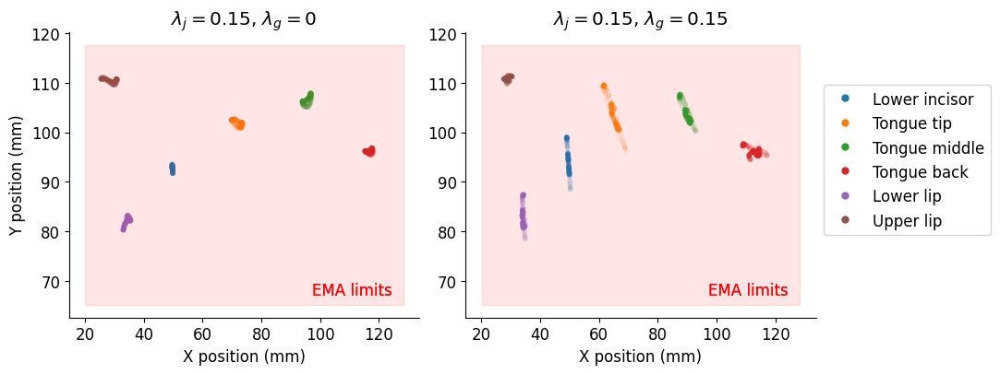

item_0156


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


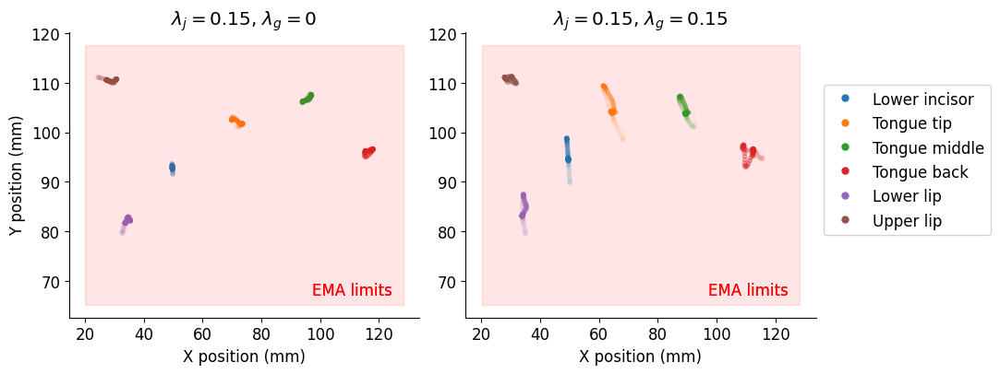

item_0157


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


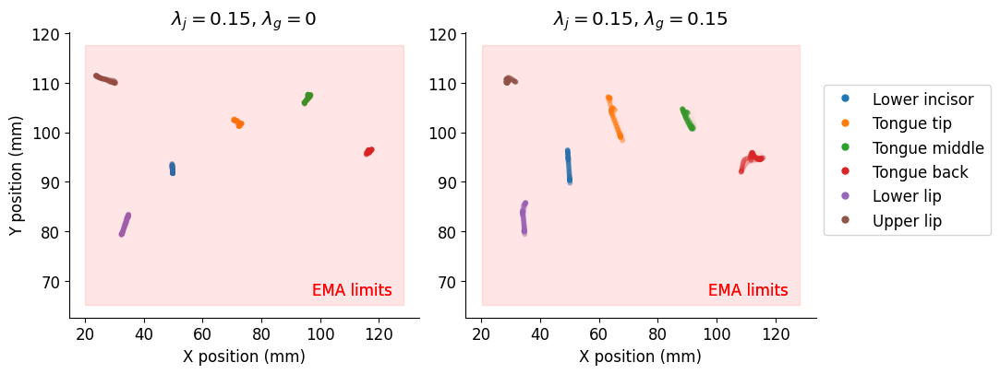

item_0158


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


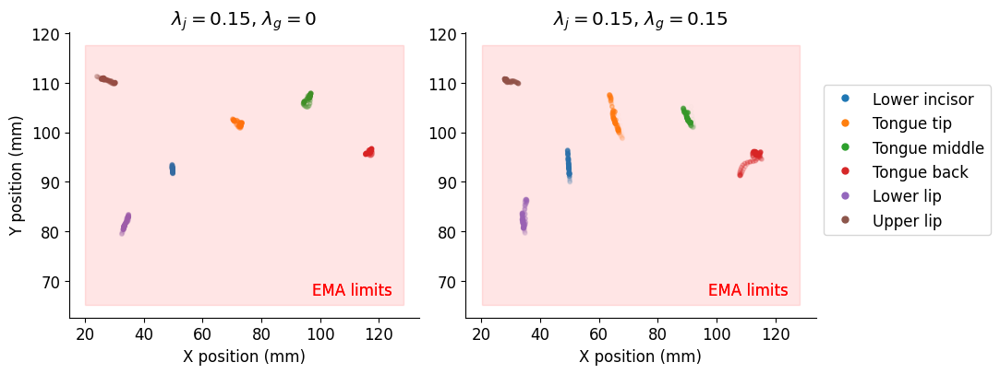

item_0159


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


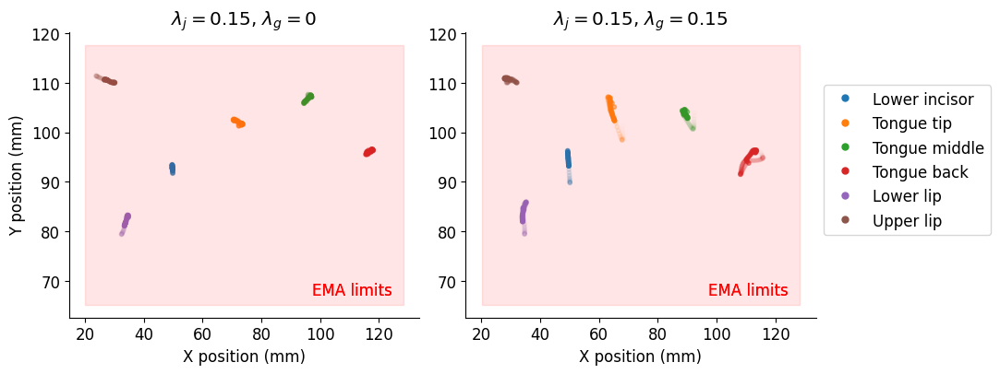

item_0160


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


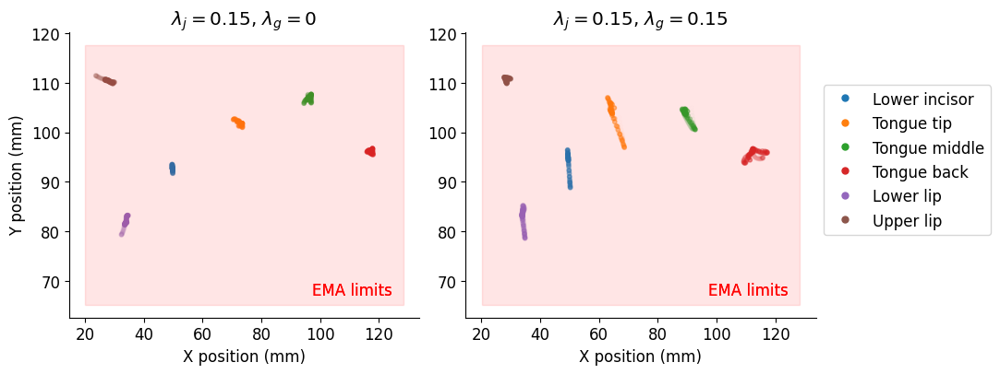

item_0161


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


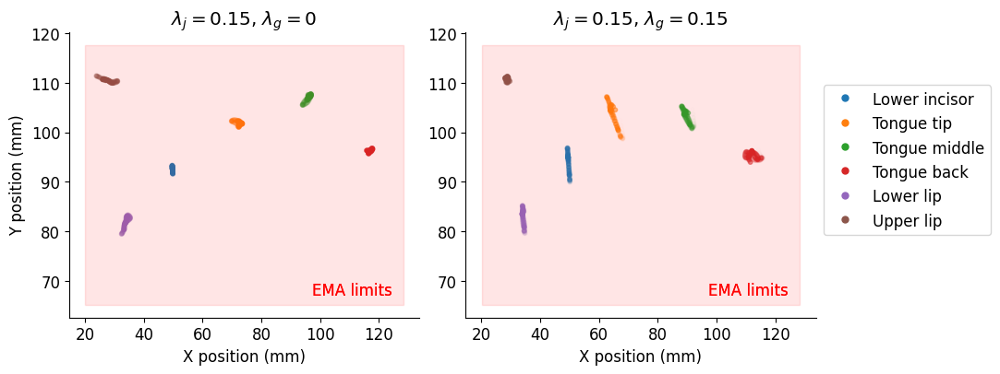

item_0162


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


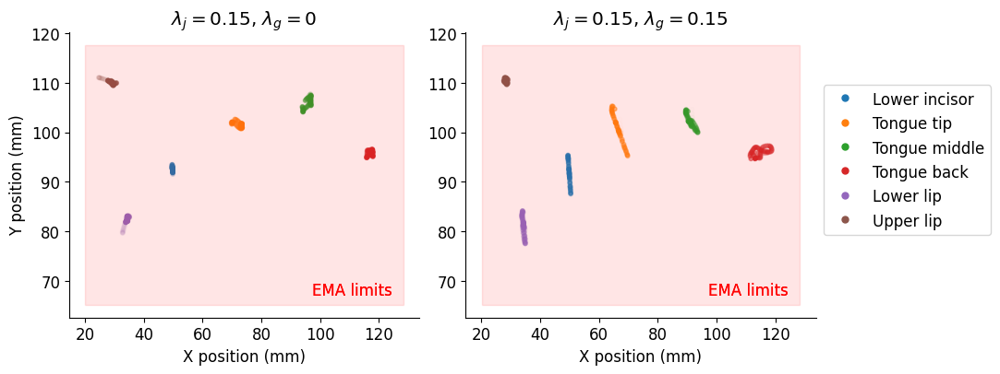

item_0163


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


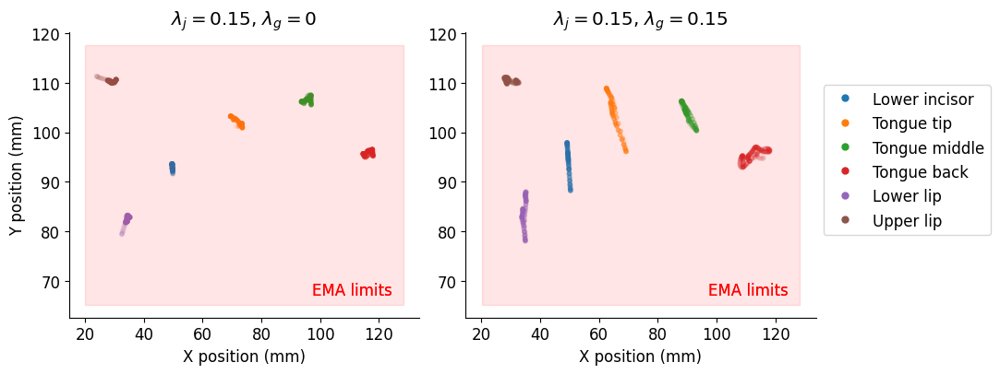

item_0164


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


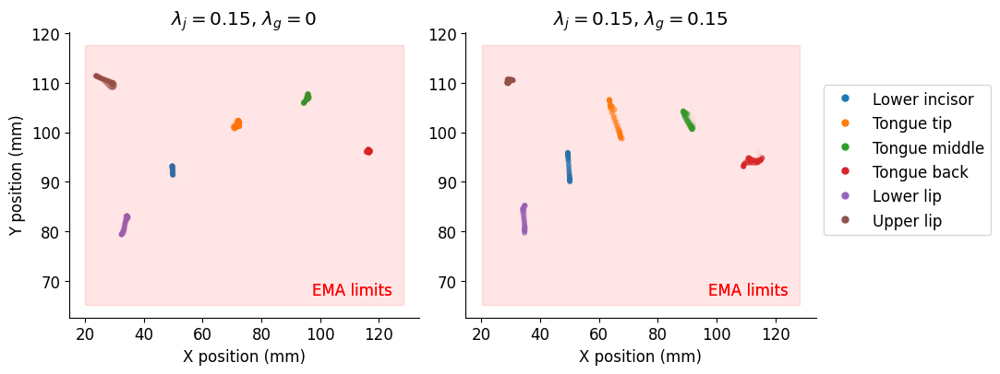

item_0165


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


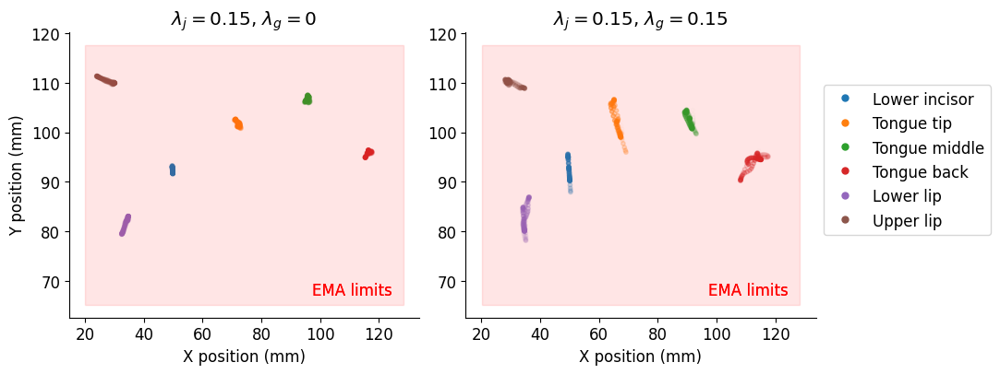

item_0166


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


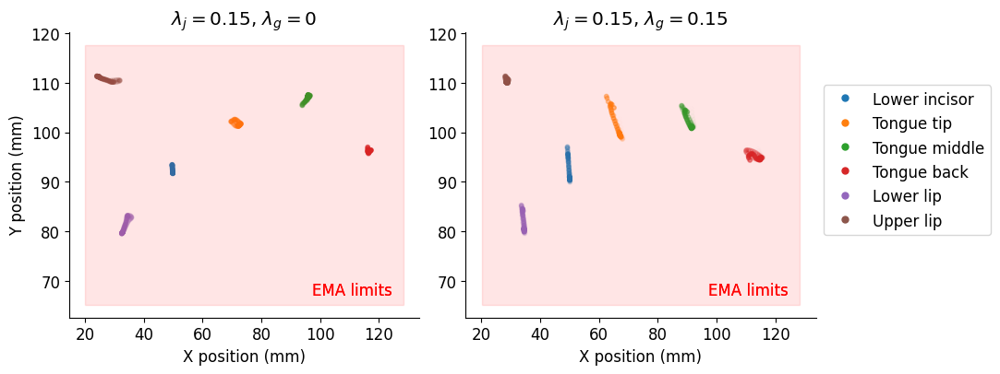

item_0167


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


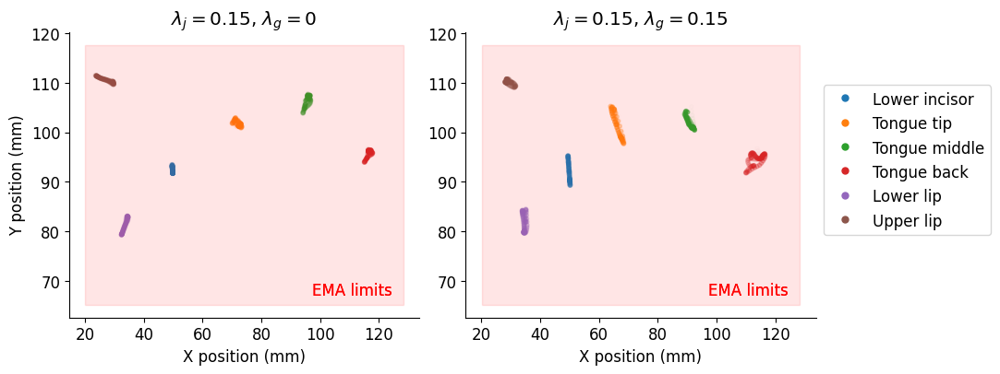

item_0168


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


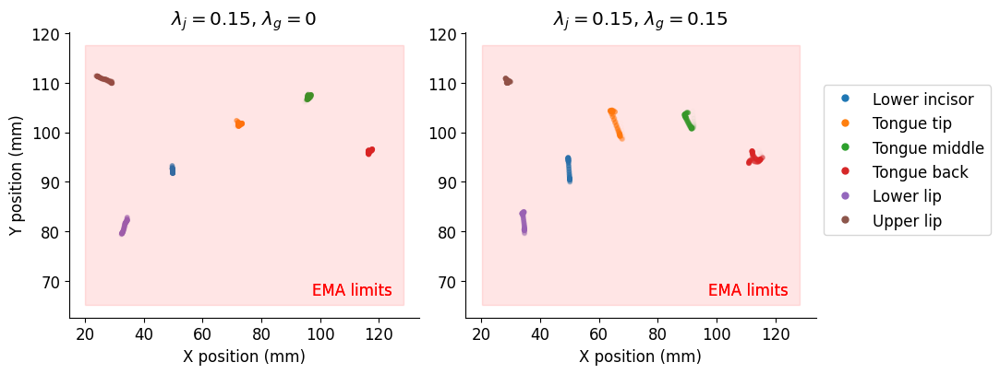

item_0169


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


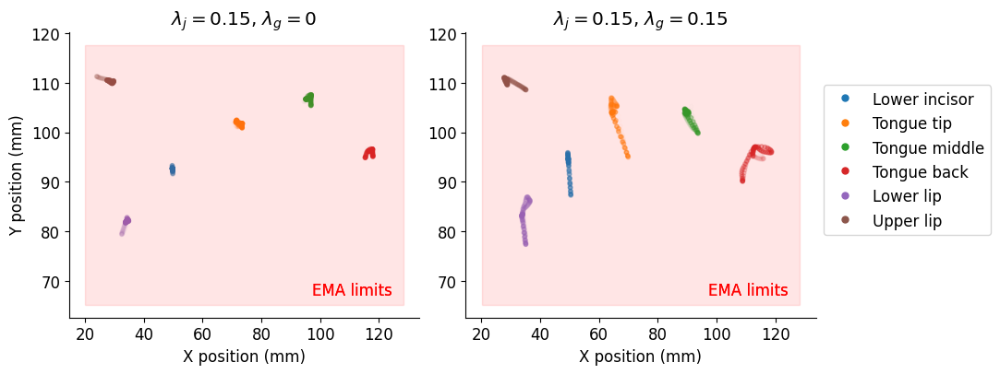

item_0170


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


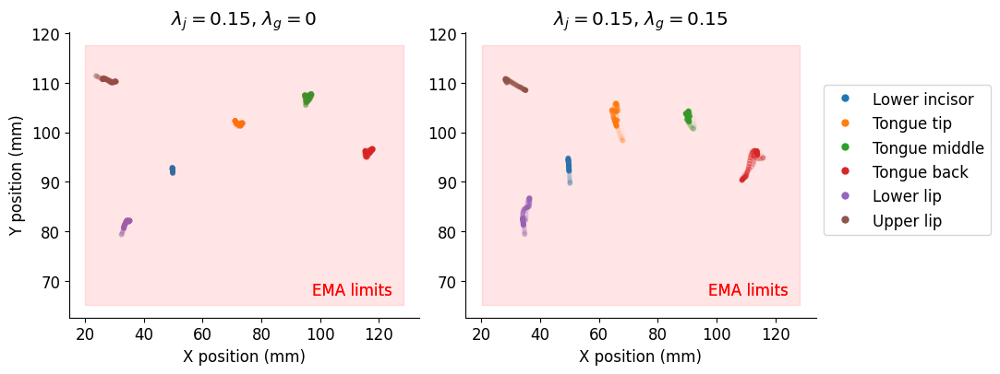

item_0171


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


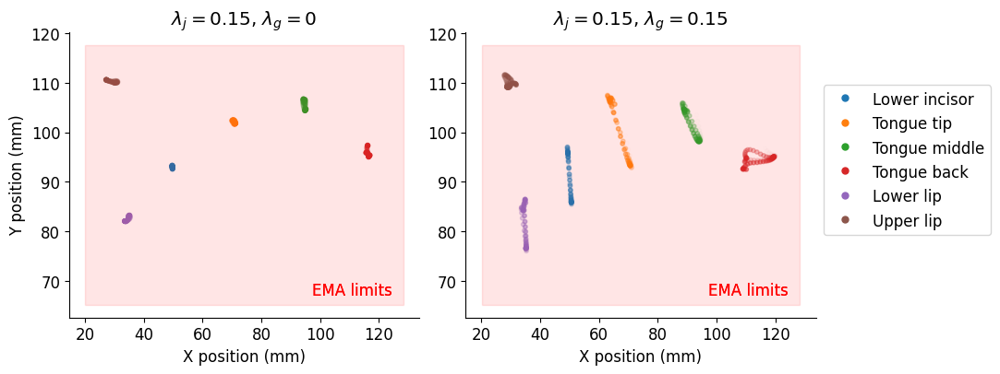

item_0172


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


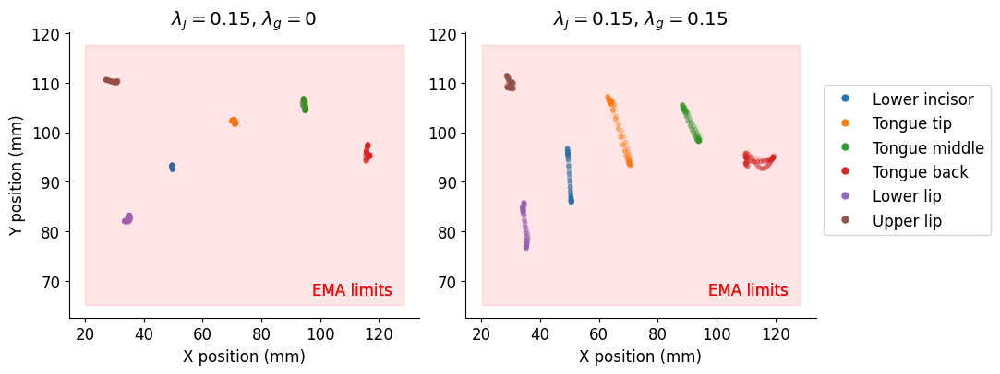

item_0173


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


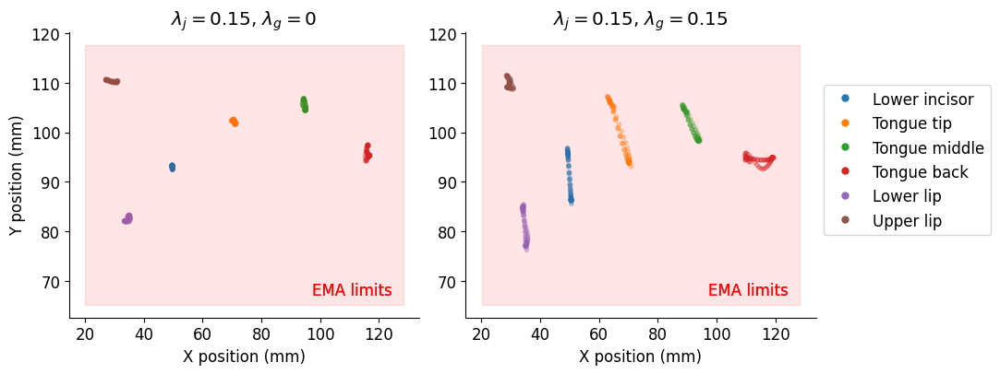

item_0174


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


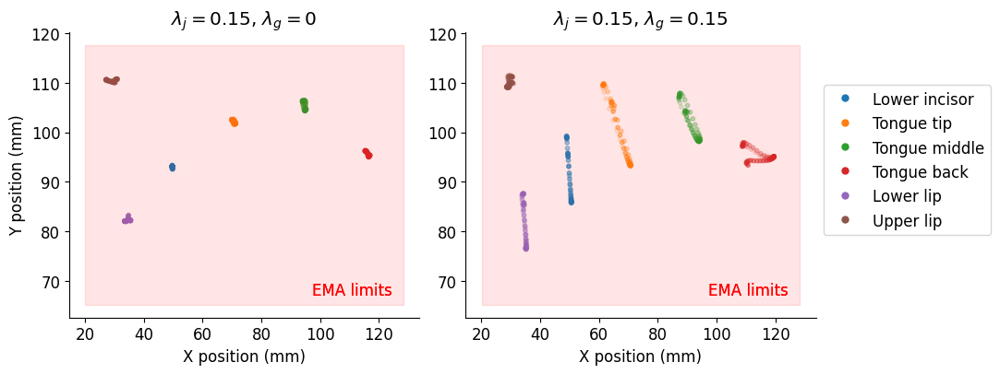

item_0175


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


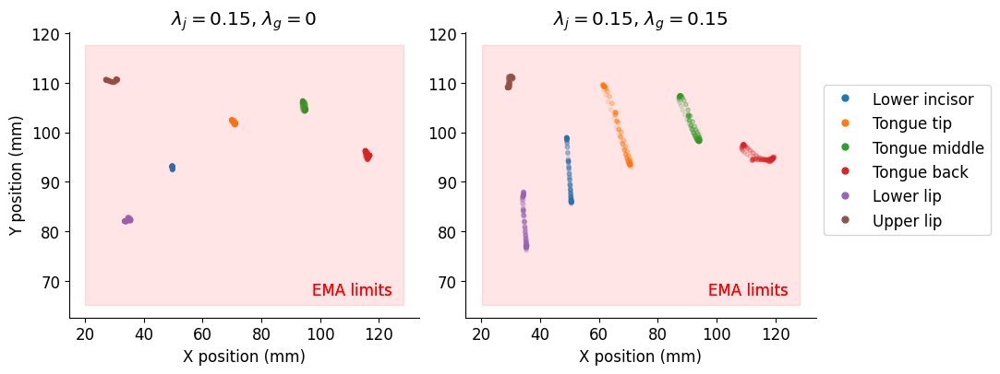

item_0176


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


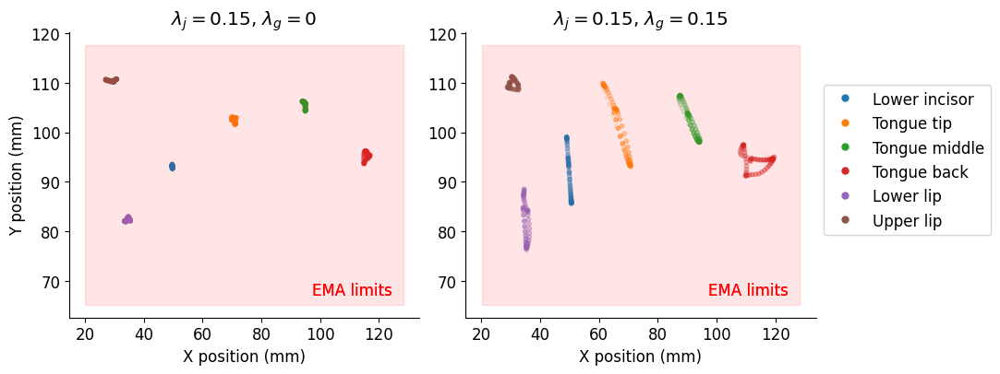

item_0177


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


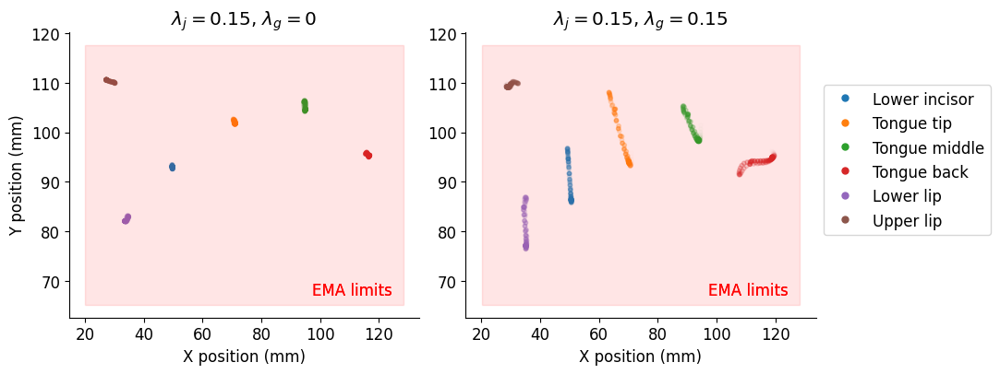

item_0178


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


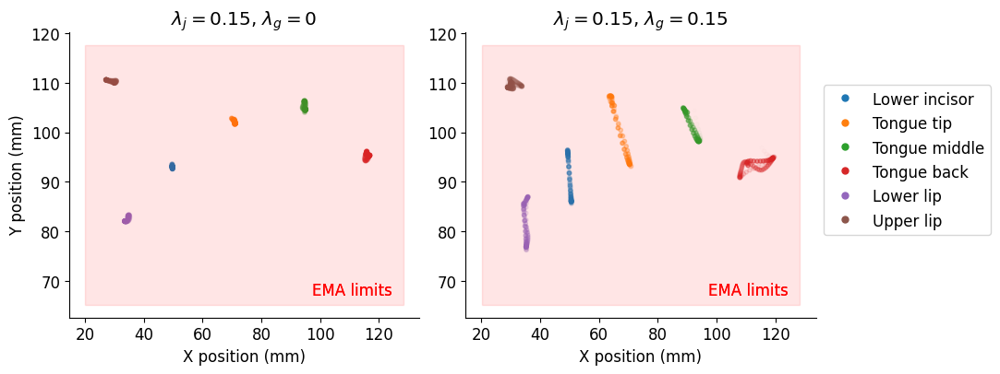

item_0179


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


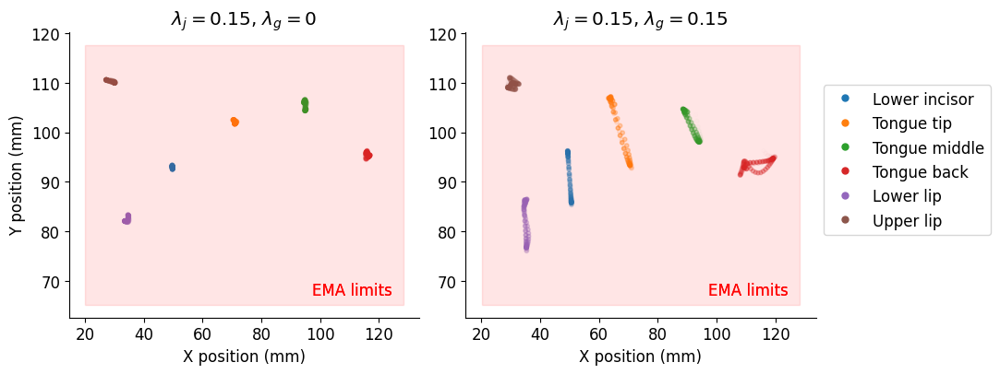

item_0180


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


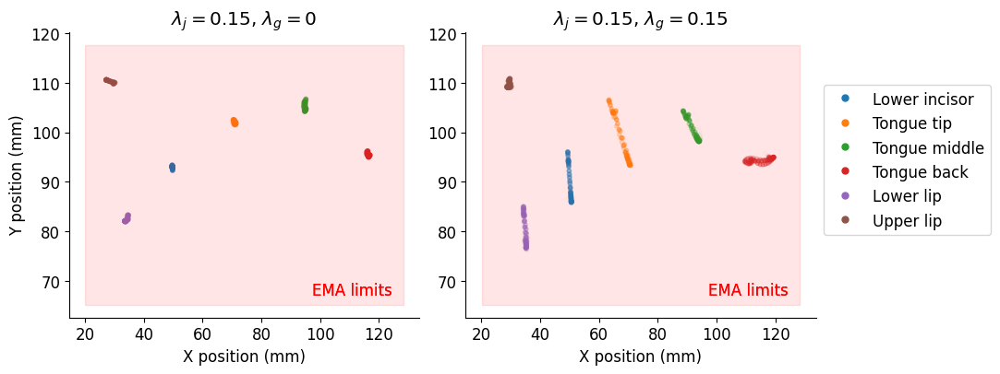

item_0181


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


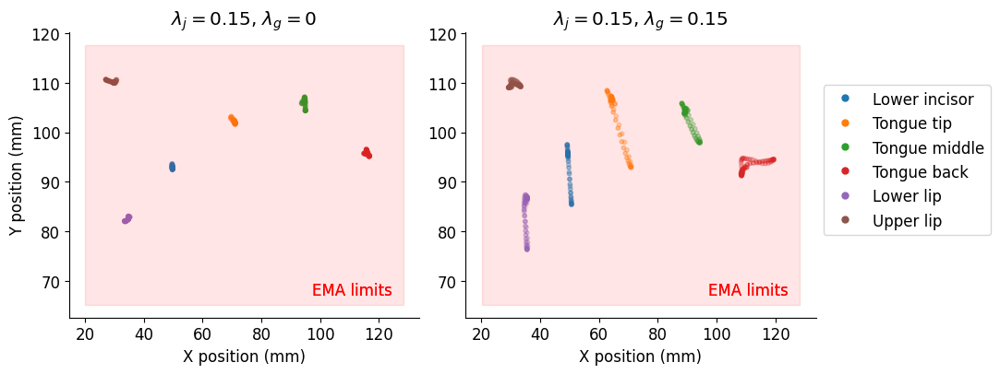

item_0182


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


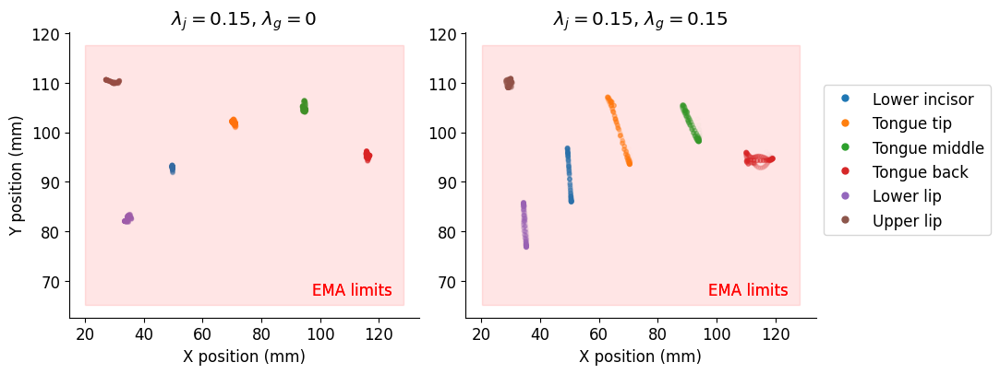

item_0183


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


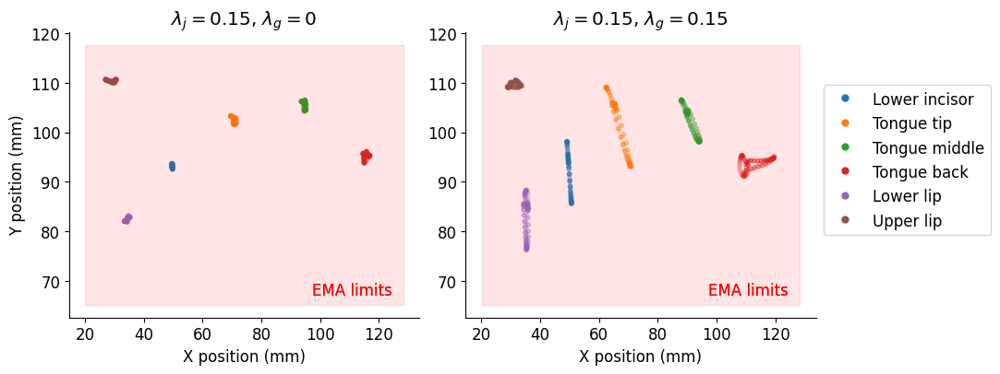

item_0184


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


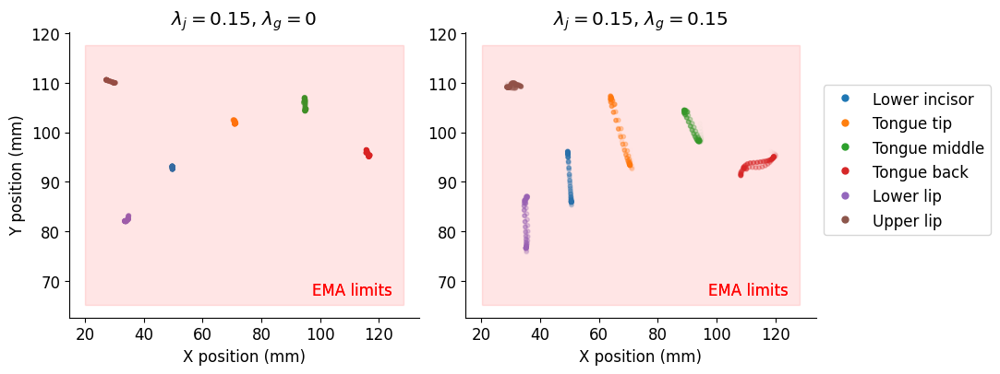

item_0185


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


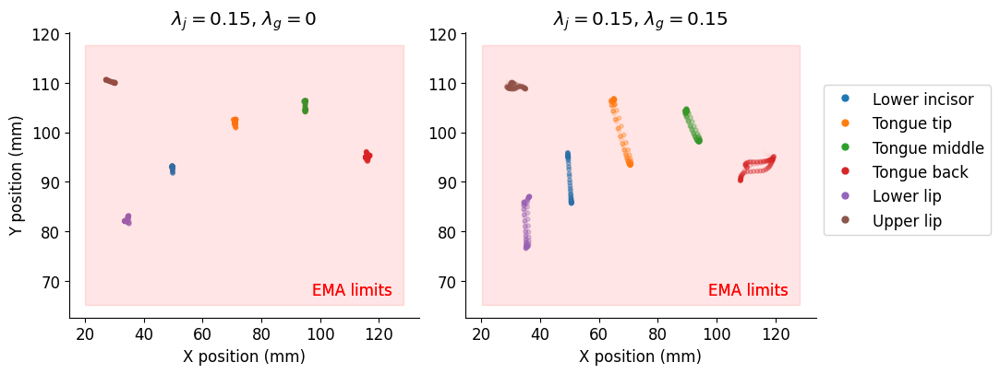

item_0186


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


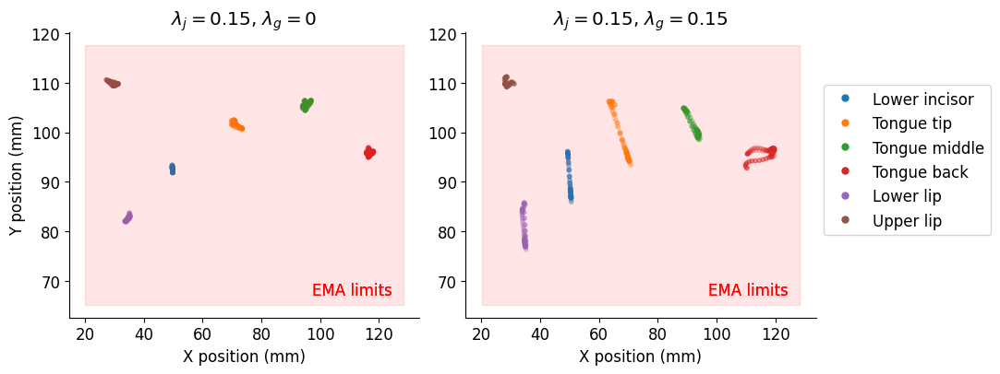

item_0187


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


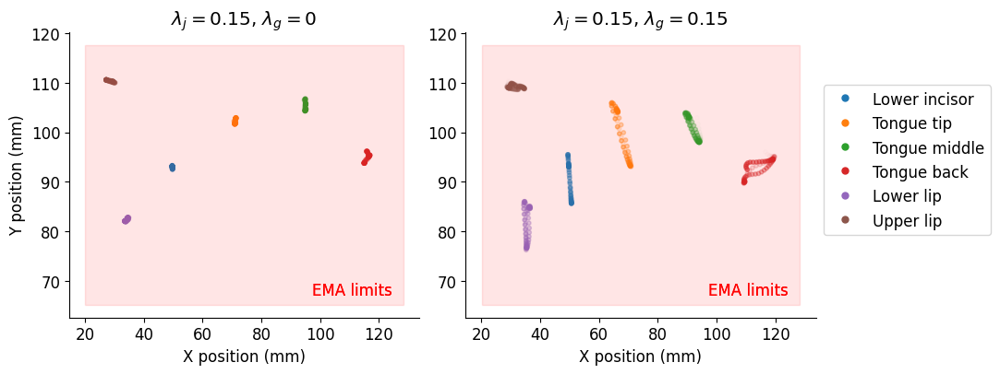

item_0188


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


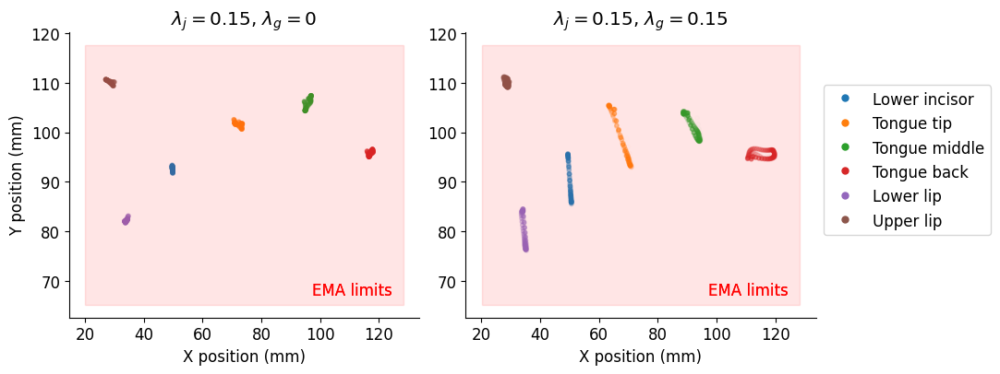

item_0189


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


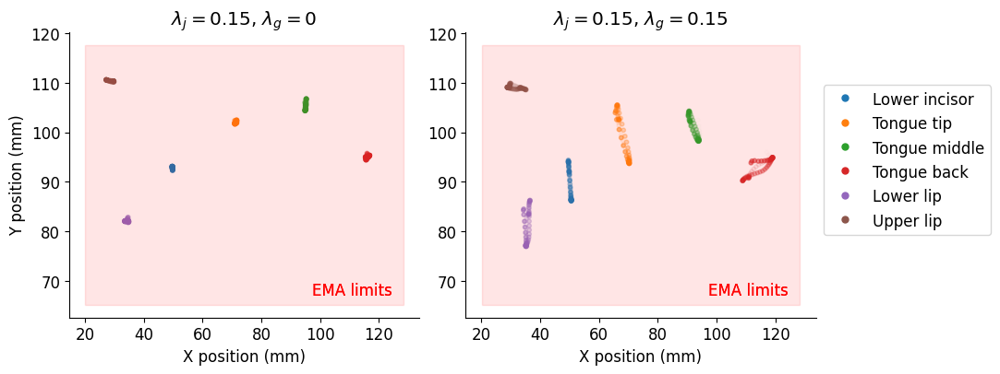

item_0190


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


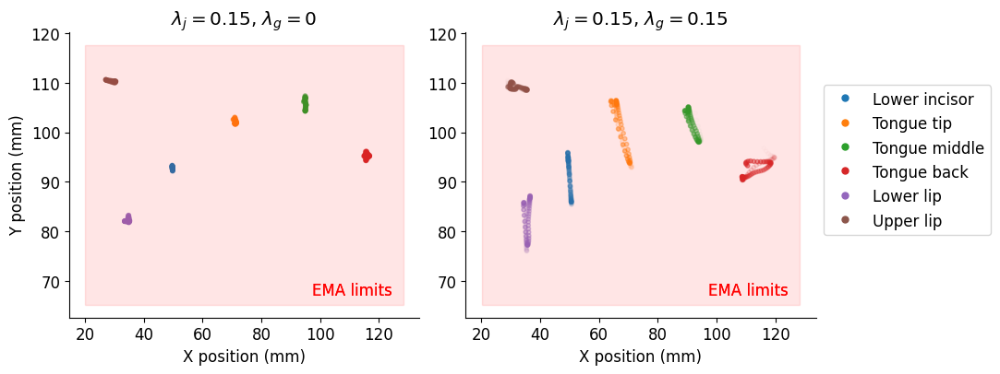

item_0191


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


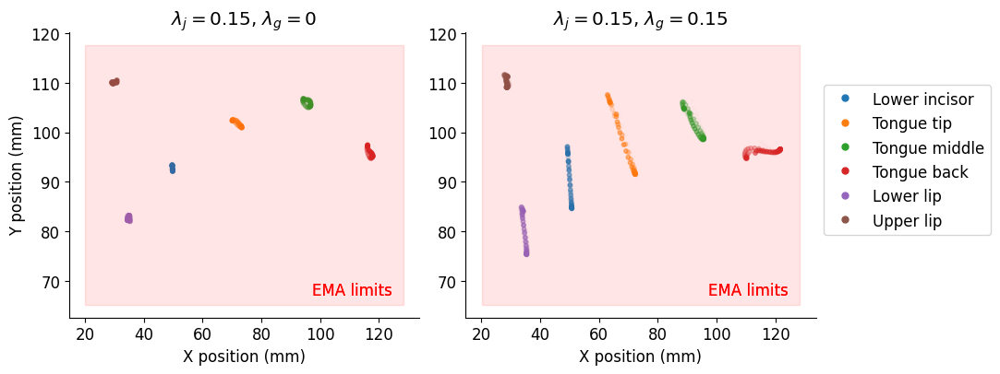

item_0192


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


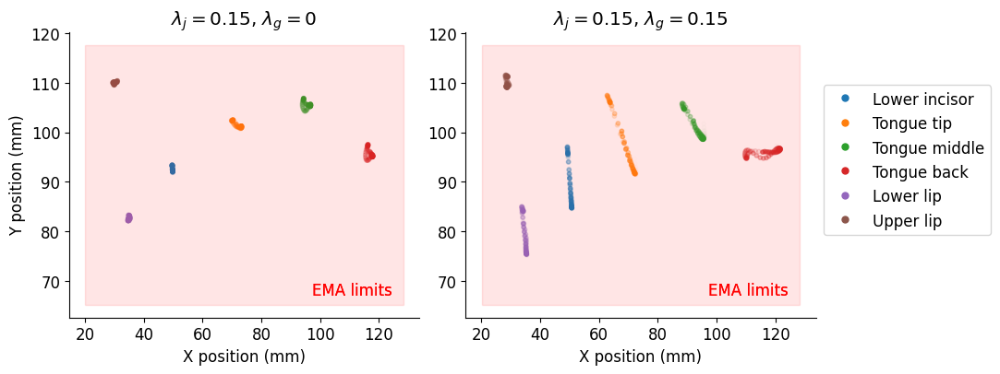

item_0193


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


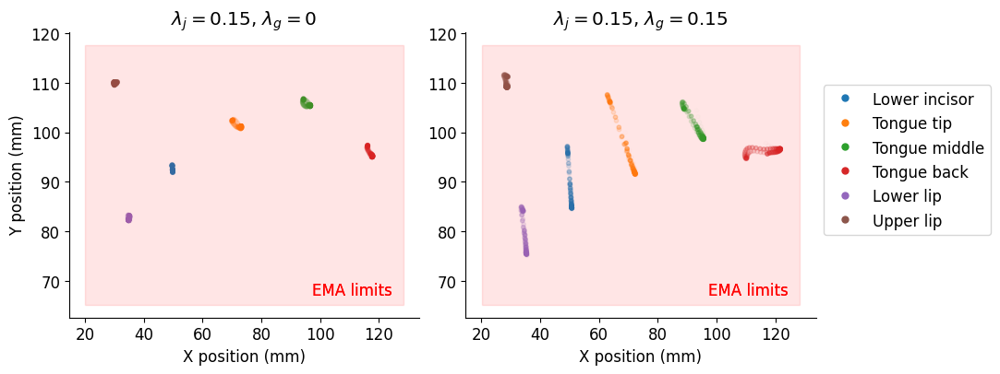

item_0194


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


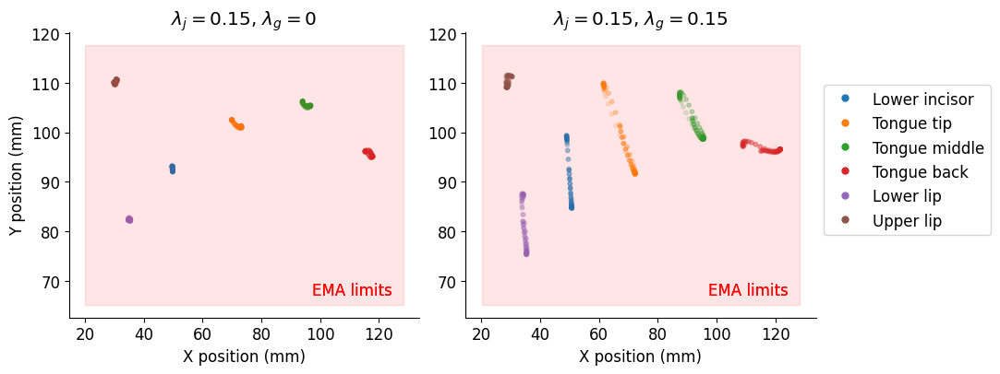

item_0195


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


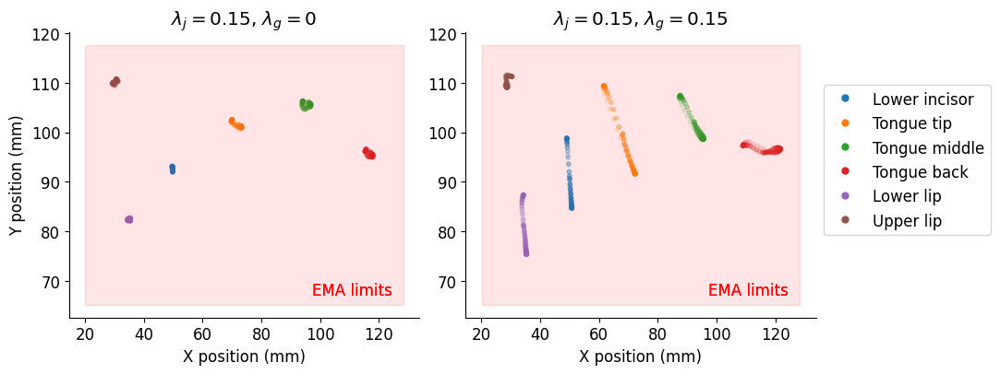

item_0196


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


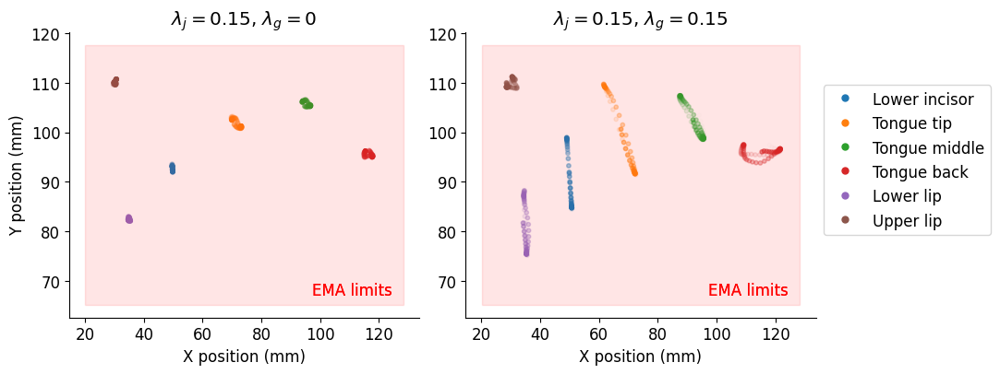

item_0197


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


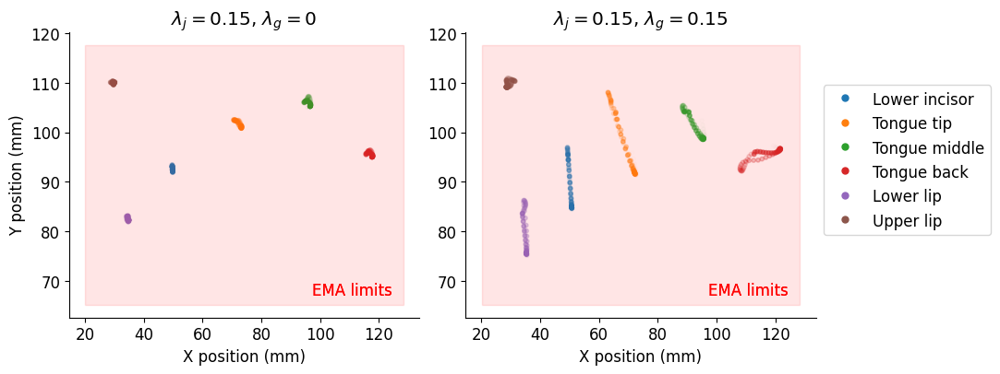

item_0198


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


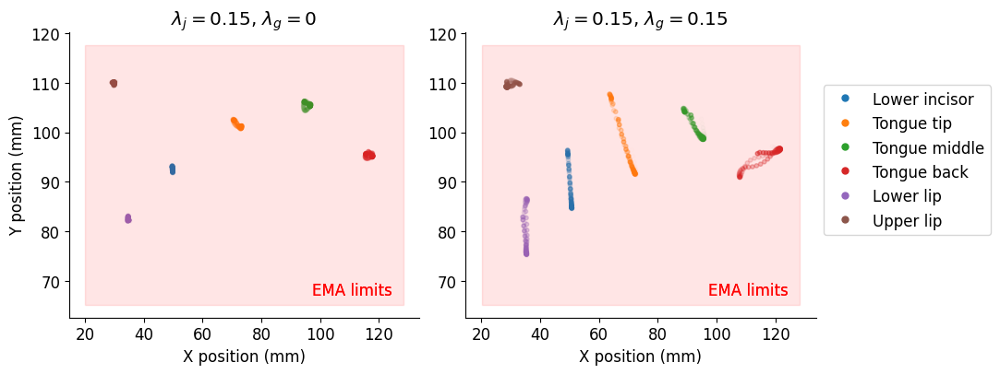

item_0199


/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))
/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


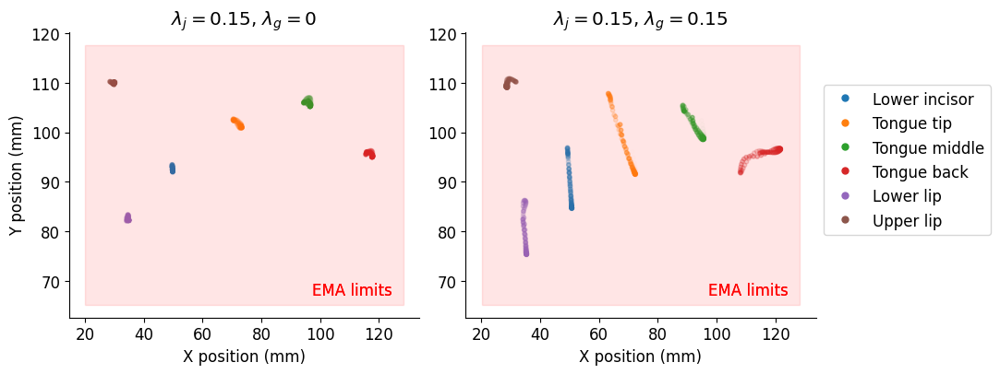

In [4]:
import torch
import matplotlib.pyplot as plt
from communicative_agent import CommunicativeAgent
from lib.dataset_wrapper import Dataset
import matplotlib
import numpy as np
from matplotlib.patches import Rectangle

matplotlib.rcParams['font.family'] = 'sans-serif'
matplotlib.rcParams['font.serif'] = 'Arial'
matplotlib.rcParams.update({'font.size': 12, 'legend.handleheight':1, 'hatch.linewidth': 2.0,
                           'lines.markersize':3, 'lines.linewidth':1.5})

def display_ema(ema, ax, fig, title, marker, nb_points=50, first=False):
    labels = ['Lower incisor', 'Tongue tip', 'Tongue middle', 
              'Tongue back', 'Lower lip', 'Upper lip']
    for counter, label in enumerate(labels):
        x = ema[:,2*counter]#[:nb_points]
        y = ema[:,2*counter+1]#[:nb_points]
        trail_opacity = np.linspace(0, .5, np.shape(x)[0])#[:nb_points]
        ax.scatter(x, y, marker=marker, alpha=trail_opacity, s=40)
        # fake line for legend
        ax.plot( np.NaN, np.NaN, marker = marker, label=labels[counter], linestyle='None', markersize=10)
        ax.set_xlabel('X position (mm)')
        if first:
            ax.set_ylabel('Y position (mm)')
    ax.set_title(title)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    if first:
        h, l = ax.get_legend_handles_labels()
        fig.legend(h, l, bbox_to_anchor=(1.22, 0.8))
   
def get_art(agent, sound_seq):
    nn_input = torch.FloatTensor(agent.sound_scaler.transform(sound_seq)).to("cuda")[
            None, :, :
        ]
    with torch.no_grad():
        _, sound_unit_seq, _, _ = agent.nn.sound_quantizer.encode(nn_input)
        art_seq_estimated_unscaled = agent.nn.inverse_model(sound_unit_seq)
        sound_seq_estimated_unscaled = agent.nn.direct_model(
            art_seq_estimated_unscaled
        )

    sound_seq_estimated_unscaled = sound_seq_estimated_unscaled[0].cpu().numpy()
    art_seq_estimated_unscaled = art_seq_estimated_unscaled[0].cpu().numpy()
    art_seq_estimated = agent.synthesizer.art_scaler.inverse_transform(
        art_seq_estimated_unscaled
    )
    return art_seq_estimated

bn = 'lambda_0'
agents_path = ['../out/communicative_agent/b8c532ecf618116ad1f06d5a341da3ae-0',
               '../out/communicative_agent/22e9cdcab1563dd5a97cce718987db69-0']
markers = ['.', '.']
colors = ['tab:orange', 'tab:red', 'tab:green', 'tab:blue']
titles = ['$\lambda_j=0.15$, $\lambda_g=0$', '$\lambda_j=0.15$, $\lambda_g=0.15$']
cm = 1/2.54

item_name = 'item_0320'
for i in range(0,200):
    
    item_name = 'item_%04d' % i
    print(item_name)
    fig, ax = plt.subplots(1, 2, figsize=(22.4*cm,10.04*cm), constrained_layout=True)

    # Plot estimated trajectories
    for i, agent_path in enumerate(agents_path):
        agent = CommunicativeAgent.reload(agent_path)
        dataset = Dataset('pb2007')
        sound_type = agent.synthesizer.config["dataset"]["sound_type"]
        art_type = agent.synthesizer.config["dataset"]["art_type"]
        synth_dataset = agent.synthesizer.dataset

        items_cepstrum = dataset.get_items_data(sound_type, cut_silences=True)
        item_cepstrum = items_cepstrum[item_name]
        nb_frames = len(item_cepstrum)

        art = get_art(agent, item_cepstrum)
        ema = synth_dataset.art_to_ema(art)
        display_ema(ema, ax[i], fig, title=titles[i], marker=markers[i], nb_points=500, first=i==0)
        xmin, ymin = dataset.ema_limits['xmin'], dataset.ema_limits['ymin']
        xmax, ymax = dataset.ema_limits['xmax'], dataset.ema_limits['ymax']
        heigth = ymax - ymin
        width = xmax - xmin
        ax[0].add_patch(Rectangle((xmin, ymin), width, heigth, color='red', alpha=.05))
        ax[1].add_patch(Rectangle((xmin, ymin), width, heigth, color='red', alpha=.05))
        ax[0].text(.97*xmax, 1.03*ymin, 'EMA limits', color='red', horizontalalignment='right')
        ax[1].text(.97*xmax, 1.03*ymin, 'EMA limits', color='red', horizontalalignment='right')
    plt.savefig(f'/home/engaclew/Downloads/ema_limits_(0.15,0)_vs_(0.15,0.15)/{item_name}.png', dpi=100, bbox_inches='tight')
    plt.show()
#

In [151]:
print(vars(dataset))

{'name': 'pb2007', 'path': '/home/engaclew/agent/lib/../datasets/pb2007', 'infos': {'wav_pathname': './external/raw_datasets/pb2007/_wav16/*.wav', 'ema_pathname': './external/raw_datasets/pb2007/_seq/*.seq', 'ema_format': 'seq', 'ema_sampling_rate': 100, 'ema_scaling_factor': 0.1, 'ema_coils_order': [0, 6, 1, 7, 2, 8, 3, 9, 5, 11, 4, 10], 'ema_needs_lowpass': False, 'lab_pathname': './external/raw_datasets/pb2007/_lab/*.lab', 'lab_resolution': 10000000}, 'features_config': {'ema_sampling_rate': 100, 'wav_sampling_rate': 16000}, 'phones_infos': {'vowels': ['a', 'e^', 'e', 'i', 'y', 'u', 'o', 'o^', 'x', 'x^', 'a~', 'e~', 'x~', 'o~', 'q'], 'consonants': ['p', 'f', 'b', 'v', 'm', 't', 's', 'd', 'z', 'n', 'k', 's^', 'g', 'z^', 'r', 'l', 'w', 'h', 'j'], 'consonant_groups': {'manner': [['p', 'f', 'b', 'v', 'm'], ['t', 's', 'd', 'z', 'n'], ['k', 's^', 'g', 'z^', 'r']], 'place': [['p', 't', 'k'], ['f', 's', 's^'], ['b', 'd', 'g'], ['v', 'z', 'z^']]}, 'notation': {'y': 'y', 'e^': 'ɛ', 'e~': 'ɛ̃'

In [1]:
import sys
import os
sys.path.append("..")

from glob import glob
import matplotlib.pyplot as plt
import ipywidgets as ipw
from IPython.display import Audio
import numpy as np
import pickle
from tqdm.notebook import tqdm

from communicative_agent import CommunicativeAgent
from lib.dataset_wrapper import Dataset
from lib.notebooks import show_ema

from external import lpcynet

# Wav that need to be resynthesized for perceptual tests
to_produce = ["item_0000", "item_0001", "item_0002", "item_0003", "item_0004", "item_0005", 
 "item_0006", "item_0007", "item_0010", "item_0331", "item_0332", "item_0333", 
 "item_0334", "item_0335", "item_0338", "item_0339", "item_0340", "item_0341", 
 "item_0342", "item_0392", "item_0393", "item_0394", "item_0395", "item_0396", 
 "item_0397", "item_0398", "item_0399", "item_0400", "item_0401", "item_0427", 
 "item_0428", "item_0429", "item_0433", "item_0434", "item_0435", "item_0436", 
 "item_0437", "item_0438", "item_0439"]

# To change
agent_path = '../out/communicative_agent/62f8def558c460813f27cf80a64eab2b-0'
out = '/home/engaclew/Downloads/agent_perceptual_tests_n_layers_2_k_512/62f8def558c460813f27cf80a64eab2b-0_jerk_0.05_gan_0.05'
os.makedirs(out, exist_ok=True)
agent = CommunicativeAgent.reload(agent_path)
dataset = Dataset('pb2007')
sound_type = agent.synthesizer.config["dataset"]["sound_type"]
art_type = agent.synthesizer.config["dataset"]["art_type"]
synth_dataset = agent.synthesizer.dataset
items_cepstrum = dataset.get_items_data(sound_type, cut_silences=True)
items_source = dataset.get_items_data("source", cut_silences=True)
items_lab = dataset._get_items_transcription()
for item_name in tqdm(to_produce):
    print(item_name, items_lab[item_name])
    item_cepstrum = items_cepstrum[item_name]
    item_source = items_source[item_name]
    item_wave = dataset.get_item_wave(item_name)
    nb_frames = len(item_cepstrum)

    repetition = agent.repeat(item_cepstrum)
    repeated_cepstrum = repetition["sound_repeated"]
    estimated_cepstrum = repetition["sound_estimated"]
    estimated_art = repetition["art_estimated"]

    repeated_sound = np.concatenate((repeated_cepstrum, item_source), axis=1)
    estimated_sound = np.concatenate((estimated_cepstrum, item_source), axis=1)

    repeated_wave = lpcynet.synthesize_frames(repeated_sound)
    estimated_wave = lpcynet.synthesize_frames(estimated_sound)

    # save item_wave and repeated sound
    repeated_wave = Audio(repeated_wave, rate=16000)
    with open(('%s/repeated_%s.wav' % (out, item_name)), 'wb') as f:
            f.write(repeated_wave.data)

  0%|          | 0/39 [00:00<?, ?it/s]

item_0000 a
item_0001 ɛ
item_0002 e
item_0003 i
item_0004 y
item_0005 u
item_0006 o
item_0007 ø
item_0010 ə
item_0331 aba
item_0332 ada
item_0333 aga
item_0334 ava
item_0335 aza
item_0338 aʒa
item_0339 ama
item_0340 ana
item_0341 aʁa
item_0342 ala
item_0392 ibi
item_0393 idi
item_0394 igi
item_0395 ivi
item_0396 izi
item_0397 iʒi
item_0398 imi
item_0399 ini
item_0400 iʁi
item_0401 ili
item_0427 ubu
item_0428 udu
item_0429 ugu
item_0433 uvu
item_0434 uzu
item_0435 uʒu
item_0436 umu
item_0437 unu
item_0438 uʁu
item_0439 ulu


In [85]:
# Compute target repetion loss
agent_path = '/home/engaclew/agent/out/communicative_agent/to_keep_50_n_layers_1_right_test/22e9cdcab1563dd5a97cce718987db69-0'
agent = CommunicativeAgent.reload(agent_path)
dataset = Dataset('pb2007')
sound_type = agent.synthesizer.config["dataset"]["sound_type"]
art_type = agent.synthesizer.config["dataset"]["art_type"]
synth_dataset = agent.synthesizer.dataset
items_cepstrum = dataset.get_items_data(sound_type, cut_silences=True)
items_art = dataset.get_items_data('art_params', cut_silences=True)

mse_all = torch.FloatTensor()
for item_name in agent.datasplits['pb2007'][1]:
    # Quantize real sound
    item_cepstrum = torch.FloatTensor(items_cepstrum[item_name]).unsqueeze(dim=0).cuda()
    _, _, _, sound_units = agent.nn.sound_quantizer.encode(item_cepstrum)
    
    # Quantize sound synthesized from real articulatory trajectories
    item_art = items_art[item_name]
    sound_from_real_art = torch.FloatTensor(agent.synthesizer.synthesize(item_art)).unsqueeze(dim=0).cuda()
    _, _, _, sound_units_from_real_art = agent.nn.sound_quantizer.encode(sound_from_real_art)
    mse = ((sound_units_from_real_art - sound_units) ** 2).cpu()
    mse_all = torch.cat((mse_all, mse), dim=1)
print(mse_all.mean())
    

/home/engaclew/miniconda3/envs/agent/lib/python3.7/site-packages/torch/nn/modules/rnn.py:70: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.17 and num_layers=1
  "num_layers={}".format(dropout, num_layers))


tensor(0.0384, grad_fn=<MeanBackward0>)
